# An Exploratory Data Analysis of the Landscape of Mental Well-being

In the context of the course "Data Analysis in Software Engineering" from the Master in Software Engineering at the Faculty of Engineering from the University of Porto, we performed an exploratory data analysis on a [dataset](https://www.kaggle.com/datasets/bhavikjikadara/mental-health-dataset) related to mental well-being. 

With this analysis, our goal was to get insights into the mental health landscape, understand patterns and train models that can predict important red flags in mental health.

We first started with analzying the dataset and perform data cleaning operations, if needed.

In [ ]:
# Data preprocessing library imports
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder

# Clustering library imports
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

# Classification related imports
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC



2025-06-04 00:41:31.927757: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Data Preprocessing

In [2]:
# use pandas to read dataset csv
mental_health_data = pd.read_csv('../dataset/mental_health_dataset.csv')

print(f"Number of rows: {mental_health_data.shape[0]}")
print(f"Number of features: {mental_health_data.shape[1]}")

# use describe method to get insights on the dataset features and their composition
mental_health_data.describe()

Number of rows: 292364
Number of features: 17


,Timestamp,Gender,Country,Occupation,self_employed,family_history,treatment,Days_Indoors,Growing_Stress,Changes_Habits,Mental_Health_History,Mood_Swings,Coping_Struggles,Work_Interest,Social_Weakness,mental_health_interview,care_options
count,292364,292364,292364,292364,287162,292364,292364,292364,292364,292364,292364,292364,292364,292364,292364,292364,292364
unique,580,2,35,5,2,2,2,5,3,3,3,3,2,3,3,3,3
top,8/27/2014 11:43,Male,United States,Housewife,No,No,Yes,1-14 days,Maybe,Yes,No,Medium,No,No,Maybe,No,No
freq,2384,239850,171308,66351,257994,176832,147606,63548,99985,109523,104018,101064,154328,105843,103393,232166,118886


From the previous commands, it is possible to observe that the dataset has a total of 17 features and a total number of 292 364 entries (we will assume that each entry maps to a real person). 

In addition, from the frequency line of the "describe" table it is clear that some features have unbalanced values, such as "gender" and "self employed". The latter feature also has less entries than the rest, which means there are many entries with null values for self_employed.

To make our dataset cleaner before going into the exploratory analysis we will remove the null values, the duplicated entries and the "Timestamp" feature that does not provide meaningful value.

In [3]:
mental_health_data = mental_health_data.dropna().drop_duplicates().drop("Timestamp", axis=1)

mental_health_data.describe()


,Gender,Country,Occupation,self_employed,family_history,treatment,Days_Indoors,Growing_Stress,Changes_Habits,Mental_Health_History,Mood_Swings,Coping_Struggles,Work_Interest,Social_Weakness,mental_health_interview,care_options
count,284858,284858,284858,284858,284858,284858,284858,284858,284858,284858,284858,284858,284858,284858,284858,284858
unique,2,35,5,2,2,2,5,3,3,3,3,2,3,3,3,3
top,Male,United States,Housewife,No,No,Yes,1-14 days,Maybe,Yes,No,Medium,No,No,Maybe,No,No
freq,234000,165869,64728,255711,172357,143331,61994,97540,106844,101474,98592,150318,103136,100746,227036,115233


Now, with the dataset cleaner, we can analyze each feature to evaluate if further adjustments are needed.

In [4]:
# to make the feature naming consistent we will change the features names to be all lower-cased.
mental_health_data.columns = [col.lower() for col in mental_health_data.columns]

In [5]:
def analyze_feature(df, feature):
    """
    Utility method to facilitate individual feature analysis.
    It may plot a histogra, countplot, pie char or boxplot depending on the feature type (numerical or categorical)
    """

    data = df[feature]
    unique_vals = data.unique()
    num_unique = len(unique_vals)
    
    print(f"\nFeature: {feature}")
    print(f"Data Type: {df[feature].dtype}")
    print(f"Number of Unique Values: {num_unique}")
    print(f"Unique Values (sample): {unique_vals[:10]}\n")
    print(f"Value Counts:\n{df[feature].value_counts().to_string()}\n")
    
    plt.figure(figsize=(18, 5))
    
    plt.subplot(1, 3, 1)
    if pd.api.types.is_numeric_dtype(data):
        sns.histplot(data, kde=True)
        plt.title(f'{feature} - Histogram')
    else:
        sns.countplot(y=feature, data=df, order=df[feature].value_counts().index)
        plt.title(f'{feature} - Count Plot')

    # if it has too many unique values, the pie chart would be unreadable
    if num_unique <= 10:
        plt.subplot(1, 3, 2)
        data.value_counts().plot.pie(autopct='%1.1f%%', startangle=90, counterclock=False)
        plt.title(f'{feature} - Pie Chart')
        plt.ylabel('')
    
    if pd.api.types.is_numeric_dtype(data):
        plt.subplot(1, 3, 3)
        sns.boxplot(x=data)
        plt.title(f'{feature} - Box Plot')
    
    plt.tight_layout()
    plt.show()


### Gender Feature


Feature: gender
Data Type: object
Number of Unique Values: 2
Unique Values (sample): ['Female' 'Male']

Value Counts:
gender
Male      234000
Female     50858



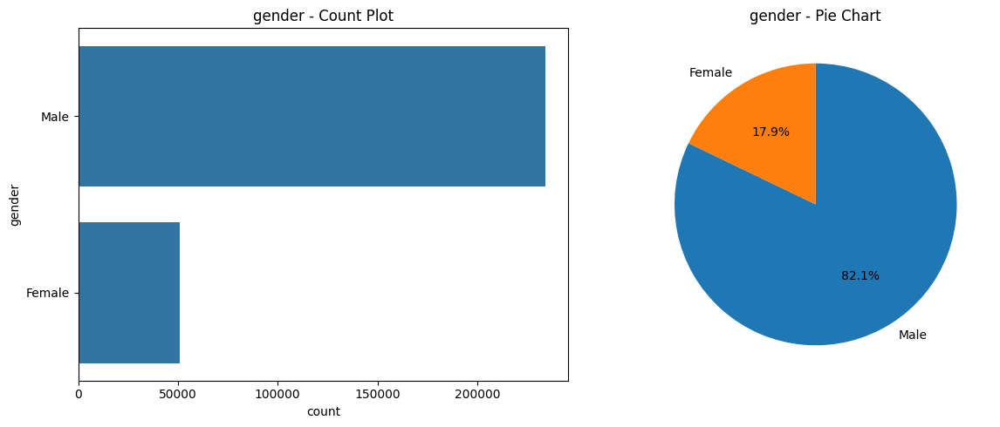

In [6]:
analyze_feature(mental_health_data, "gender")

The "gender" feature pertains to the gender of the person whose information was gathered and, for the dataset, it has two unique values "Male" and "Female".

We can observe that the dataset is heavily populated with "Male" samples, having a 82.1% weight.

### Country Feature


Feature: country
Data Type: object
Number of Unique Values: 35
Unique Values (sample): ['United States' 'Poland' 'Australia' 'Canada' 'United Kingdom'
 'South Africa' 'Sweden' 'New Zealand' 'Netherlands' 'India']

Value Counts:
country
United States             165869
United Kingdom             50576
Canada                     17529
Australia                   6014
Netherlands                 5891
Ireland                     5542
Germany                     4680
Sweden                      2812
India                       2771
France                      2340
Brazil                      2340
New Zealand                 1991
South Africa                1991
Switzerland                 1560
Israel                      1560
Italy                       1560
Belgium                      821
Poland                       821
Russia                       780
Denmark                      780
Singapore                    780
Greece                       780
Czech Republic               390
Geor

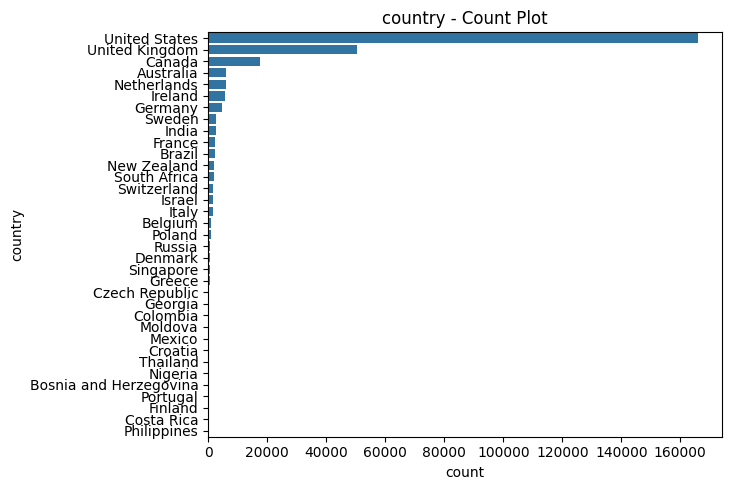

In [7]:
analyze_feature(mental_health_data, "country")

The "country" feature pertains to the country of the person whose information was gathered. 

There are a total of 35 countries; however most of the samples are concentrated on the values "United States, "United Kingdom" and "Canada".

### Occupation Feature


Feature: occupation
Data Type: object
Number of Unique Values: 5
Unique Values (sample): ['Corporate' 'Student' 'Business' 'Housewife' 'Others']

Value Counts:
occupation
Housewife    64728
Student      60164
Corporate    59614
Others       51430
Business     48922



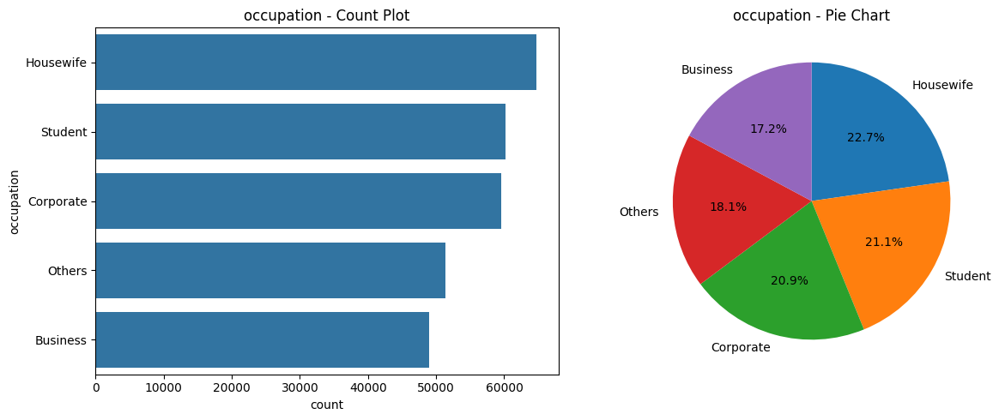

In [8]:
analyze_feature(mental_health_data, "occupation")

The "occupation" feature pertains to the full-time occupation of the person whose information was gathered. 

There are a total of 5 different ocupations, namely, "Housewife", "Student", "Corporate", "Others" and "Business", which are almost evenly distributed.

### Self Employed Feature


Feature: self_employed
Data Type: object
Number of Unique Values: 2
Unique Values (sample): ['No' 'Yes']

Value Counts:
self_employed
No     255711
Yes     29147



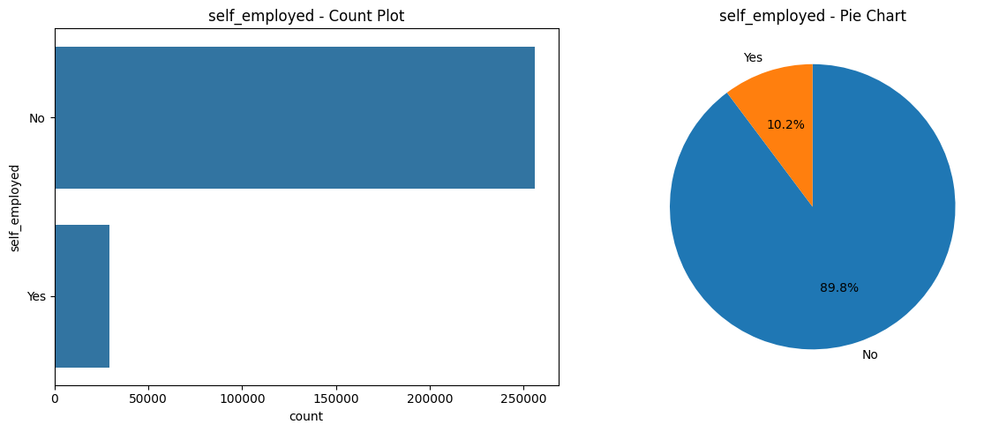

In [9]:
analyze_feature(mental_health_data, "self_employed")

The "self_employed" feature pertains to the employment status of the person whose information was gathered, meaning if they are either business owners or working for someone else.

Since this is a binary feature there are only two possible answers, "Yes" and "No", but most of people (~90%) from the dataset are working for someone else.

### Family History Feature


Feature: family_history
Data Type: object
Number of Unique Values: 2
Unique Values (sample): ['Yes' 'No']

Value Counts:
family_history
No     172357
Yes    112501



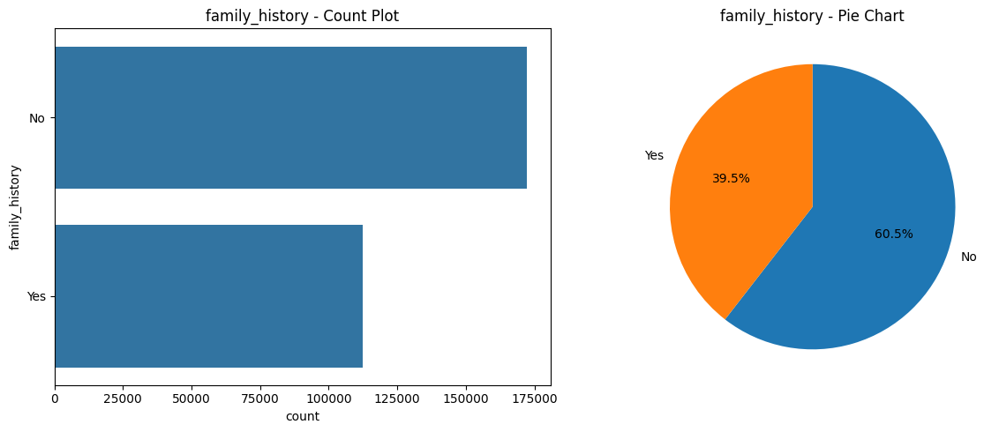

In [10]:
analyze_feature(mental_health_data, "family_history")

The "family_history" feature pertains to the mental health family history record of the person whose information was gathered, meaning if any member of their family has had problems with their mental health.

Since this is a binary feature there are only two possible answers, "Yes" and "No", but most of people (~61%) from the dataset have not had any family member with mental health problems. 

### Treatment Feature


Feature: treatment
Data Type: object
Number of Unique Values: 2
Unique Values (sample): ['Yes' 'No']

Value Counts:
treatment
Yes    143331
No     141527



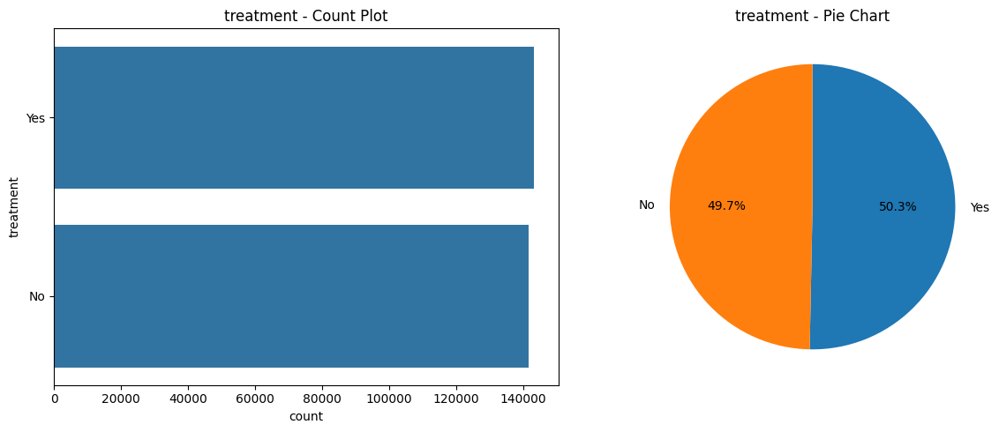

In [11]:
analyze_feature(mental_health_data, "treatment")

The "treatment" feature pertains to the current mental health treatment of the person whose information was gathered, meaning if at the time of answering the person is undergoing a specific treatment.

Since this is a binary feature there are only two possible answers, "Yes" and "No", however, the samples were nearly evenly distributed.

### Days Indoors Feature


Feature: days_indoors
Data Type: object
Number of Unique Values: 5
Unique Values (sample): ['1-14 days' 'Go out Every day' 'More than 2 months' '15-30 days'
 '31-60 days']

Value Counts:
days_indoors
1-14 days             61994
31-60 days            58984
Go out Every day      56938
More than 2 months    54430
15-30 days            52512



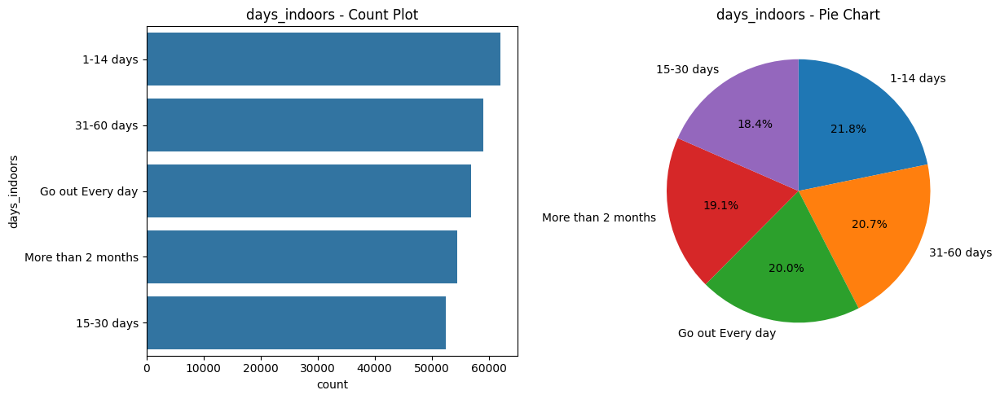

In [12]:
analyze_feature(mental_health_data, "days_indoors")

The "days_indoors" feature pertains to the physical activity routine of the person whose information was gathered, meaning the amount of days that are spent in doors without any outside time.

For this feature there were 5 unique values, namely, "Go out Every day", "1-14 days", "15-30 days", "31-60 days" and "More than 2 months". The samples were evenly distributed among the 5 different values.

### Growing Stress Feature


Feature: growing_stress
Data Type: object
Number of Unique Values: 3
Unique Values (sample): ['Yes' 'No' 'Maybe']

Value Counts:
growing_stress
Maybe    97540
Yes      96978
No       90340



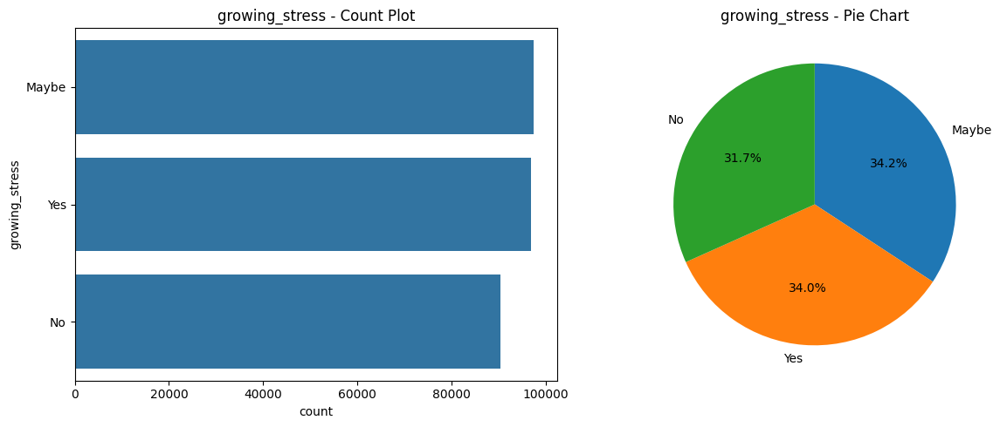

In [13]:
analyze_feature(mental_health_data, "growing_stress")

The "growing_stress" feature pertains to the feeling of sensing a stress increase of the person whose information was gathered.

For this feature there were 3 unique values, namely, "No", "Maybe", "Yes", whose samples were almost evenly distributed.

### Changes Habits Feature


Feature: changes_habits
Data Type: object
Number of Unique Values: 3
Unique Values (sample): ['No' 'Yes' 'Maybe']

Value Counts:
changes_habits
Yes      106844
Maybe     92602
No        85412



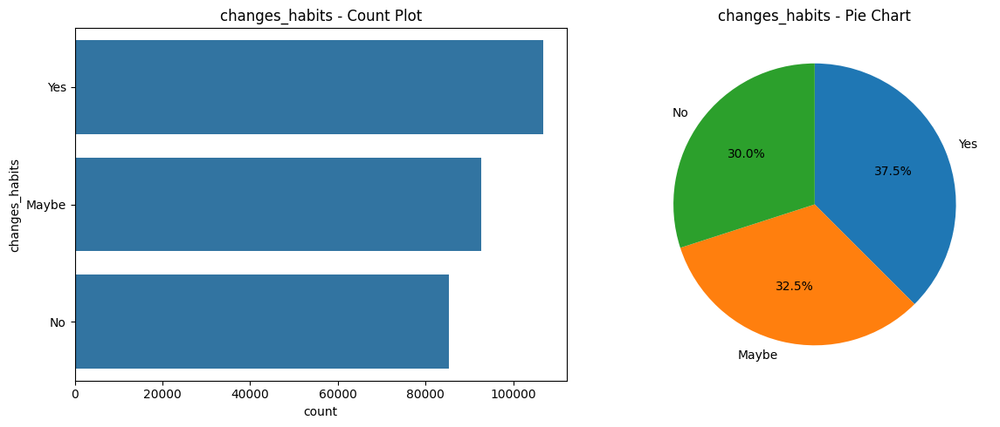

In [14]:
analyze_feature(mental_health_data, "changes_habits")

The "changes_habits" feature pertains to the impact of recent change of habits on the mental health of the person whose information was gathered.

Since this is a ternary feature there are three possible answers "Yes", "Maybe", and "No", however, the samples were nearly evenly distributed.

The answer "Maybe" can be interpreted as people that are not sure if the change of habits has impacted their mental health at any level. 

### Mental Health History Feature


Feature: mental_health_history
Data Type: object
Number of Unique Values: 3
Unique Values (sample): ['Yes' 'No' 'Maybe']

Value Counts:
mental_health_history
No       101474
Maybe     92808
Yes       90576



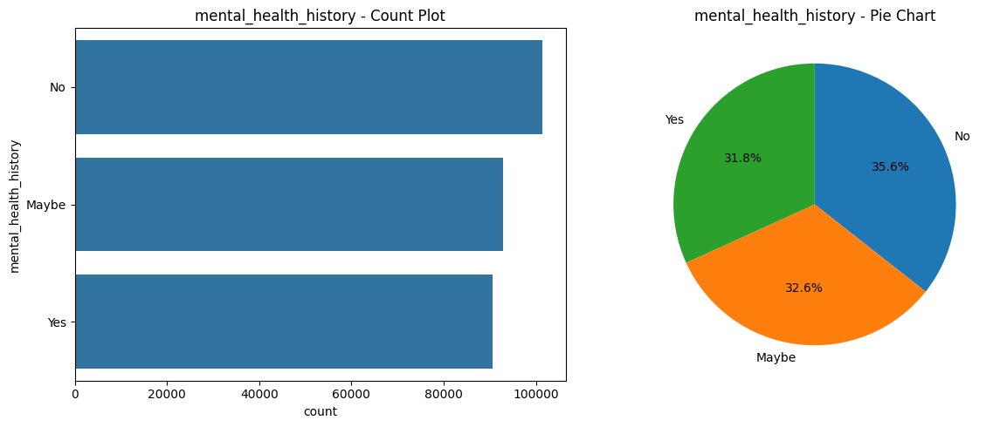

In [15]:
analyze_feature(mental_health_data, "mental_health_history")

The "mental_health_history" feature, similarly to the "family_history" pertains to the mental health history record of the person whose information was gathered.

Since this is a ternary feature there are three possible answers "Yes", "Maybe", and "No", however, the samples were nearly evenly distributed.

The answer "Maybe" can be interpreted as people that were not officially diagnosed but felt the common symptoms. 

### Mood Swings Feature


Feature: mood_swings
Data Type: object
Number of Unique Values: 3
Unique Values (sample): ['Medium' 'Low' 'High']

Value Counts:
mood_swings
Medium    98592
Low       97392
High      88874



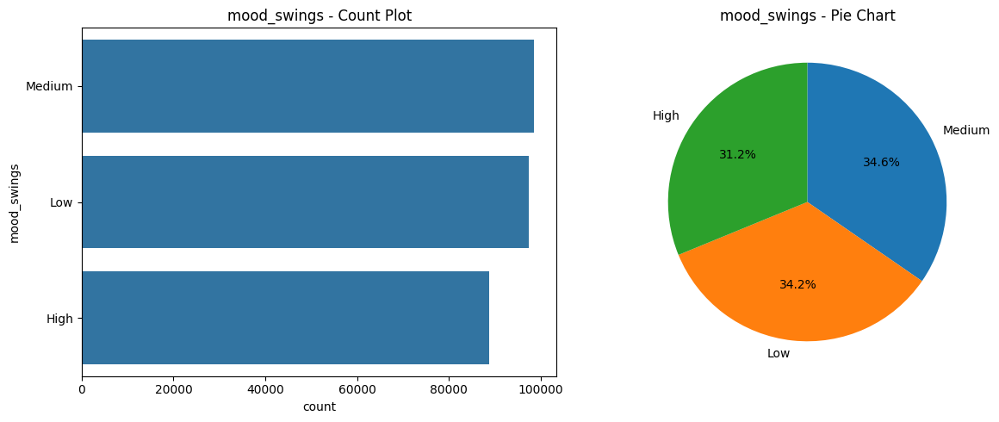

In [16]:
analyze_feature(mental_health_data, "mood_swings")

The "mood_swings" feature pertains to the frequency of mood swings the person whose information was gathered goes through.

For this ordinal feature there were 3 unique values, namely, "Low", "Medium", "High", whose samples were almost evenly distributed.

### Coping Struggles Feature


Feature: coping_struggles
Data Type: object
Number of Unique Values: 2
Unique Values (sample): ['No' 'Yes']

Value Counts:
coping_struggles
No     150318
Yes    134540



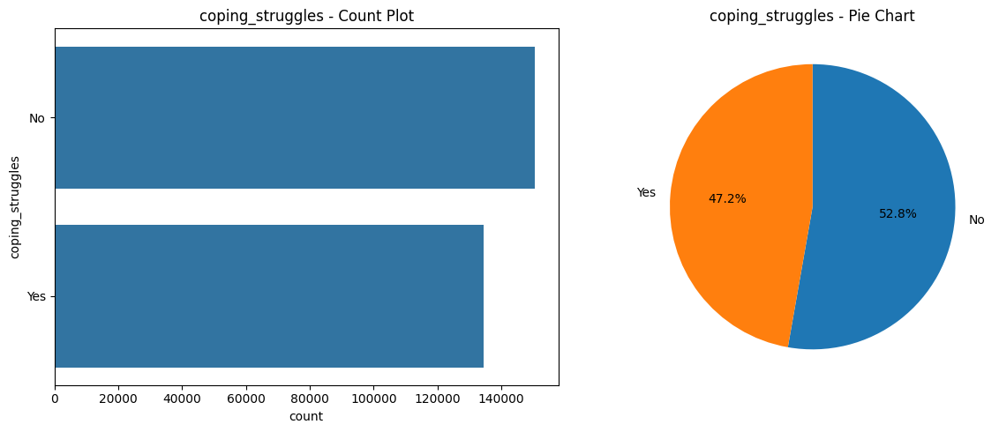

In [17]:
analyze_feature(mental_health_data, "coping_struggles")

The "coping_struggles" feature pertains to the existent life-struggles the person whose information was gathered is coping with.

Since this is a binary feature there are only two possible answers, "Yes" and "No", however, the samples were nearly evenly distributed.

### Work Interest Feature


Feature: work_interest
Data Type: object
Number of Unique Values: 3
Unique Values (sample): ['No' 'Maybe' 'Yes']

Value Counts:
work_interest
No       103136
Maybe     98592
Yes       83130



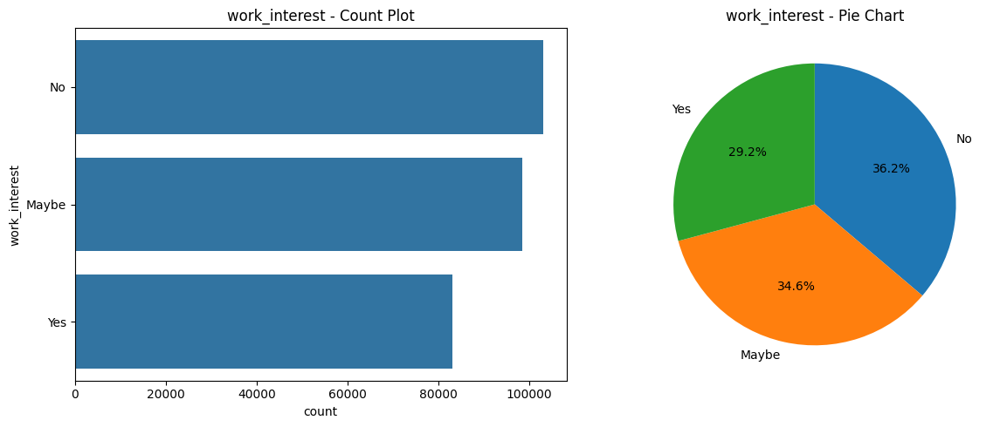

In [18]:
analyze_feature(mental_health_data, "work_interest")

The "work_interest" feature, pertains to the level of interest the person whose information was gathered feels at their full-time work.

Since this is a ternary feature there are three possible answers "Yes", "Maybe", and "No", however, the samples were nearly evenly distributed.

The answer "Maybe" can be interpreted as people that fluctuate between being interested and not being interested. 

### Social Weakness Feature


Feature: social_weakness
Data Type: object
Number of Unique Values: 3
Unique Values (sample): ['Yes' 'No' 'Maybe']

Value Counts:
social_weakness
Maybe    100746
No        94746
Yes       89366



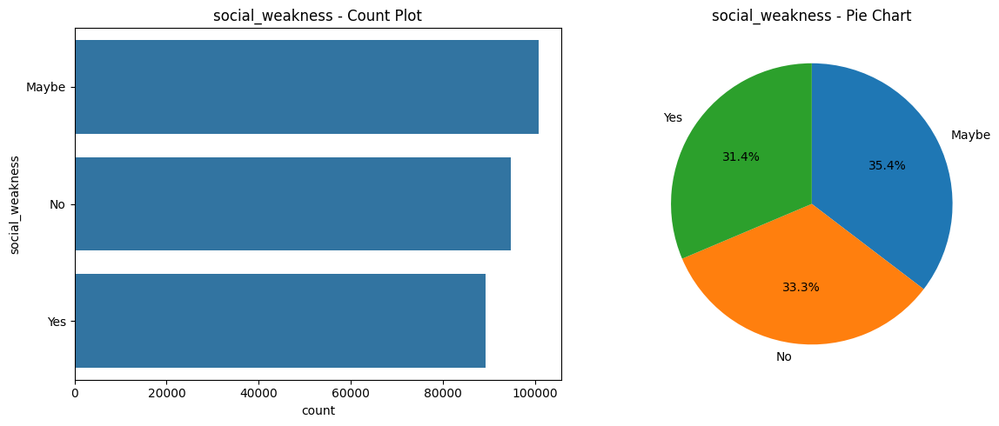

In [19]:
analyze_feature(mental_health_data, "social_weakness")

The "social_weakness" feature, pertains to the level of social skills the person whose information was gathered has.

Since this is a ternary feature there are three possible answers "Yes", "Maybe", and "No", however, the samples were nearly evenly distributed.

The answer "Maybe" can be interpreted as people whose energy influences their social capabilities. 

### Mental Health Interview Feature


Feature: mental_health_interview
Data Type: object
Number of Unique Values: 3
Unique Values (sample): ['Maybe' 'No' 'Yes']

Value Counts:
mental_health_interview
No       227036
Maybe     49981
Yes        7841



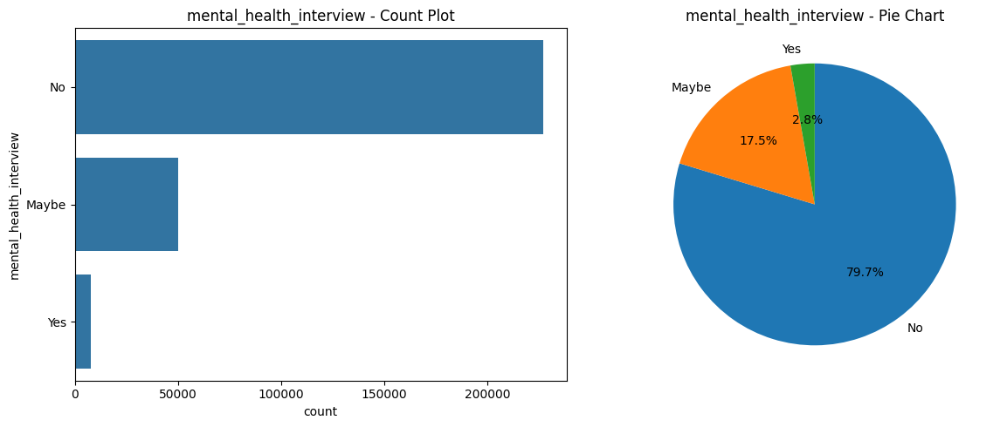

In [20]:
analyze_feature(mental_health_data, "mental_health_interview")

The "mental_health_interview" feature, pertains to the interest of whose information was gathered participating in an mental health interview.

Since this is a ternary feature there are three possible answers "Yes", "Maybe", and "No", the one that was the most frequent (~80%) was the answer "No".

### Care Options


Feature: care_options
Data Type: object
Number of Unique Values: 3
Unique Values (sample): ['Yes' 'Not sure' 'No']

Value Counts:
care_options
No          115233
Yes          93577
Not sure     76048



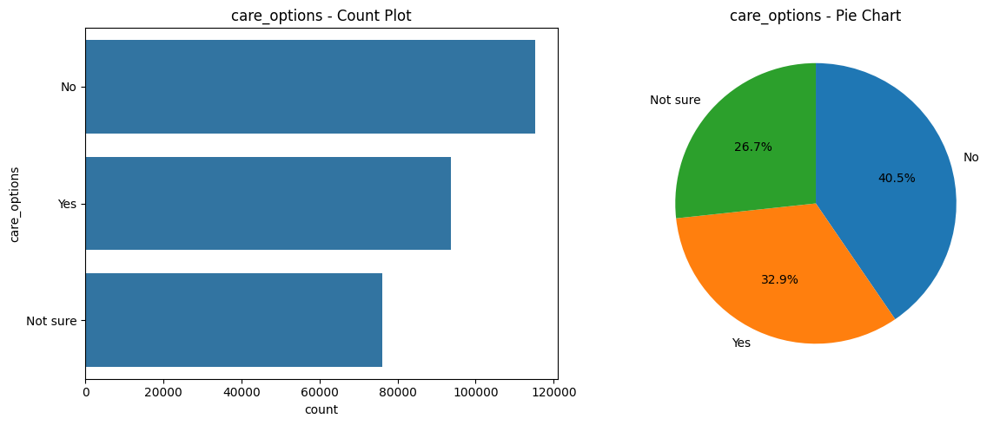

In [21]:
analyze_feature(mental_health_data, "care_options")

The "care_options" feature, pertains to the knowledge whose information was gathered on the available mental health care options.

Since this is a ternary feature there are three possible answers "Yes", "Not sure", and "No", the one that was the most frequent (~40%) was the answer "No".

### Feature Analysis Remarks

After inspecting each feature individually, although most features seem balanced and evenly distributed there were three features that mostly stood out due to their unbalanced data:
- "gender", with predominant "Male" samples.
- "country", with predominant "United States", "United Kingdom" and "Canada" samples.
- "self-employed", with predominant "No" samples.

In addition, many features that seem to be binary features, are actually ternary features due to indecisiveness (answers like "Maybe" or "Not sure"), which might be adding unvaluable information and noise for actual patterns.

Having this in mind, before performing classification tasks we will analyze what dataset variation makes more sense, has higher features correlation and provides meaningful conclusions.

We will have the following variations:
- The untouched dataset;
- Anglophone countries only (keeping only the "United States", "United Kingdom" and "Canada" samples);
- Removing the indecided samples (Maybe or Not sure);
- Male
- Decided Male
- Female
- Rest of the world
- United States Only

In [ ]:
# utility functions for dataset variations

def get_transformed_dataframe(preprocessor, dataset):

    # Fit the preprocessor on the dataset
    preprocessor.fit(dataset)

    # Transform the dataset
    transformed_data = preprocessor.transform(dataset)

    # Build feature names list
    feature_names = []

    for name, transformer, columns in preprocessor.transformers_:
        if transformer == 'drop':
            continue

        fitted_transformer = preprocessor.named_transformers_[name]

        try:
            if hasattr(fitted_transformer, 'get_feature_names_out'):
                # Works for OneHotEncoder
                names = fitted_transformer.get_feature_names_out(columns)
            else:
                # For StandardScaler or other non-encoding transformers
                names = columns
        except Exception:
            names = columns

        # Convert Index or array to plain list of strings
        feature_names.extend([str(name) for name in names])

    # Ensure feature_names matches the transformed data
    if transformed_data.shape[1] != len(feature_names):
        raise ValueError(
            f"Mismatch: transformed data has {transformed_data.shape[1]} columns, "
            f"but {len(feature_names)} feature names were generated.\n"
            f"Feature names: {feature_names}"
        )
    
    print(f"Transformed shape: {transformed_data.shape}")
    print(f"Number of feature names: {len(feature_names)}")

    return pd.DataFrame(transformed_data, columns=feature_names, index=dataset.index)


def output_correlation_matrix(dataset, annotated=False):

    correlation_matrix = dataset.corr()

    plt.figure(figsize=(25, 25))

    sns.heatmap(
        correlation_matrix,
        annot=annotated, 
        fmt=".2f",
        cmap='coolwarm',
        center=0,
        linewidths=0.5,
        cbar_kws={"shrink": 0.75}
    )

    plt.title("Correlation Matrix of Encoded Features", fontsize=16)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

def obtain_optimal_k_for_clustering(dataset, n_samples=10000, min_k=2, max_k=9):
    scaler = StandardScaler()

    if n_samples == 0:
        sampled_data = dataset
    else:
        sampled_data = dataset.sample(n=n_samples, random_state=42)

    scaled_dataset = scaler.fit_transform(sampled_data)

    k_range = range(min_k, max_k)
    inertia = []
    silhouette_scores = []

    for k in k_range:
        kmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
        kmeans.fit(scaled_dataset)

        inertia.append(kmeans.inertia_)
        score = silhouette_score(scaled_dataset, kmeans.labels_)
        silhouette_scores.append(score)

    plt.figure(figsize=(10, 4))
    plt.plot(k_range, inertia, marker='o')
    plt.title('Elbow Method')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Inertia')
    plt.grid(True)
    plt.show()

    plt.figure(figsize=(10, 4))
    plt.plot(k_range, silhouette_scores, marker='o', color='orange')
    plt.title('Silhouette Scores')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.grid(True)
    plt.show()

def plot_clusters_using_pca(dataset, k=4):
    scaler = StandardScaler()

    pca = PCA(n_components=2)

    pca_scores = pca.fit_transform(scaler.fit_transform(dataset))

    original_feature_names = dataset.columns.tolist()

    # Analyze which features most strongly contribute to PC1 and PC2

    loadings = pd.DataFrame(pca.components_, columns=original_feature_names, index=['PC1', 'PC2'])
    print("Features with most weight on PC1:")
    print(loadings.T.sort_values(by='PC1', ascending=False).head())

    print("Features with most weight on PC2:")
    print(loadings.T.sort_values(by='PC2', ascending=False).head())

    df_pca = pd.DataFrame(pca_scores, columns=['PC1', 'PC2'])

    kmeans = MiniBatchKMeans(n_clusters=k, random_state=42)

    df_pca['Cluster'] = kmeans.fit_predict(df_pca)

    # Analyze visually the cluster distribution

    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=df_pca["PC1"], y=df_pca["PC2"], hue=df_pca["Cluster"], palette="viridis", s=100)
    plt.title("K-Means Clustering on PCA Components")
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.legend(title="Cluster")
    plt.show()


## The Untouched

Transformed shape: (284858, 79)
Number of feature names: 79


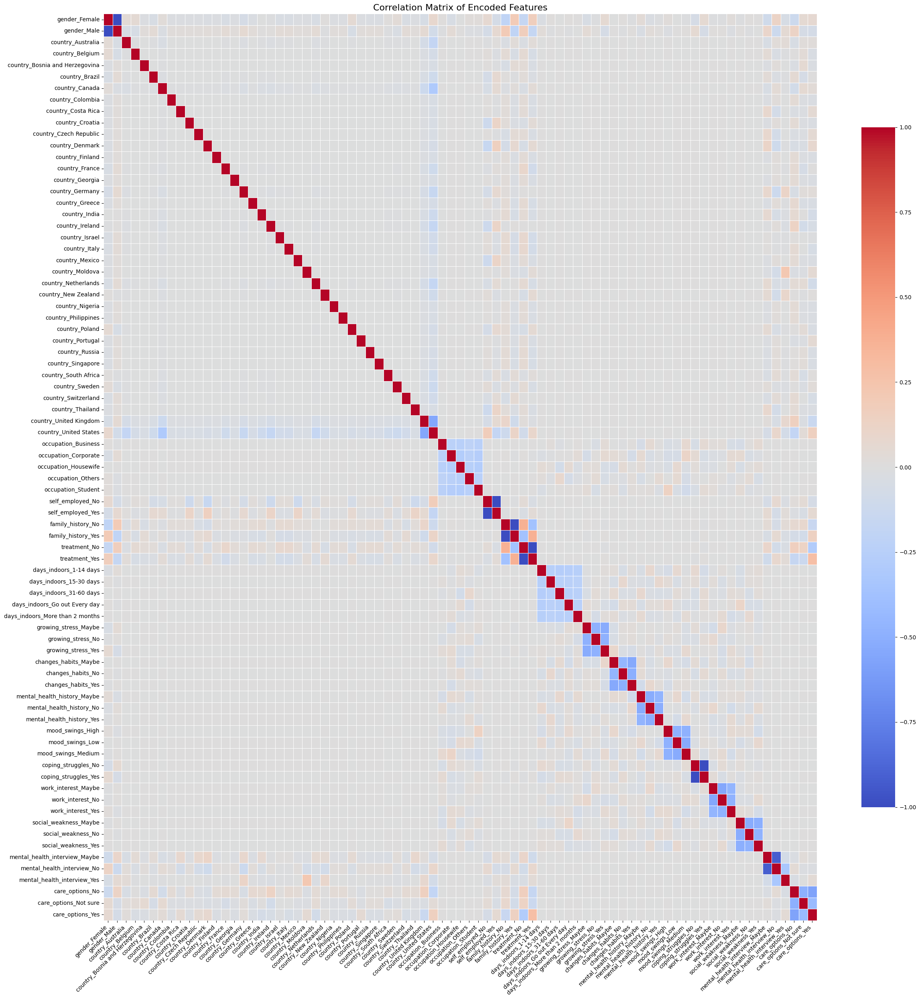

In [23]:
from sklearn.compose import ColumnTransformer


untouched_df = mental_health_data.copy()

untouched_categorical_cols = untouched_df.select_dtypes(include='object').columns
untouched_numeric_cols = untouched_df.select_dtypes(include=['int64', 'float64']).columns

untouched_preprocessor = ColumnTransformer([
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), untouched_categorical_cols),
    ('num', StandardScaler(), untouched_numeric_cols)
])

untouched_encoded_df = get_transformed_dataframe(untouched_preprocessor, untouched_df)

output_correlation_matrix(untouched_encoded_df)


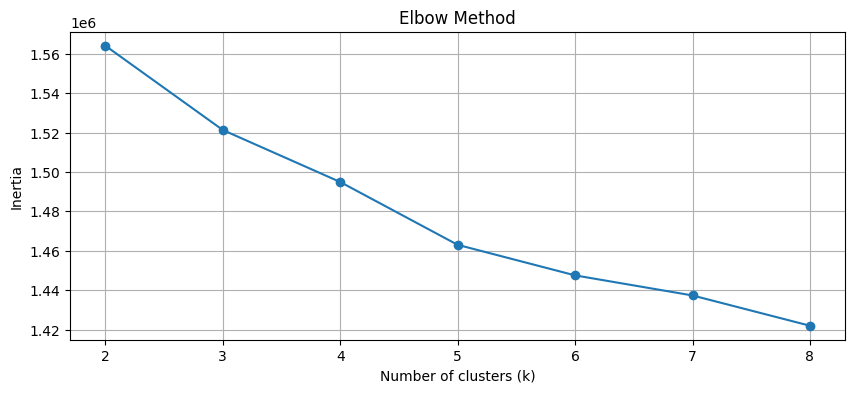

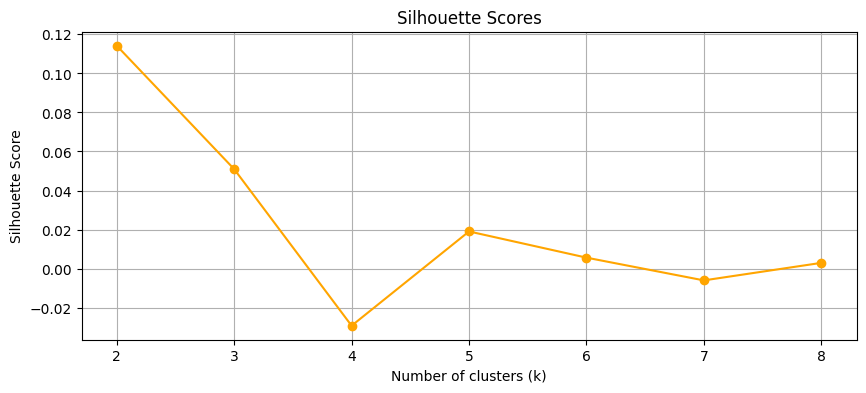

In [24]:
obtain_optimal_k_for_clustering(untouched_encoded_df, n_samples=20000)

Features with most weight on PC1:
                            PC1       PC2
treatment_Yes          0.402549 -0.168119
family_history_Yes     0.382237 -0.108417
gender_Female          0.290328  0.170150
care_options_Yes       0.235722 -0.140300
country_United States  0.172133  0.220331
Features with most weight on PC2:
                                 PC1       PC2
self_employed_No            0.029708  0.496996
mental_health_interview_No  0.137451  0.283175
country_United States       0.172133  0.220331
gender_Female               0.290328  0.170150
treatment_No               -0.402549  0.168119


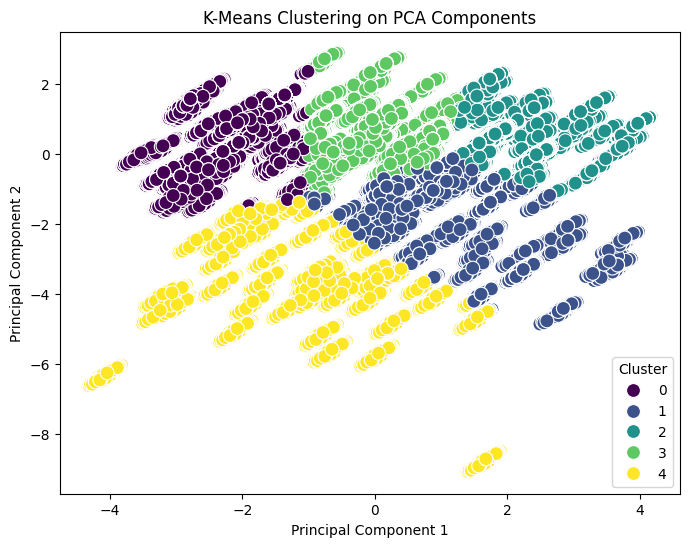

In [25]:
plot_clusters_using_pca(untouched_encoded_df, k=5)

The Untouched dataset consists of our largest dataset variation, namely, the "raw" version without any feature engineering. Due to this reason, it has a lot of features after categorical encoding, which makes it quite hard to interpret the correlation matrix, especially due to the country feature.

From plotting the Inertia variation and the Silhouette score by the number of clusters we could conclude that this variation is not naturally clusterable, however, using the elbow method and trying to maximize the silhouette score, an optimal cluster number would be 5. 

After plotting the clusters using PCA, we could observe that although the clusters are well separated, they are not tightly grouped.

## Anglophone Countries Only

Transformed shape: (233974, 44)
Number of feature names: 44


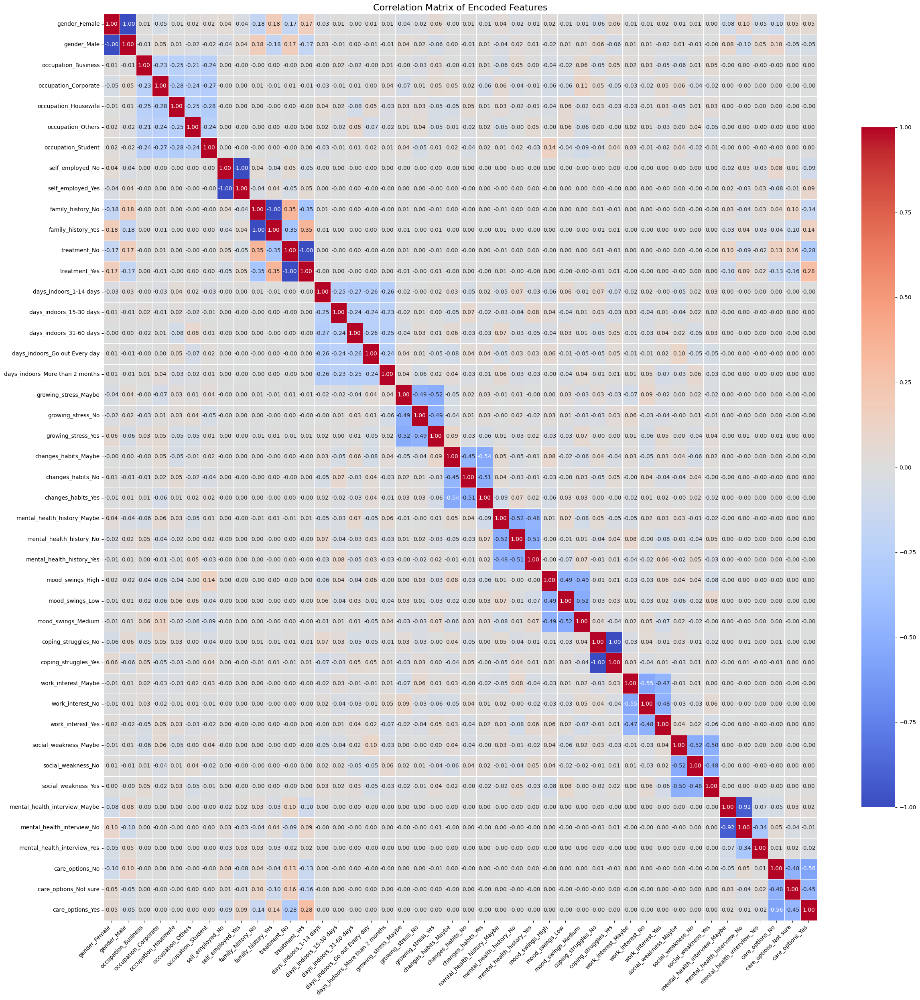

In [26]:
anglophone_countries = ["United States", "United Kingdom", "Canada"]

anglophone_countries_only_df = mental_health_data[(mental_health_data['country'].isin(anglophone_countries))].copy()

anglophone_countries_only_df.drop(columns=['country'], inplace=True)

anglophone_categorical_cols = anglophone_countries_only_df.select_dtypes(include='object').columns
anglophone_numeric_cols = anglophone_countries_only_df.select_dtypes(include=['int64', 'float64']).columns

anglophone_preprocessor = ColumnTransformer([
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), anglophone_categorical_cols),
    ('num', StandardScaler(), anglophone_numeric_cols)
])

anglophone_countries_only_encoded_df = get_transformed_dataframe(anglophone_preprocessor, anglophone_countries_only_df)

output_correlation_matrix(anglophone_countries_only_encoded_df, annotated=True)

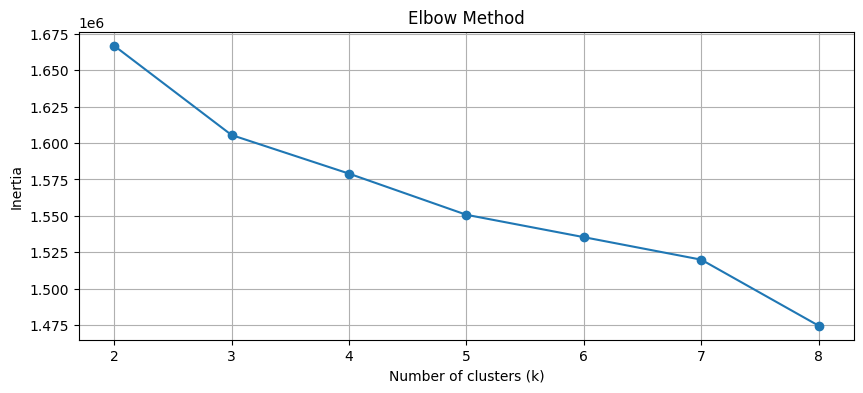

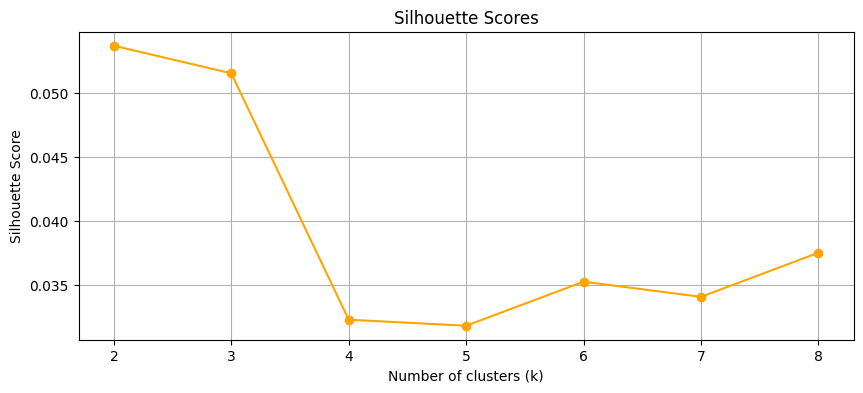

In [27]:
obtain_optimal_k_for_clustering(anglophone_countries_only_encoded_df, n_samples=40000)

Features with most weight on PC1:
                                 PC1       PC2
treatment_Yes               0.433438  0.109245
family_history_Yes          0.400292  0.072828
gender_Female               0.286096 -0.298788
care_options_Yes            0.240652  0.191783
mental_health_interview_No  0.132235 -0.258766
Features with most weight on PC2:
                                    PC1       PC2
self_employed_Yes              0.066398  0.417753
coping_struggles_No           -0.048793  0.325100
gender_Male                   -0.286096  0.298788
mental_health_interview_Maybe -0.126049  0.231727
care_options_Yes               0.240652  0.191783


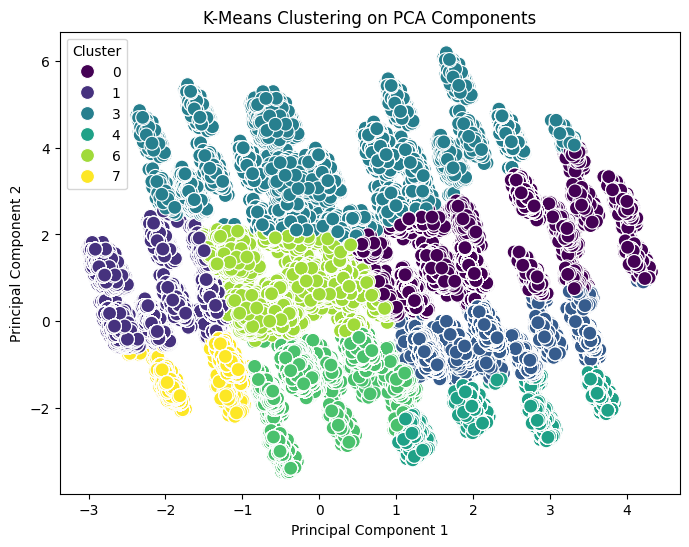

In [28]:
plot_clusters_using_pca(anglophone_countries_only_encoded_df, k=8)

Features with most weight on PC1:
                                 PC1       PC2
treatment_Yes               0.433438  0.109245
family_history_Yes          0.400292  0.072828
gender_Female               0.286096 -0.298788
care_options_Yes            0.240652  0.191783
mental_health_interview_No  0.132235 -0.258766
Features with most weight on PC2:
                                    PC1       PC2
self_employed_Yes              0.066398  0.417753
coping_struggles_No           -0.048793  0.325100
gender_Male                   -0.286096  0.298788
mental_health_interview_Maybe -0.126049  0.231727
care_options_Yes               0.240652  0.191783


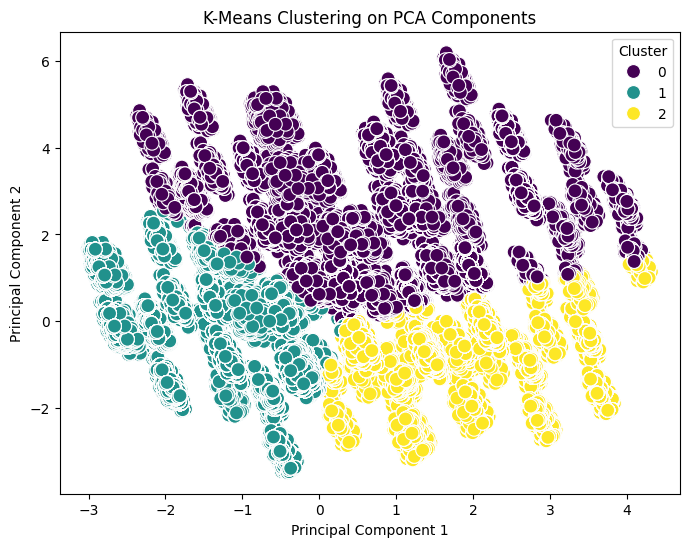

In [29]:
plot_clusters_using_pca(anglophone_countries_only_encoded_df, k=3)

The "Anglophones Countries Only" dataset consists of a variation where we removed every sample whose country was not "United States", "United Kingdom" or "Canada". This variation allowed us reduce the number of 35 countries to 3 countries which increased the readibility of the correlation matrix.

From the correlation matrix it was possible to highlight already some feature pairs, namely:
- Gender_Female has a positive correlation with Family_History_Yes, and Treatment_No, Mental_Health_Interview_No and a negative correlation with Care_Options_Not_Sure (Gender_Male has the opposite behavior of Gender_Female)
- Occupation_Corporate has a positive correlation with Mood_Swings_Medium
- Occupation_Student has a positive correlation with Mood_Swings_High
- Self-Employed_No has a positive correlation with Care_Options_No
- Self-Employed_Yes has a negative correlation with Care_Options_Yes
- Family_History_No has a positive correlation with Care_Options_Not_Sure
- Family_History_Yes has a positive correlation with Care_Options_Yes
- Treatment_Yes has a positive correlation with Care_Options_Yes
- Days_Indoors_Go out Every Day has a positive correlation with Social_Weakness_Yes
- Growing_Stress_Maybe has a positive correlation with Work_Interest_No

The highest correlation scores were:
- 0.18 between Gender and Family History
- 0.17 between Gender and Treatment
- 0.14 Occupation Student and Mood Swings High
- 0.28 Treatment and Care Options

From plotting the Inertia variation and the Silhouette score by the number of clusters we could conclude that this variation is also not naturally clusterable, since the line behaviours were contrasting, however, using the elbow method and trying to maximize the silhouette score, an optimal cluster number would be 3 or 8. 

After plotting the clusters using PCA, we could observe that although the clusters were once again well separated, they were not tightly grouped.

Since the this dataset variation has a lot of weight on the untouched dataset variation and improved readability, we decided to perform the "The Decided Only", "Male Only", "Decided Male Only" and "Female Only" over the "Anglophone Countries Only" dataset variation.

## The Decided Only

Transformed shape: (18534, 37)
Number of feature names: 37


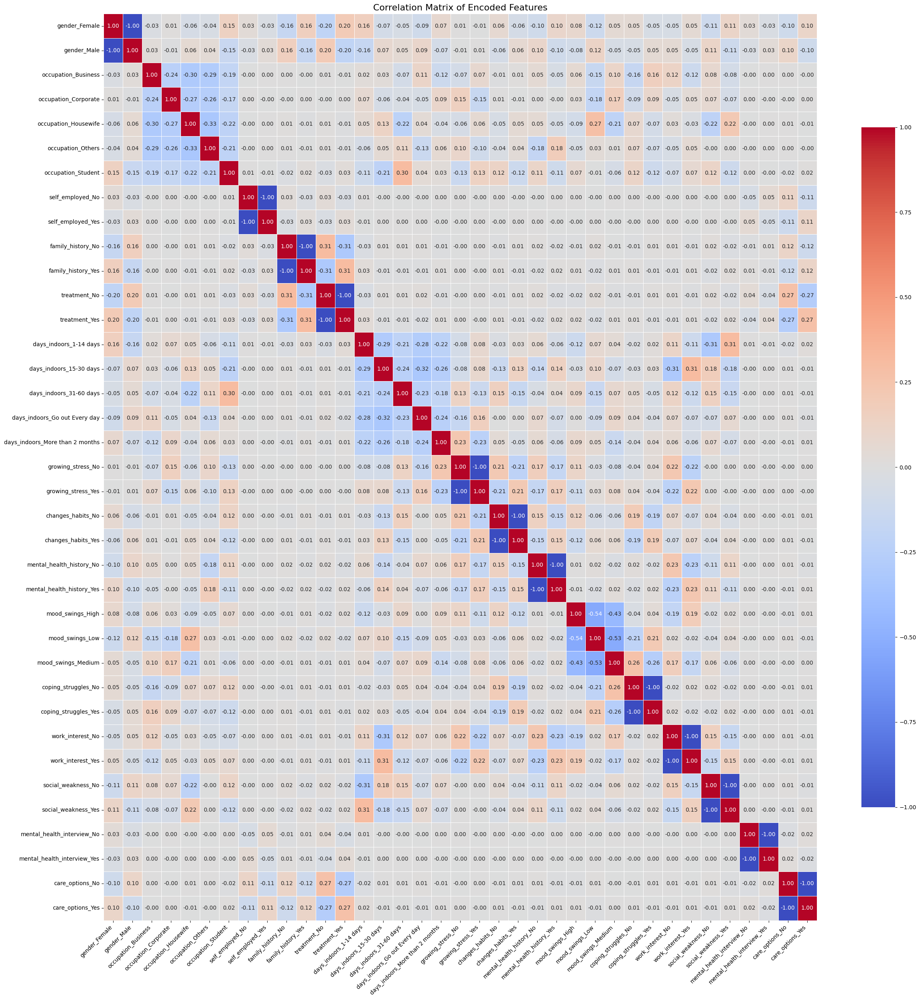

In [30]:

ternary_features = ["changes_habits", "growing_stress", "mental_health_history", "work_interest", "social_weakness", "mental_health_interview", "care_options"]

decided_only_df = mental_health_data[
    mental_health_data[ternary_features].apply(lambda row: all(val in ["Yes", "No"] for val in row), axis=1)
]

decided_only_df = decided_only_df[(decided_only_df['country'].isin(anglophone_countries))].copy()

decided_only_df.drop(columns=['country'], inplace=True)

decided_categorical_cols = decided_only_df.select_dtypes(include='object').columns
decided_numeric_cols = decided_only_df.select_dtypes(include=['int64', 'float64']).columns

decided_preprocessor = ColumnTransformer([
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), decided_categorical_cols),
    ('num', StandardScaler(), decided_numeric_cols)
])

decided_only_encoded_df = get_transformed_dataframe(decided_preprocessor, decided_only_df)

output_correlation_matrix(decided_only_encoded_df, annotated=True)

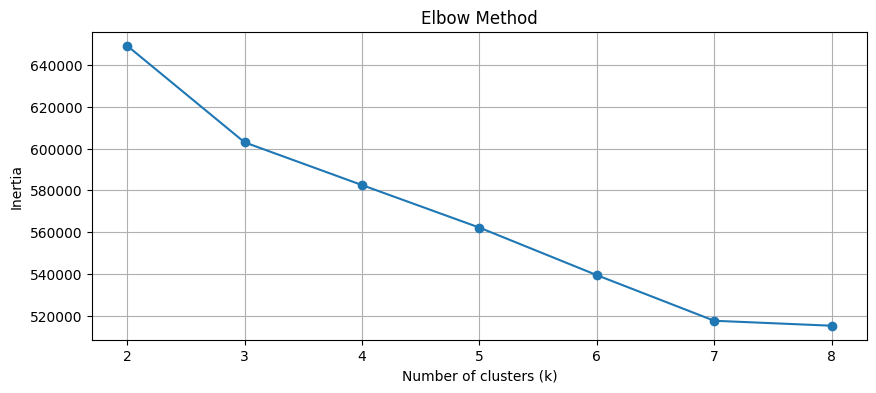

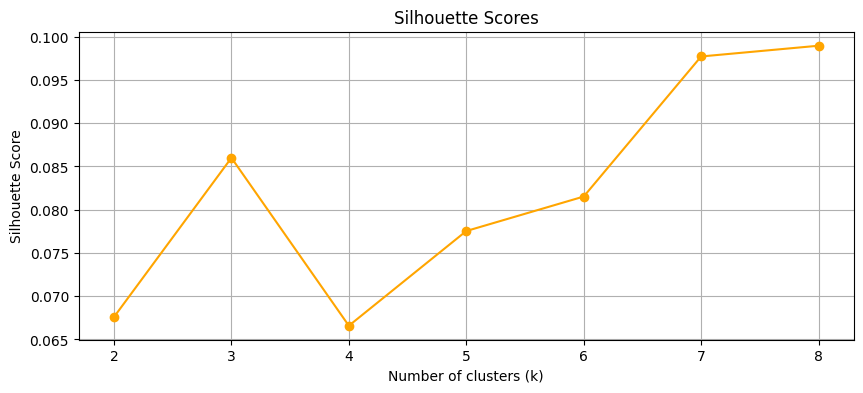

In [31]:
obtain_optimal_k_for_clustering(decided_only_encoded_df, n_samples=0)

Features with most weight on PC1:
                        PC1       PC2
treatment_No       0.369219 -0.134472
family_history_No  0.309589 -0.112756
gender_Male        0.304114 -0.107941
care_options_No    0.275454 -0.100660
work_interest_No   0.179433  0.297067
Features with most weight on PC2:
                               PC1       PC2
growing_stress_No         0.121007  0.324292
changes_habits_No         0.042661  0.316561
work_interest_No          0.179433  0.297067
mental_health_history_No  0.149709  0.267082
days_indoors_31-60 days   0.057598  0.143239


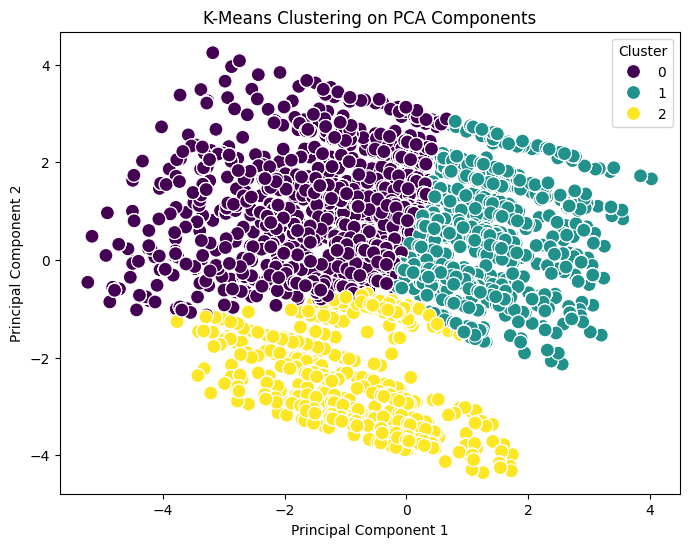

In [32]:
plot_clusters_using_pca(decided_only_encoded_df, k=3)

Features with most weight on PC1:
                        PC1       PC2
treatment_No       0.369219 -0.134472
family_history_No  0.309589 -0.112756
gender_Male        0.304114 -0.107941
care_options_No    0.275454 -0.100660
work_interest_No   0.179433  0.297067
Features with most weight on PC2:
                               PC1       PC2
growing_stress_No         0.121007  0.324292
changes_habits_No         0.042661  0.316561
work_interest_No          0.179433  0.297067
mental_health_history_No  0.149709  0.267082
days_indoors_31-60 days   0.057598  0.143239


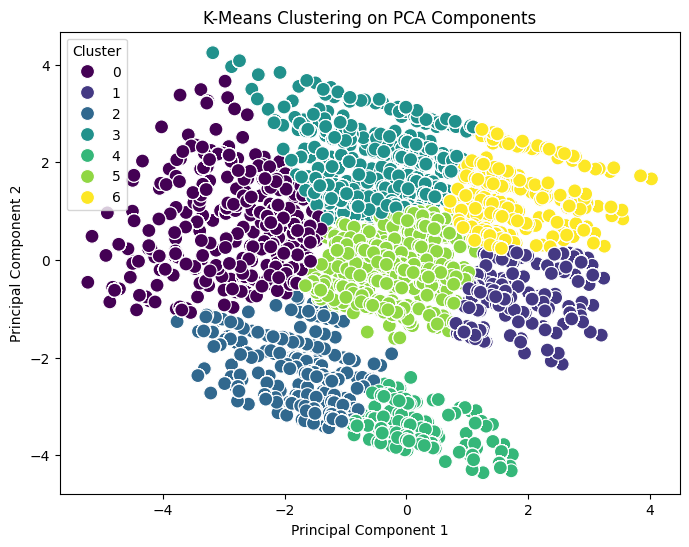

In [33]:
plot_clusters_using_pca(decided_only_encoded_df, k=7)

Features with most weight on PC1:
                        PC1       PC2
treatment_No       0.369219 -0.134472
family_history_No  0.309589 -0.112756
gender_Male        0.304114 -0.107941
care_options_No    0.275454 -0.100660
work_interest_No   0.179433  0.297067
Features with most weight on PC2:
                               PC1       PC2
growing_stress_No         0.121007  0.324292
changes_habits_No         0.042661  0.316561
work_interest_No          0.179433  0.297067
mental_health_history_No  0.149709  0.267082
days_indoors_31-60 days   0.057598  0.143239


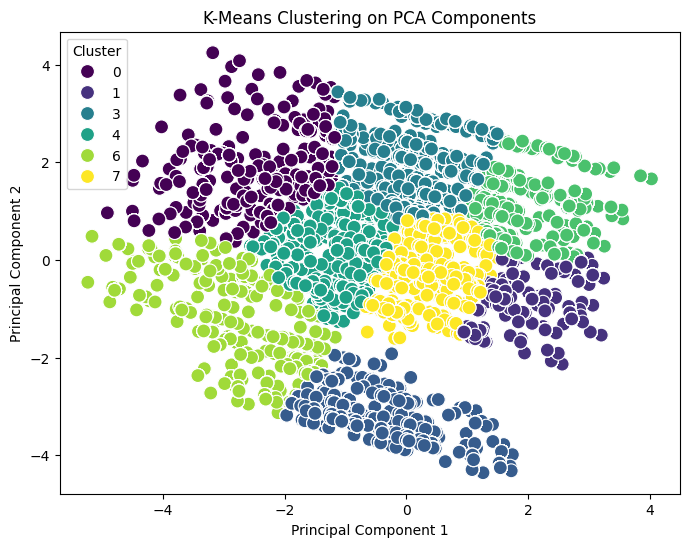

In [34]:
plot_clusters_using_pca(decided_only_encoded_df, k=8)

For the "Decided" dataset we made a dataset variation that consists of removing all samples that contained undecided answers, namely, "Maybe" or "Not Sure". This made the number of features decrease more, but especially the number of samples which went from over 200k samples to only 18.5k.

However, besides maintaining the previous correlation behavior (but more intense) that we found on the Anglophone countries, some additional new feature pair appeared, namely:
- Gender Male has positive correlation with Lower_Mood_Swings (opposite happens to Female)
- Gender Female has positive correlation with Care_Options_Yes
- Occupation_Business has a positive correlation with Coping_Strugles_Yes, Days_Indoors_Go out Every Day and Work_Interest_No.
- Occupation_Corporate has a positive correlation with Growing_Stress_No.
- Occupation_Housewife has a positive correlation with Mood_Swings_Low and Social_Weakness_Yes.
- Occupation_Student shows a positive correlation with Days_Indoors_31-60_Days
- Days_Indoors_1-14 Days shows a positive correlation with Social_Weakness_Yes.

The highest correlation scores were:
- 0.31 Days_Indoors_1-14 Days and Social_Weakness_Yes.
- 0.27 Occupation_Housewife and Mood_Swings_Low
- 0.3 Days_Indoors_31-60 Days and Occupation_Student.

Regarding the plots to find the optimal number of clusters, the Inertia and the Silhouette score had an expected behavior and it possible to minimize the inertia and maximize the silhouette score with the 7 clusters. It was possible to confirm this by plotting the clusters and seeing now a more natural cluster shape, with smoother borders and tighter clusters.

## Only Male Dataset

Transformed shape: (189150, 42)
Number of feature names: 42


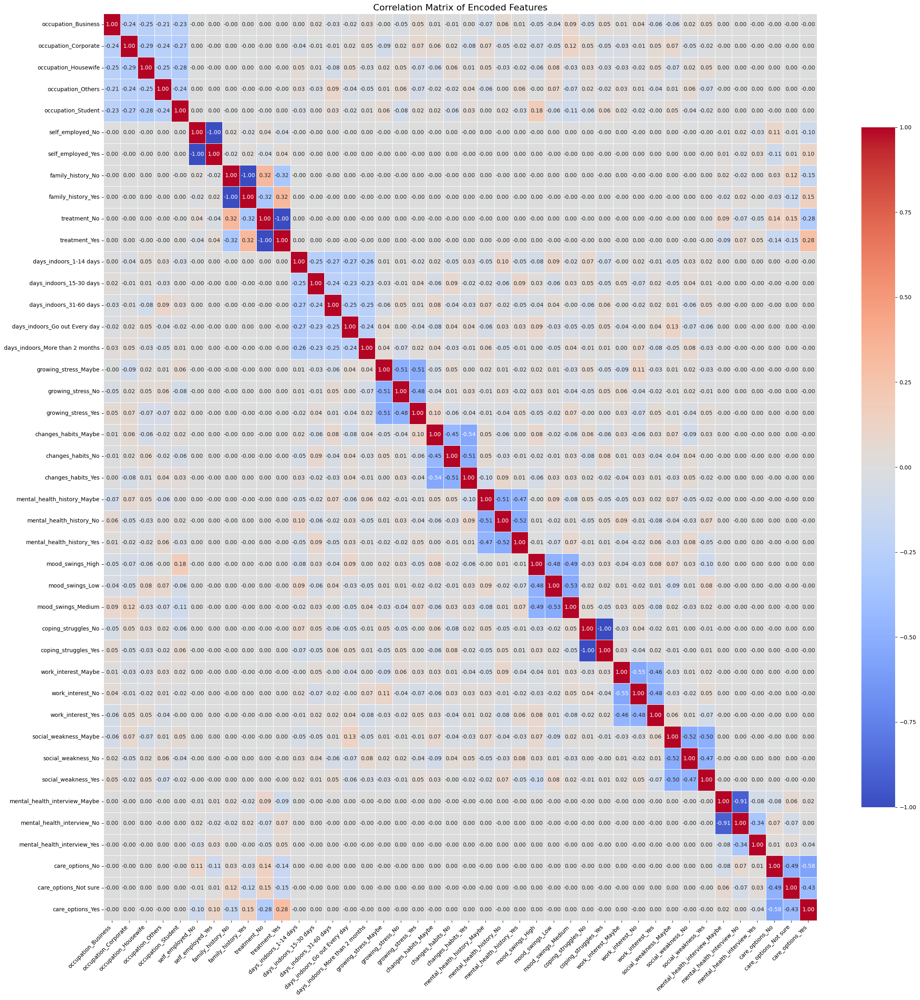

In [35]:
male_only_df = mental_health_data[
    (mental_health_data['gender'] == 'Male') &
    (mental_health_data['country'].isin(anglophone_countries))
].copy()

male_only_df.drop(columns=['gender', 'country'], inplace=True)

male_categorical_cols = male_only_df.select_dtypes(include='object').columns
male_numeric_cols = male_only_df.select_dtypes(include=['int64', 'float64']).columns

male_preprocessor = ColumnTransformer([
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), male_categorical_cols),
    ('num', StandardScaler(), male_numeric_cols)
])

male_only_encoded_df = get_transformed_dataframe(male_preprocessor, male_only_df)


output_correlation_matrix(male_only_encoded_df, annotated=True)

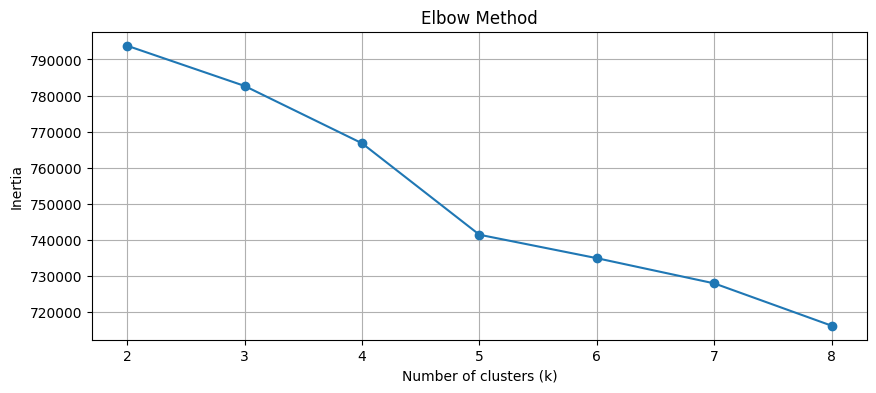

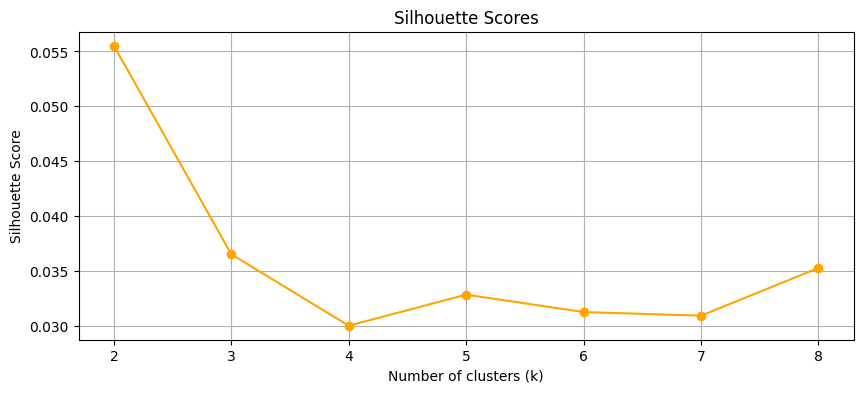

In [36]:
obtain_optimal_k_for_clustering(male_only_encoded_df, n_samples=20000)

Features with most weight on PC1:
                            PC1           PC2
treatment_No           0.477000 -3.720774e-16
family_history_No      0.428297 -6.976460e-16
care_options_Not sure  0.166817 -9.757710e-16
care_options_No        0.138292  1.986305e-15
self_employed_No       0.107696  3.492907e-15
Features with most weight on PC2:
                                      PC1       PC2
coping_struggles_No          2.822653e-16  0.633501
work_interest_No             1.267784e-16  0.131597
mental_health_history_Maybe -1.128991e-16  0.128203
mood_swings_Medium          -1.257898e-16  0.121068
occupation_Corporate         1.408935e-17  0.107675


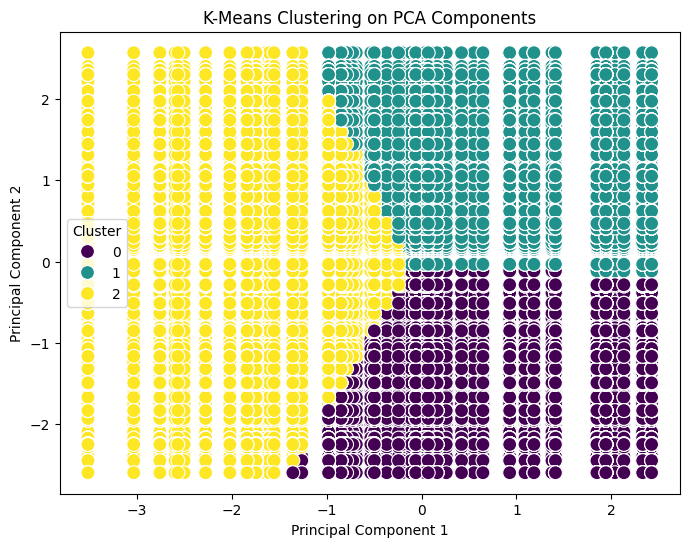

In [37]:
plot_clusters_using_pca(male_only_encoded_df, k=3)

Features with most weight on PC1:
                            PC1           PC2
treatment_No           0.477000 -3.720774e-16
family_history_No      0.428297 -6.976460e-16
care_options_Not sure  0.166817 -9.757710e-16
care_options_No        0.138292  1.986305e-15
self_employed_No       0.107696  3.492907e-15
Features with most weight on PC2:
                                      PC1       PC2
coping_struggles_No          2.822653e-16  0.633501
work_interest_No             1.267784e-16  0.131597
mental_health_history_Maybe -1.128991e-16  0.128203
mood_swings_Medium          -1.257898e-16  0.121068
occupation_Corporate         1.408935e-17  0.107675


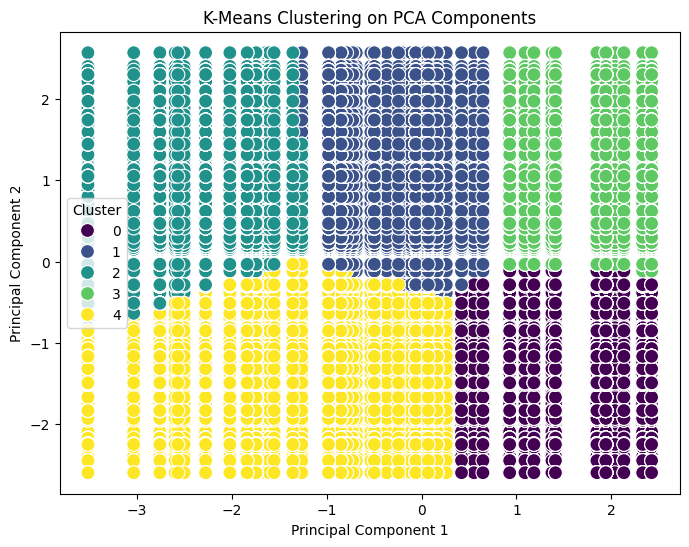

In [38]:
plot_clusters_using_pca(male_only_encoded_df, k=5)

Features with most weight on PC1:
                            PC1           PC2
treatment_No           0.477000 -3.720774e-16
family_history_No      0.428297 -6.976460e-16
care_options_Not sure  0.166817 -9.757710e-16
care_options_No        0.138292  1.986305e-15
self_employed_No       0.107696  3.492907e-15
Features with most weight on PC2:
                                      PC1       PC2
coping_struggles_No          2.822653e-16  0.633501
work_interest_No             1.267784e-16  0.131597
mental_health_history_Maybe -1.128991e-16  0.128203
mood_swings_Medium          -1.257898e-16  0.121068
occupation_Corporate         1.408935e-17  0.107675


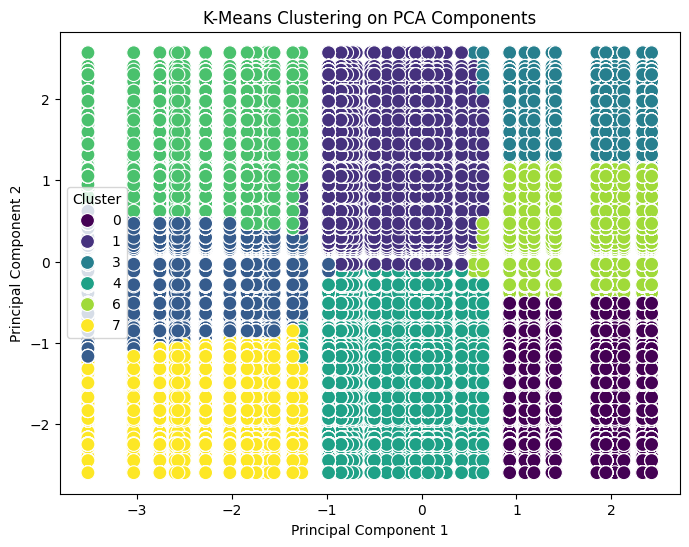

In [39]:
plot_clusters_using_pca(male_only_encoded_df, k=8)

## Decided Only Male Dataset

Transformed shape: (15496, 35)
Number of feature names: 35


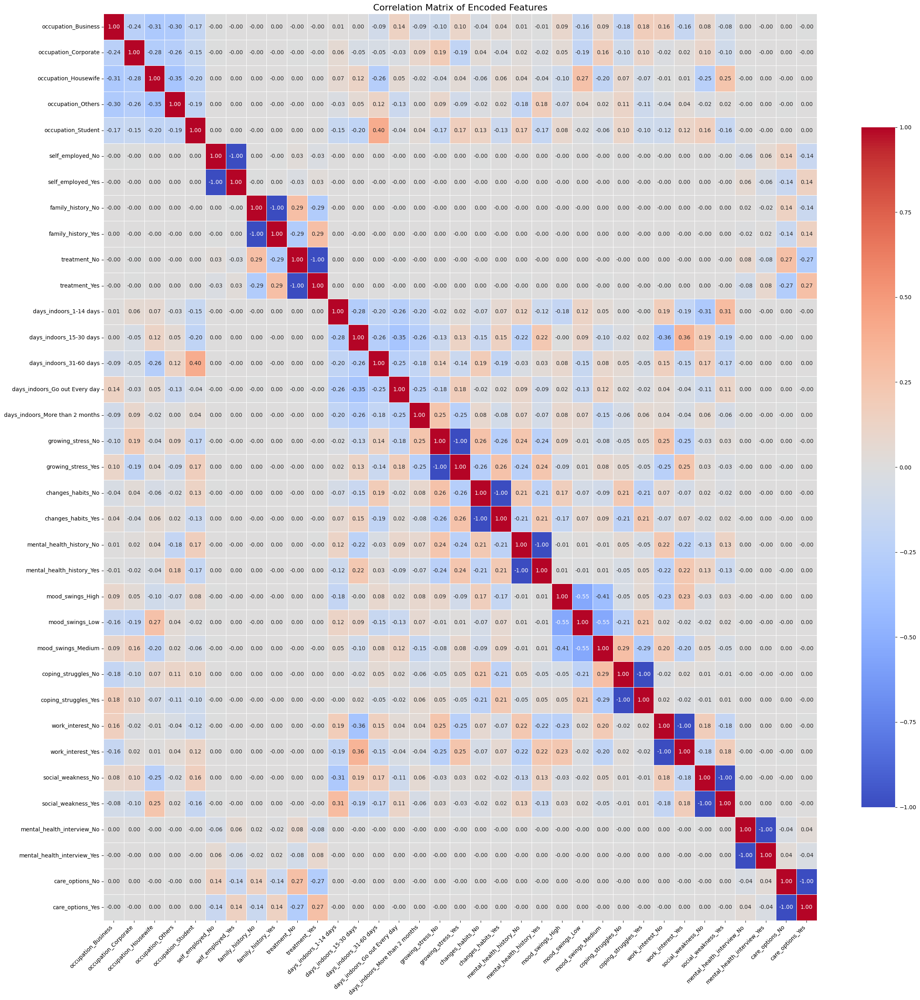

In [40]:
ternary_features = ["changes_habits", "growing_stress", "mental_health_history", "work_interest", "social_weakness", "mental_health_interview", "care_options"]

decided_only_male_df = mental_health_data[
    mental_health_data[ternary_features].apply(lambda row: all(val in ["Yes", "No"] for val in row), axis=1)
]

decided_only_male_df = decided_only_male_df[
    (decided_only_male_df['gender'] == 'Male') &
    (decided_only_male_df['country'].isin(anglophone_countries))
].copy()

decided_only_male_df.drop(columns=['gender', 'country'], inplace=True)

decided_male_categorical_cols = decided_only_male_df.select_dtypes(include='object').columns
decided_male_numeric_cols = decided_only_male_df.select_dtypes(include=['int64', 'float64']).columns

decided_male_preprocessor = ColumnTransformer([
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), decided_male_categorical_cols),
    ('num', StandardScaler(), decided_male_numeric_cols)
])

decided_only_male_encoded_df = get_transformed_dataframe(decided_male_preprocessor, decided_only_male_df)

output_correlation_matrix(decided_only_male_encoded_df, annotated=True)

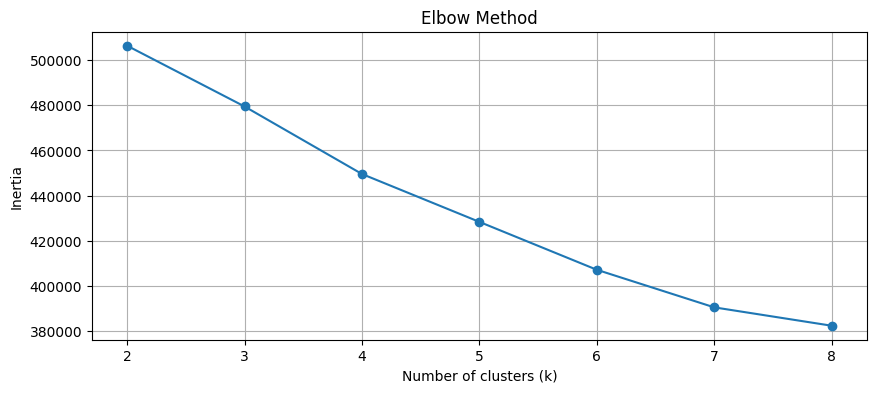

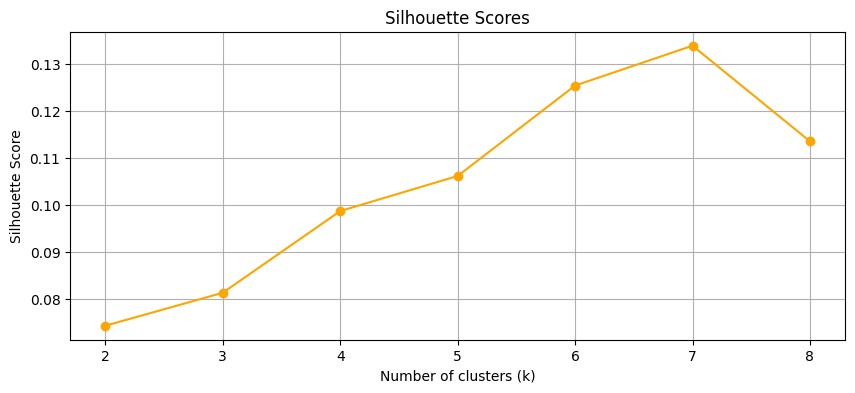

In [41]:
obtain_optimal_k_for_clustering(decided_only_male_encoded_df, n_samples=0)

Features with most weight on PC1:
                               PC1           PC2
growing_stress_No         0.351247  2.003208e-16
mental_health_history_No  0.330009 -3.189807e-16
changes_habits_No         0.315303  1.427400e-16
work_interest_No          0.309381 -3.339273e-17
days_indoors_31-60 days   0.150279  4.460699e-17
Features with most weight on PC2:
                                     PC1       PC2
treatment_No                4.763067e-17  0.443591
care_options_No             8.338215e-17  0.385611
family_history_No          -3.427236e-17  0.366150
self_employed_No           -2.088097e-16  0.137359
mental_health_interview_No  7.874240e-17  0.039971


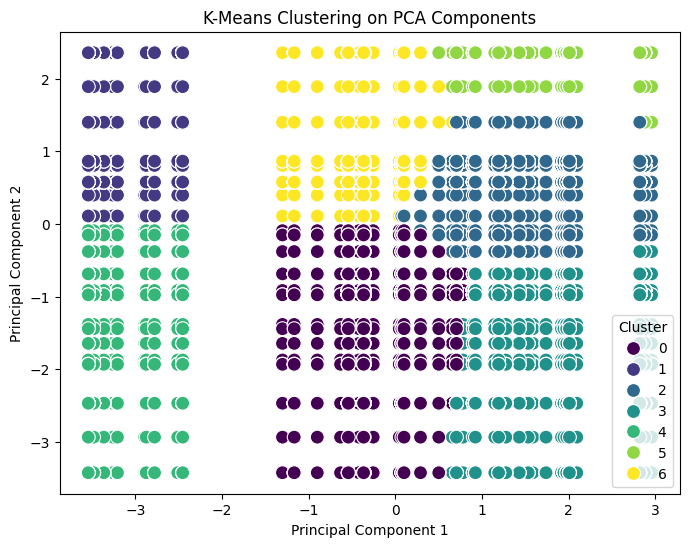

In [42]:
plot_clusters_using_pca(decided_only_male_encoded_df, k=7)

## Female Only Dataset

Transformed shape: (44824, 42)
Number of feature names: 42


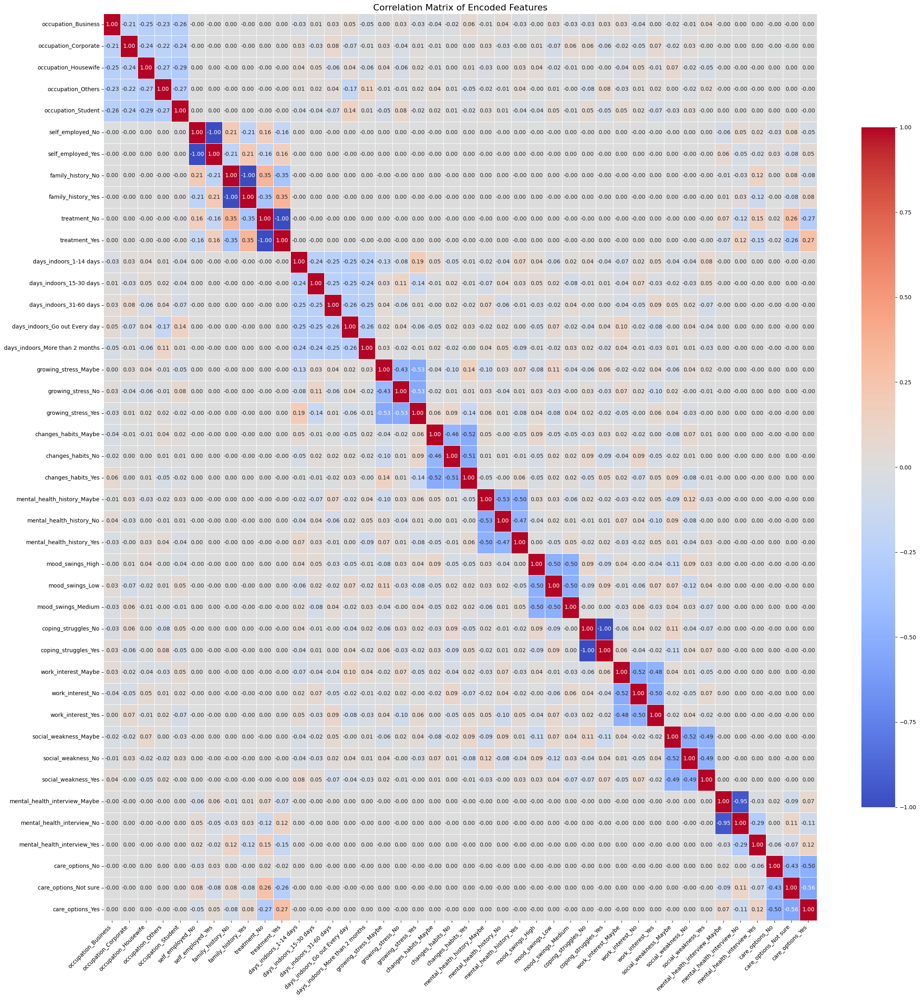

In [43]:
female_only_df = mental_health_data[
    (mental_health_data['gender'] == 'Female') &
    (mental_health_data['country'].isin(anglophone_countries))
].copy()

female_only_df.drop(columns=['gender', 'country'], inplace=True)

female_categorical_cols = female_only_df.select_dtypes(include='object').columns
female_numeric_cols = female_only_df.select_dtypes(include=['int64', 'float64']).columns

female_preprocessor = ColumnTransformer([
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), female_categorical_cols),
    ('num', StandardScaler(), female_numeric_cols)
])

female_only_encoded_df = get_transformed_dataframe(female_preprocessor, female_only_df)

output_correlation_matrix(female_only_encoded_df, annotated=True)

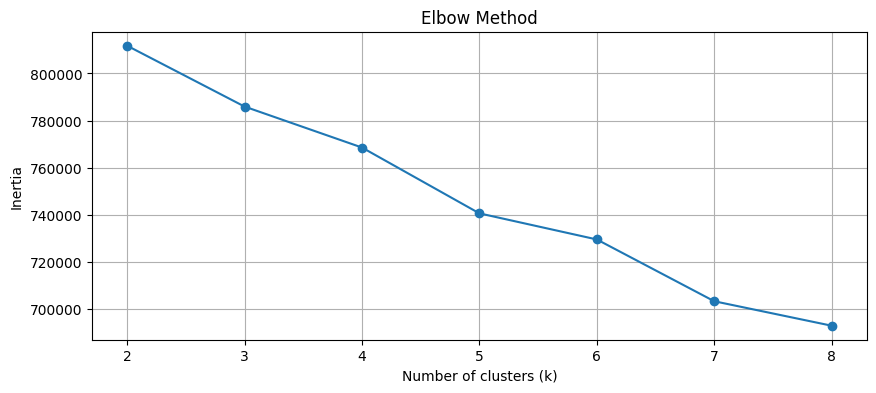

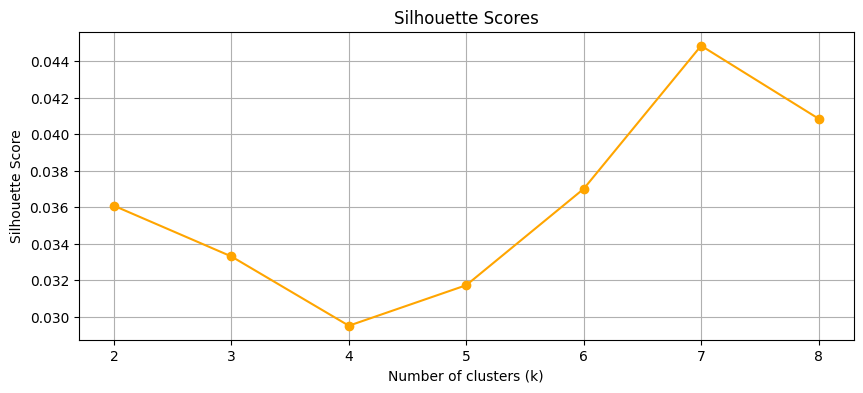

In [44]:
obtain_optimal_k_for_clustering(female_only_encoded_df, n_samples=20000)

Features with most weight on PC1:
                                 PC1           PC2
treatment_Yes               0.442409 -1.258171e-16
family_history_Yes          0.411799  4.765282e-17
self_employed_Yes           0.294805 -1.407538e-16
care_options_Yes            0.199956 -1.825259e-17
mental_health_interview_No  0.045070 -1.531587e-16
Features with most weight on PC2:
                                 PC1       PC2
coping_struggles_No    -7.842830e-19  0.535127
growing_stress_Yes      1.996585e-16  0.247274
mood_swings_High        1.315828e-16  0.177263
changes_habits_No      -4.286667e-16  0.177131
days_indoors_1-14 days  1.879297e-17  0.140450


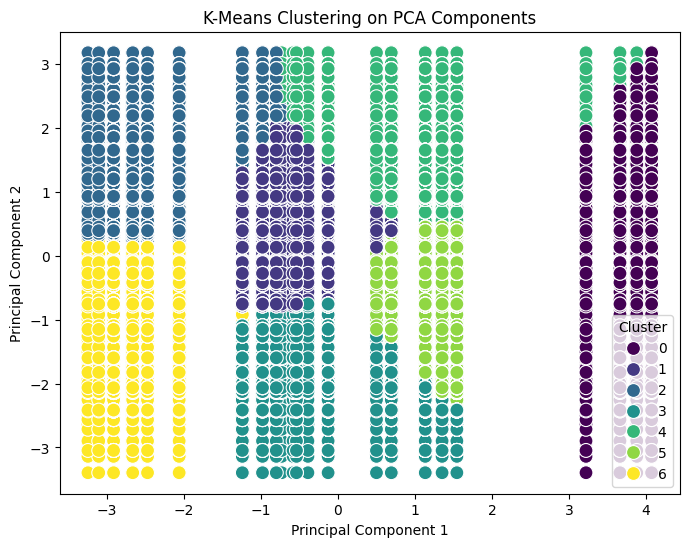

In [45]:
plot_clusters_using_pca(female_only_encoded_df, k=7)

### Gender Dataset Variations

Due to the great similarities between the three previous dataset variations, we decided to compact all the remarks together:
- The correlation matrix shows already identified feature pairs, with slighter correlation score increases in specific ones.
- The optimal number of cluster plots had a natural behaviour, similarly to the Decided variation, however, when plotting the clusters visually they had a box-like behavior, which meant that the gender feature was actually contributing to the natural shapes of the "Decided" clusters.

This realization made us discard the hypothesis on choosing a single gender to work with.

## Rest of the world

Transformed shape: (50884, 44)
Number of feature names: 44


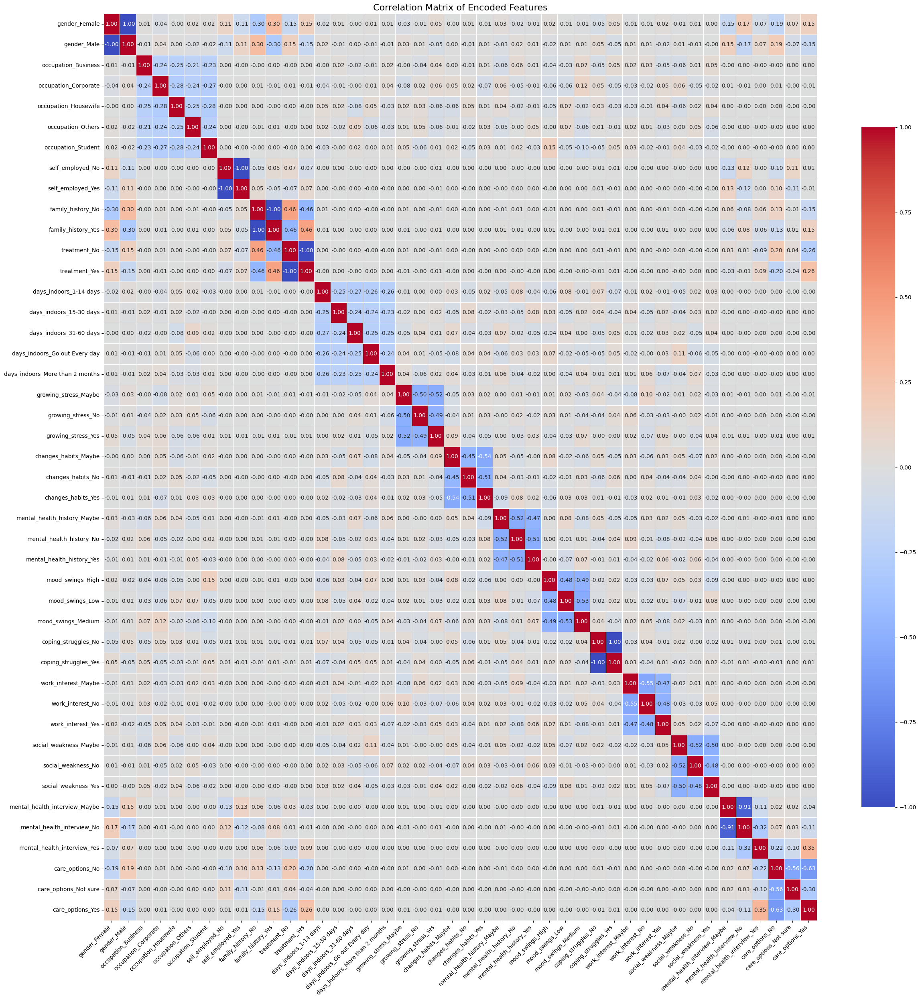

In [46]:
rest_of_the_world_df = mental_health_data[~mental_health_data['country'].isin(anglophone_countries)].copy()

rest_of_the_world_df.drop(columns=['country'], inplace=True)

rest_of_the_world_categorical_cols = rest_of_the_world_df.select_dtypes(include='object').columns
rest_of_the_world_numeric_cols = rest_of_the_world_df.select_dtypes(include=['int64', 'float64']).columns

rest_of_the_world_preprocessor = ColumnTransformer([
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), rest_of_the_world_categorical_cols),
    ('num', StandardScaler(), rest_of_the_world_numeric_cols)
])

rest_of_the_world_encoded_df = get_transformed_dataframe(rest_of_the_world_preprocessor, rest_of_the_world_df)

output_correlation_matrix(rest_of_the_world_encoded_df, annotated=True)


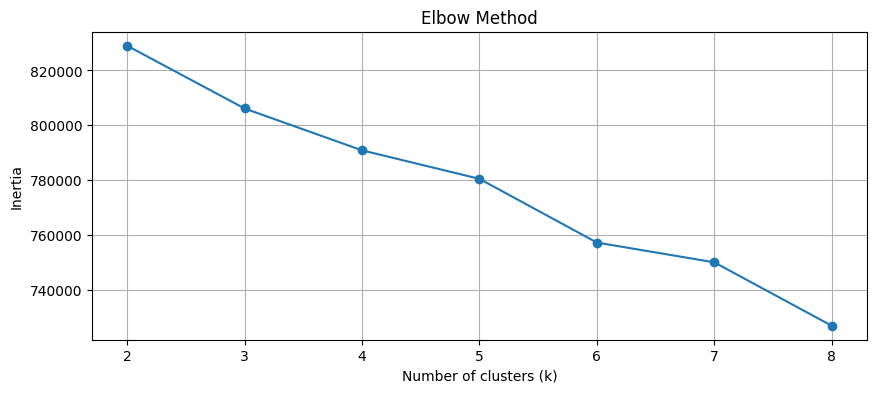

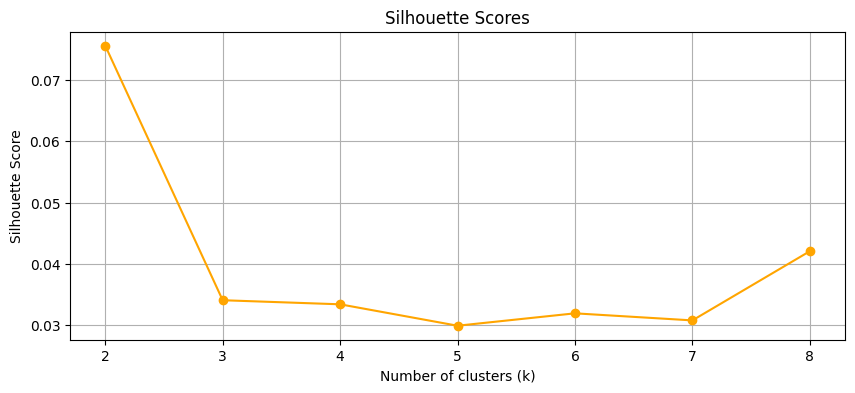

In [47]:
obtain_optimal_k_for_clustering(rest_of_the_world_encoded_df, n_samples=20000)

Features with most weight on PC1:
                                    PC1       PC2
family_history_No              0.416634  0.073174
treatment_No                   0.380794  0.272163
gender_Male                    0.329997 -0.226977
care_options_No                0.223514  0.023795
mental_health_interview_Maybe  0.121474 -0.335890
Features with most weight on PC2:
                                 PC1       PC2
self_employed_No           -0.078271  0.434618
mental_health_interview_No -0.102911  0.392689
treatment_No                0.380794  0.272163
gender_Female              -0.329997  0.226977
care_options_Not sure      -0.038374  0.142488


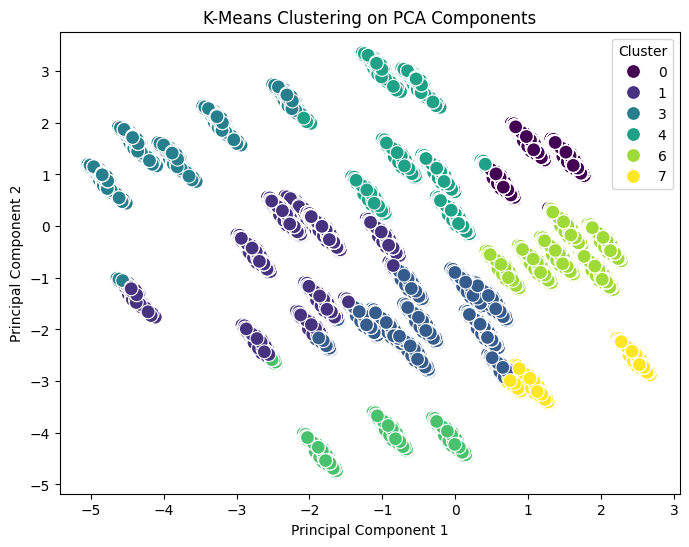

In [48]:
plot_clusters_using_pca(rest_of_the_world_encoded_df, k=8)

We decided that an interesting variation would be to remove all of the main anglophone countries and keep the "rest of the world":
- Correlation wise, no new feature pairs emerged.
- The optimal clustering number plots presented a not natural behavior, meaning that the variation is not naturally scalable.
- The cluster visualization showed a very scattered clustering which can be interpreted as the cultural differences between so many countries.

## United States Only

Transformed shape: (165869, 44)
Number of feature names: 44


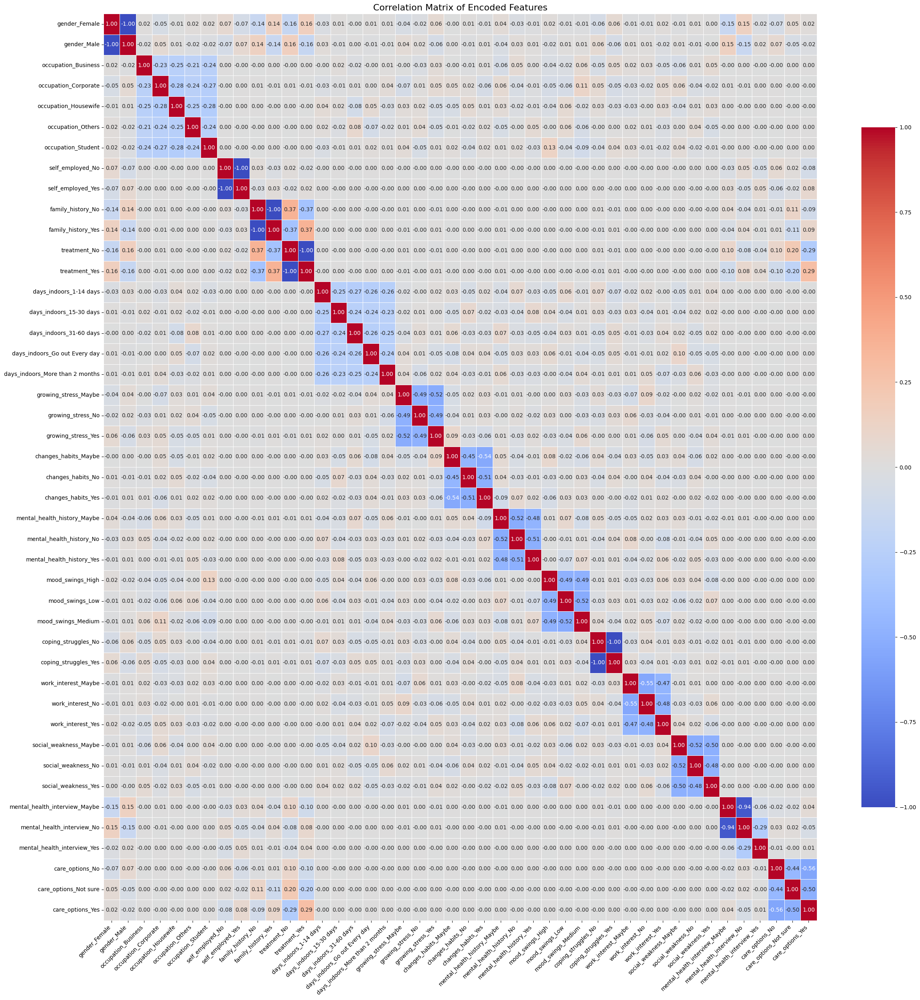

In [49]:
united_states_df = mental_health_data[mental_health_data['country'].isin(["United States"])].copy()

united_states_df.drop(columns=['country'], inplace=True)

united_states_categorical_cols = united_states_df.select_dtypes(include='object').columns
united_states_numeric_cols = united_states_df.select_dtypes(include=['int64', 'float64']).columns

united_states_preprocessor = ColumnTransformer([
    ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), united_states_categorical_cols),
    ('num', StandardScaler(), united_states_numeric_cols)
])

united_states_encoded_df = get_transformed_dataframe(united_states_preprocessor, united_states_df)

output_correlation_matrix(united_states_encoded_df, annotated=True)

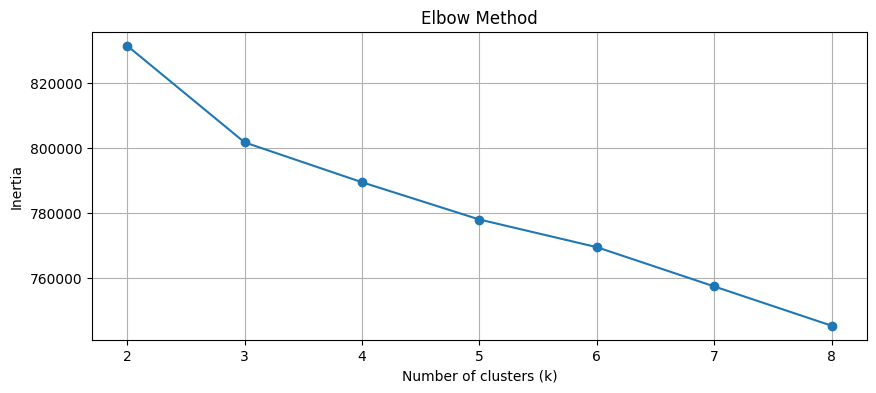

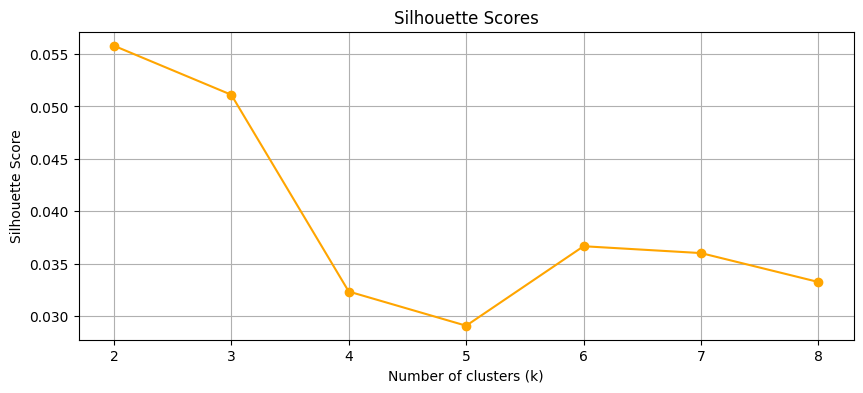

In [50]:
obtain_optimal_k_for_clustering(united_states_encoded_df, n_samples=20000)

Features with most weight on PC1:
                                    PC1       PC2
treatment_No                   0.447353 -0.145820
family_history_No              0.401456 -0.119395
gender_Male                    0.277754  0.336569
mental_health_interview_Maybe  0.154226  0.322710
care_options_Not sure          0.141377 -0.179645
Features with most weight on PC2:
                                    PC1       PC2
self_employed_Yes             -0.014594  0.373318
gender_Male                    0.277754  0.336569
mental_health_interview_Maybe  0.154226  0.322710
care_options_Yes              -0.204587  0.234646
coping_struggles_No            0.049746  0.193640


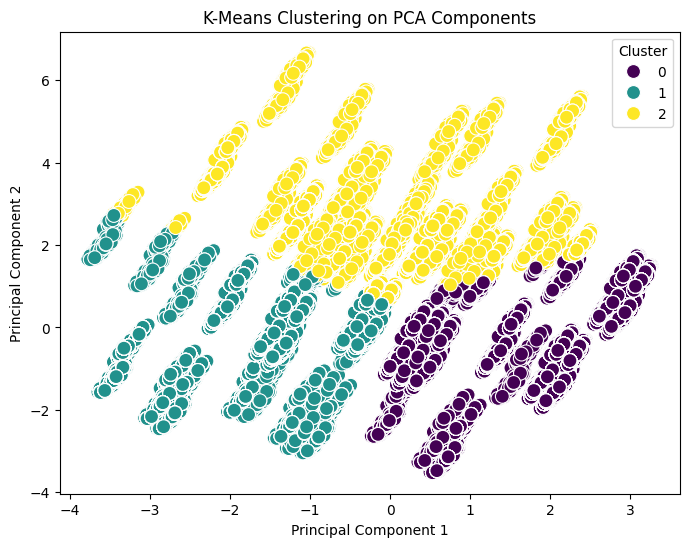

In [51]:
plot_clusters_using_pca(united_states_encoded_df, k=3)

Features with most weight on PC1:
                                    PC1       PC2
treatment_No                   0.447353 -0.145820
family_history_No              0.401456 -0.119395
gender_Male                    0.277754  0.336569
mental_health_interview_Maybe  0.154226  0.322710
care_options_Not sure          0.141377 -0.179645
Features with most weight on PC2:
                                    PC1       PC2
self_employed_Yes             -0.014594  0.373318
gender_Male                    0.277754  0.336569
mental_health_interview_Maybe  0.154226  0.322710
care_options_Yes              -0.204587  0.234646
coping_struggles_No            0.049746  0.193640


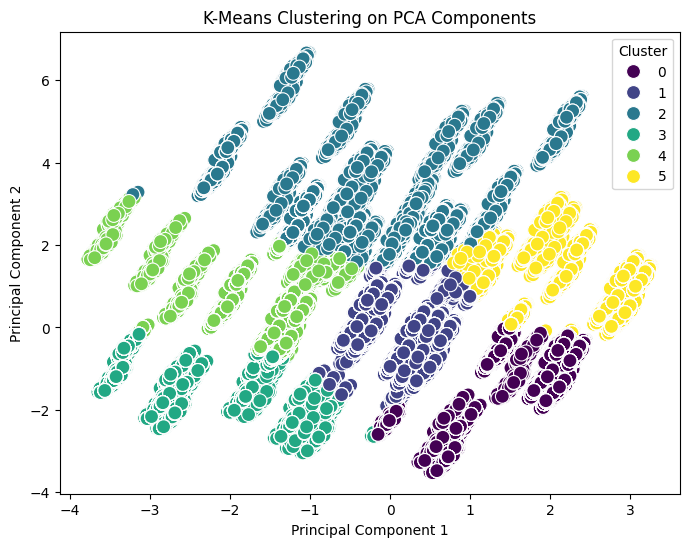

In [52]:
plot_clusters_using_pca(united_states_encoded_df, k=6)

The United States Only variation showed very similar results to the Anglophone Countries Only variation which allowed us to confirm that culturally wise, countries with previous common history show similar behavioural patterns.

## Chosen Dataset Variation

After performing a comparative study between the several dataset variations, the one that presented the best correlation and clustering results (lowest inertia and highest silhouette score) was the **"The Decided Dataset"** which consisted of removing the "Maybe" and "Not Sure" of anglophone samples that were producing noise to the actual patterns. In addition, it was concluded that although the "gender" feature is unbalanced, it has a positive influence to the identification of patterns, which excludes the possibility of analyzing an only female or male dataset.

By comparing the "Anglophone Countries" with the "Rest of the World" we confirm that the Anglophone Countries have a closer correlation when in comparison with the "Rest of the World" that were quite sparsed.

/var/folders/7g/sc6nhcx933gdh39b_03vjgd80000gn/T/ipykernel_16731/288727338.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='viridis', hue=None)


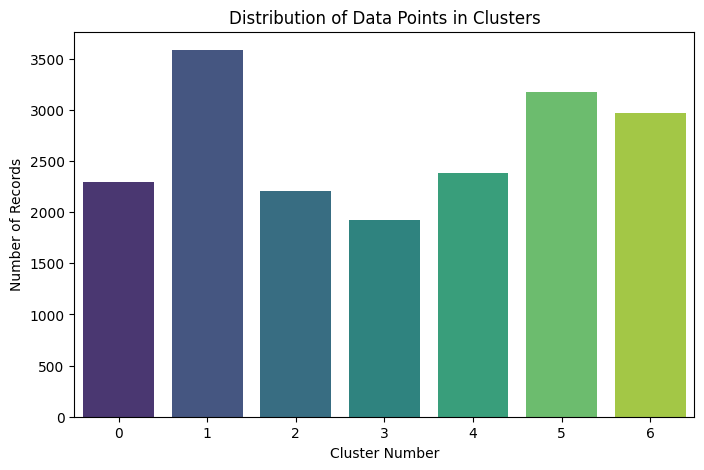

Cluster,0,1,2,3,4,5,6
gender_Female,0.64,0.04,0.27,0.13,0.05,0.03,0.12
gender_Male,0.36,0.96,0.73,0.87,0.95,0.97,0.88
occupation_Business,0.28,0.17,0.13,0.30,0.17,0.40,0.03
occupation_Corporate,0.15,0.10,0.14,0.18,0.13,0.22,0.30
occupation_Housewife,0.35,0.30,0.38,0.16,0.41,0.09,0.18
occupation_Others,0.10,0.35,0.28,0.06,0.27,0.19,0.34
occupation_Student,0.13,0.08,0.08,0.31,0.02,0.11,0.15
self_employed_No,0.92,0.91,0.90,0.90,0.94,0.91,0.91
self_employed_Yes,0.08,0.09,0.10,0.10,0.06,0.09,0.09
family_history_No,0.40,0.61,0.19,0.51,0.89,0.65,0.58


In [53]:
chosen_dataset = decided_only_encoded_df.copy()

k = 7

kmeans = MiniBatchKMeans(n_clusters=k, random_state=42)

chosen_dataset['Cluster'] = kmeans.fit_predict(chosen_dataset)

cluster_counts = chosen_dataset['Cluster'].value_counts().sort_index()

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(x=cluster_counts.index, y=cluster_counts.values, palette='viridis', hue=None)
plt.xlabel("Cluster Number")
plt.ylabel("Number of Records")
plt.title("Distribution of Data Points in Clusters")
plt.show()


cluster_means = chosen_dataset.groupby("Cluster").mean()

# Display top features that vary the most
cluster_means.T.round(2)  # Transpose for better readability



### 🔵 **Cluster 0 – Stressed Women with History & Treatment**

*   **Key traits:** Mostly **female**, **growing stress**, **mental health history**, **receiving treatment**, **coping struggles**, **social weakness**
    
*   **Label:** **"High-Stress Treated Women"**
    
*   **Description:** Primarily women dealing with stress, a history of mental health issues, and currently receiving treatment. They also show signs of coping struggles and social weakness.
    

### 🟢 **Cluster 1 – Functional, Low-Change Males**

*   **Key traits:** Predominantly **male**, **no changes in habits**, **working with interest**, **low mood swings**, **less coping struggles**, **little stress**
    
*   **Label:** **"Stable Working Males"**
    
*   **Description:** Men who remain relatively stable under pressure, with consistent habits, a strong interest in work, and limited signs of stress or mental health struggles.
    

### 🟡 **Cluster 2 – Struggling but Untreated Individuals**

*   **Key traits:** **High treatment need**, **mental health history**, **coping struggles**, **social weakness**, **no work interest**, **low stress resistance**
    
*   **Label:** **"Undersupported with Mental Health Needs"**
    
*   **Description:** People facing significant mental health issues but possibly underserved or underdiagnosed. They often report work disinterest and lack of coping mechanisms.
    

### 🟠 **Cluster 3 – Students with Emerging Issues**

*   **Key traits:** Higher **student** ratio, **coping struggles**, **growing stress**, **some treatment**, **mild work interest**
    
*   **Label:** **"Young Adults Under Pressure"**
    
*   **Description:** Likely students or young professionals who are beginning to show signs of mental strain and coping difficulties but have not fully disengaged from work or routines.
    

### 🔴 **Cluster 4 – Low-Treatment, Low-Struggle Males**

*   **Key traits:** Mostly **male**, **no treatment**, **no history**, **high mental stability**, **no growing stress**, **functional habits**
    
*   **Label:** **"Resilient Non-Treatment Seekers"**
    
*   **Description:** Individuals showing few signs of mental distress, low likelihood of seeking treatment, and reporting stability in habits and mood.
    

### 🟣 **Cluster 5 – Moderately Struggling Professionals**

*   **Key traits:** Mix of **corporate/business**, **medium mood swings**, **growing stress**, **coping struggles**, **some treatment**
    
*   **Label:** **"Moderate Burnout Risk Workers"**
    
*   **Description:** Working adults, likely in professional settings, showing medium signs of burnout, fluctuating mental states, and some engagement with treatment or support systems.
    

### 🟤 **Cluster 6 – Independent, Emotionally Stable**

*   **Key traits:** Low on **coping struggles**, **low mood swings**, **strong stress resistance**, **female minority**, **mentally stable**
    
*   **Label:** **"Emotionally Resilient Individuals"**
    
*   **Description:** A resilient group with emotional stability, few mental health issues, and good coping ability. Likely more introverted or independently functioning.

## Classification

For classification we chose the following models:
- Logistic Regression
- Gaussian Naive Bayes
- Random Forest
- Decision Tree
- K Nearest Neighbour
- Neural Network
- Suport Vector Machine

We started by classifying and predicting the feature "growing_stress" on the "Decided" dataset. (other possible candidates were "coping_struggles_Yes", "changes_habits_Yes", "mental_health_history", "treatment_Yes").

For each model the techniques used to split the data were:
- Hold-out method (80% for training and 20% for testing).
- K-Fold Cross Validation (with 5 folds).
- Bootstrapping (with 10 iterations).

For each model the classification report, confusion matrix, ROC and Learning curve were plotted.

In addition, the data was encoded before training in order to be able to use the scikit classifiers.

In [ ]:
# utils

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_predict, learning_curve
import numpy as np
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.utils.multiclass import type_of_target

from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.utils.multiclass import type_of_target
import numpy as np
import matplotlib.pyplot as plt

def plot_roc(y_test, y_proba, classifier_name):
    classes = np.unique(y_test)
    is_binary = type_of_target(y_test) == 'binary' or len(classes) == 2

    plt.figure(figsize=(8, 6))

    if is_binary:
        # Use appropriate pos_label for string labels
        pos_label = sorted(classes)[-1]
        fpr, tpr, _ = roc_curve(y_test, y_proba[:, 1], pos_label=pos_label)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
    else:
        # Binarize output for multiclass ROC (One-vs-Rest)
        y_test_bin = label_binarize(y_test, classes=classes)
        for i, class_label in enumerate(classes):
            fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_proba[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f'Class {class_label} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {classifier_name}')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()



def train_model_holdout(local_x, local_y, classifier, test_size=0.2, random_state=42):
    # Identify column types
    categorical_cols = local_x.select_dtypes(include='object').columns
    numeric_cols = local_x.select_dtypes(include=['int64', 'float64']).columns

    # Preprocessing pipeline
    preprocessor = ColumnTransformer([
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_cols),
        ('num', StandardScaler(), numeric_cols)
    ])

    # Full pipeline with the passed classifier
    pipeline = Pipeline([
        ('preprocessing', preprocessor),
        ('classifier', classifier)
    ])

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(
        local_x, local_y, test_size=test_size, stratify=local_y, random_state=random_state
    )

    # Fit and predict
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    

    # Evaluation
    print(f"Classification Report - {classifier.__class__.__name__} with Hold-Out Test Set")
    print(classification_report(y_test, y_pred))

    # Confusion matrix
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - {classifier.__class__.__name__} (Hold-Out)")
    plt.show()

    y_proba = pipeline.predict_proba(X_test)
    plot_roc(y_test, y_proba, classifier.__class__.__name__)



def train_model_cv(local_x, local_y, classifier, n_splits=5):
    # Identify column types
    categorical_cols = local_x.select_dtypes(include='object').columns
    numeric_cols = local_x.select_dtypes(include=['int64', 'float64']).columns

    # Preprocessing pipeline
    preprocessor = ColumnTransformer([
        ('cat', OneHotEncoder(handle_unknown='ignore',sparse_output=False), categorical_cols),
        ('num', StandardScaler(), numeric_cols)
    ])

    # Full pipeline
    pipeline = Pipeline([
        ('preprocessing', preprocessor),
        ('classifier', classifier)
    ])

    # Cross-validation
    kf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    y_pred = cross_val_predict(pipeline, local_x, local_y, cv=kf)

    # Classification report
    print(f"Classification Report - {classifier.__class__.__name__} (Cross-Validation)")
    print(classification_report(local_y, y_pred))

    # Confusion matrix
    sns.heatmap(confusion_matrix(local_y, y_pred), annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - {classifier.__class__.__name__} (CV)")
    plt.show()

    # Learning curve
    train_sizes, train_scores, val_scores = learning_curve(
        pipeline,
        local_x,
        local_y,
        cv=kf,
        scoring='accuracy',
        train_sizes=np.linspace(0.1, 1.0, 10),
        n_jobs=-1
    )

    train_mean = train_scores.mean(axis=1)
    val_mean = val_scores.mean(axis=1)

    plt.figure(figsize=(8, 5))
    plt.plot(train_sizes, train_mean, label='Training Score', marker='o')
    plt.plot(train_sizes, val_mean, label='Validation Score', marker='s')
    plt.xlabel('Training Set Size')
    plt.ylabel('Accuracy')
    plt.title(f'Learning Curve - {classifier.__class__.__name__}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    y_proba = cross_val_predict(pipeline, local_x, local_y, cv=kf, method='predict_proba')
    plot_roc(local_y, y_proba, classifier.__class__.__name__)


def train_model_bootstrap(local_x, local_y, classifier, n_iterations=30):
    n_size = len(local_x)
    reports = []
    conf_matrices = []

    # Identify column types
    categorical_cols = local_x.select_dtypes(include='object').columns
    numeric_cols = local_x.select_dtypes(include=['int64', 'float64']).columns

    # Preprocessing pipeline
    preprocessor = ColumnTransformer([
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_cols),
        ('num', StandardScaler(), numeric_cols)
    ])

    probas = []
    truths = []
    for i in range(n_iterations):
        indices = np.random.choice(range(n_size), size=n_size, replace=True)
        X_train = local_x.iloc[indices]
        y_train = local_y.iloc[indices]

        oob_indices = list(set(range(n_size)) - set(indices))
        if not oob_indices:
            continue

        X_test = local_x.iloc[oob_indices]
        y_test = local_y.iloc[oob_indices]

        # Pipeline with new instance of classifier
        pipeline = Pipeline([
            ('preprocessing', preprocessor),
            ('classifier', classifier.__class__(**classifier.get_params()))
        ])

        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_test)

        reports.append(classification_report(y_test, y_pred, output_dict=True))
        conf_matrices.append(confusion_matrix(y_test, y_pred))
        y_proba = pipeline.predict_proba(X_test)
        probas.append(y_proba)
        truths.append(y_test)

    # Aggregated metrics
    avg_precision = np.mean([r['weighted avg']['precision'] for r in reports])
    avg_recall = np.mean([r['weighted avg']['recall'] for r in reports])
    avg_f1 = np.mean([r['weighted avg']['f1-score'] for r in reports])

    print(f"Average Precision: {avg_precision:.3f}")
    print(f"Average Recall:    {avg_recall:.3f}")
    print(f"Average F1-Score:  {avg_f1:.3f}")

    avg_conf_matrix = np.mean(conf_matrices, axis=0)
    sns.heatmap(avg_conf_matrix, annot=True, fmt='.1f', cmap='Blues', cbar=False)
    plt.title(f"Average Confusion Matrix - {classifier.__class__.__name__} (Bootstrap)")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    y_proba_all = np.vstack(probas)
    y_true_all = pd.concat(truths)
    plot_roc(y_true_all, y_proba_all, classifier.__class__.__name__)




### Growing Stress

In [55]:
growing_stress_classification_dataset = decided_only_df.copy()

growing_stress_x = growing_stress_classification_dataset.drop(columns=['growing_stress'])

growing_stress_y = growing_stress_classification_dataset['growing_stress']

k_folds = 5

number_of_sampling_iterations = 10


#### Logistic Regression


Classification Report - LogisticRegression with Hold-Out Test Set
              precision    recall  f1-score   support

          No       0.71      0.66      0.68      1716
         Yes       0.72      0.76      0.74      1991

    accuracy                           0.72      3707
   macro avg       0.71      0.71      0.71      3707
weighted avg       0.71      0.72      0.71      3707



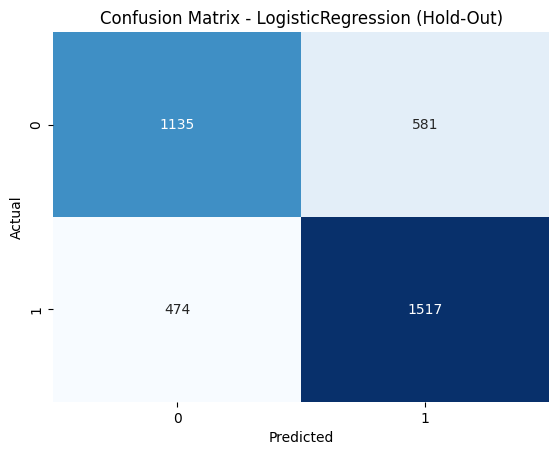

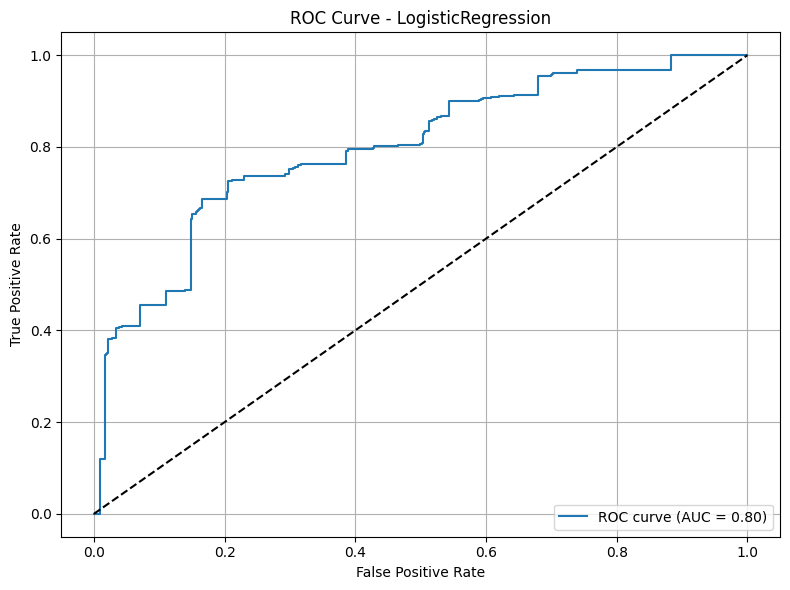

In [56]:
lg = LogisticRegression(max_iter=1000)
train_model_holdout(growing_stress_x, growing_stress_y, lg)

Classification Report - LogisticRegression (Cross-Validation)
              precision    recall  f1-score   support

          No       0.70      0.65      0.67      8578
         Yes       0.72      0.75      0.73      9956

    accuracy                           0.71     18534
   macro avg       0.71      0.70      0.70     18534
weighted avg       0.71      0.71      0.71     18534



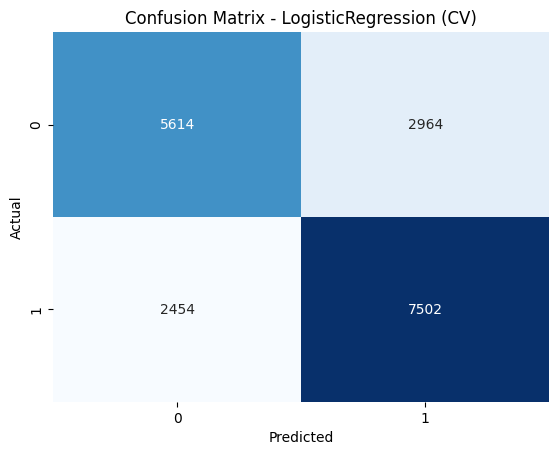

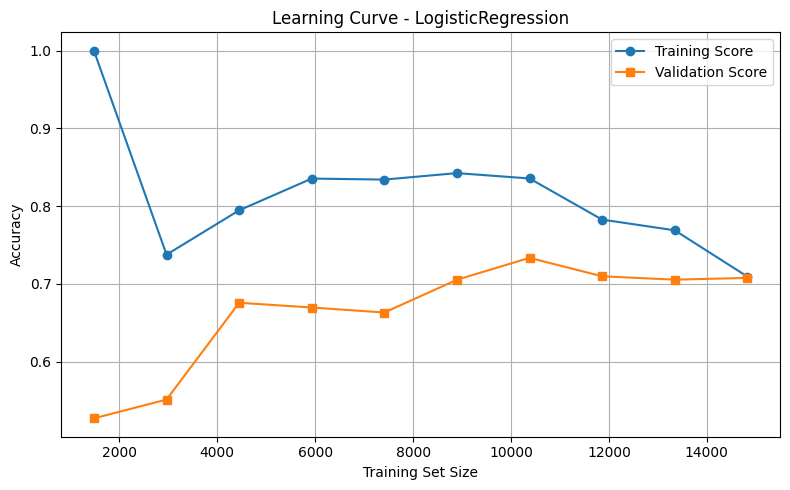

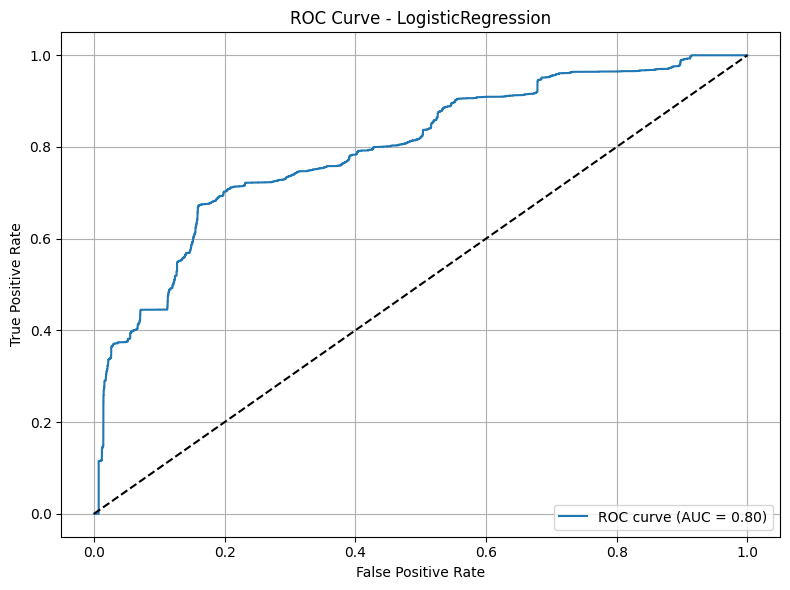

In [57]:
lg = LogisticRegression(max_iter=1000)
train_model_cv(growing_stress_x, growing_stress_y, lg)

Average Precision: 0.711
Average Recall:    0.711
Average F1-Score:  0.711


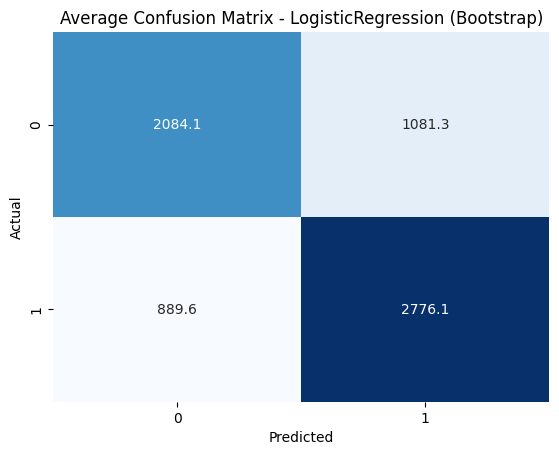

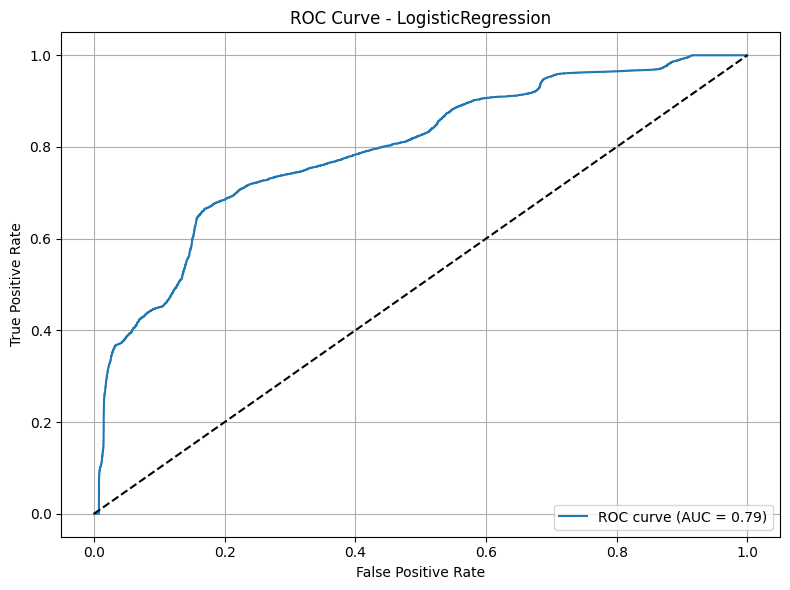

In [58]:
lg = LogisticRegression(max_iter=1000)
train_model_bootstrap(growing_stress_x, growing_stress_y, lg)

#### Gaussian Naive Bayes

Classification Report - GaussianNB with Hold-Out Test Set
              precision    recall  f1-score   support

          No       0.74      0.71      0.72      1716
         Yes       0.76      0.78      0.77      1991

    accuracy                           0.75      3707
   macro avg       0.75      0.75      0.75      3707
weighted avg       0.75      0.75      0.75      3707



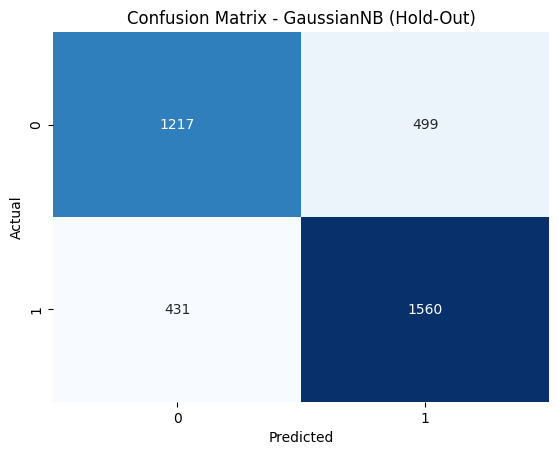

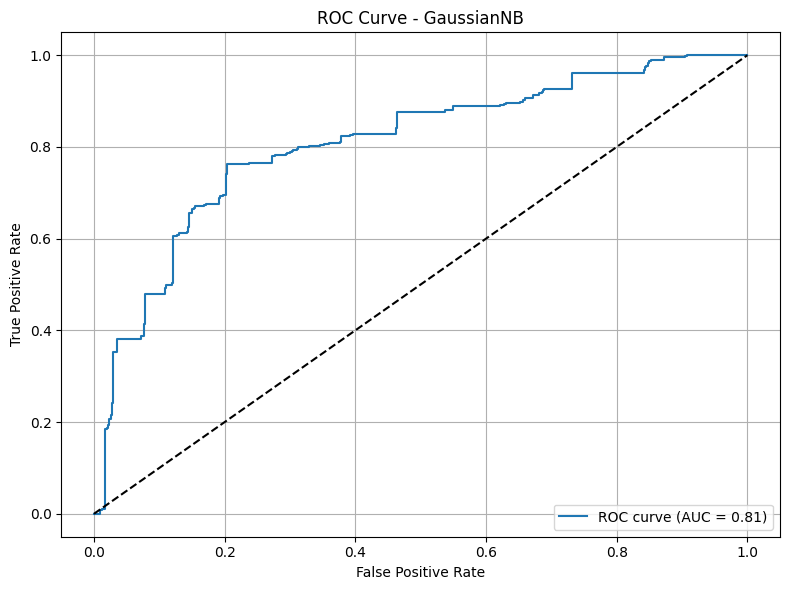

In [59]:
gb = GaussianNB()
train_model_holdout(growing_stress_x, growing_stress_y, gb)

Classification Report - GaussianNB (Cross-Validation)
              precision    recall  f1-score   support

          No       0.74      0.71      0.72      8578
         Yes       0.76      0.78      0.77      9956

    accuracy                           0.75     18534
   macro avg       0.75      0.74      0.74     18534
weighted avg       0.75      0.75      0.75     18534



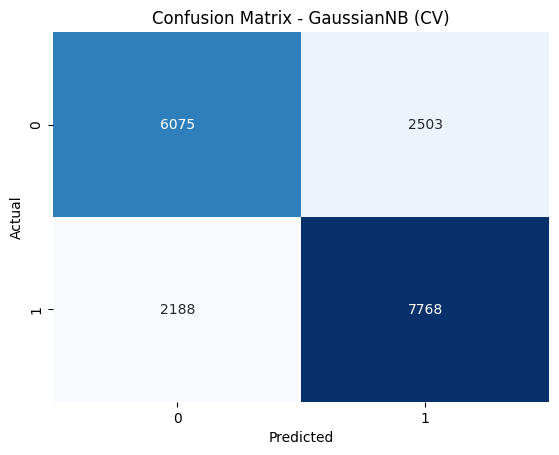

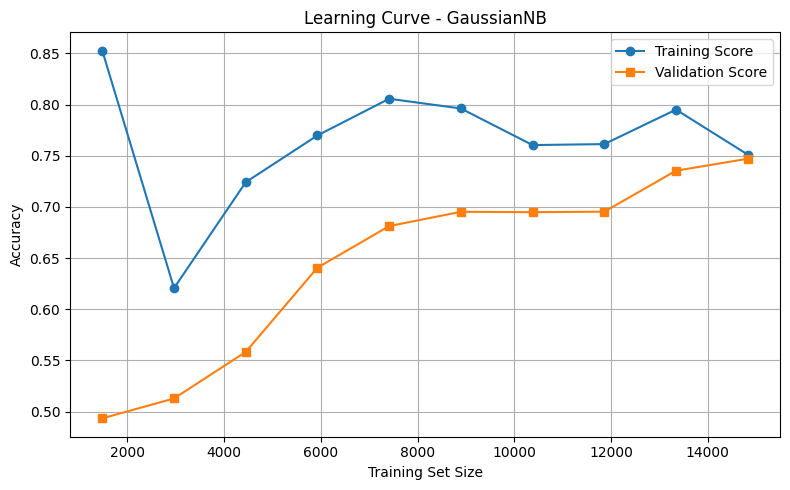

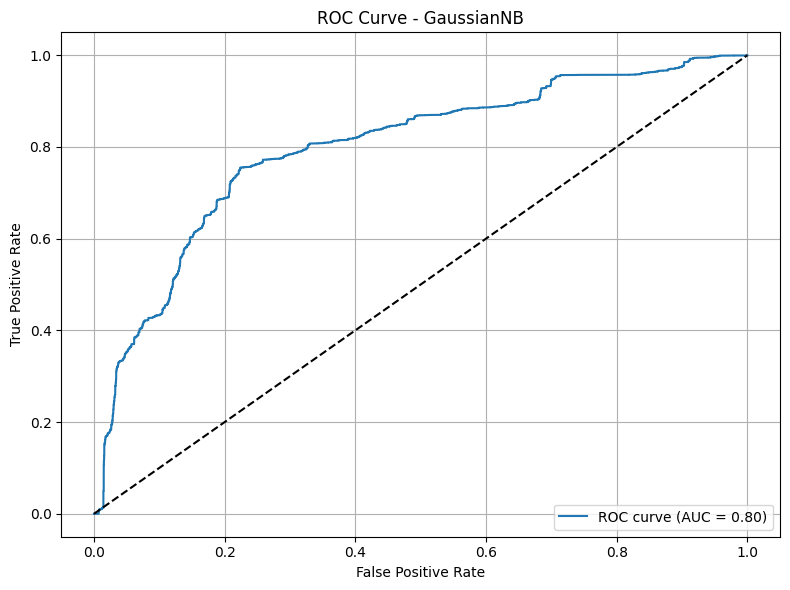

In [60]:
gb = GaussianNB()
train_model_cv(growing_stress_x, growing_stress_y, gb)

Average Precision: 0.743
Average Recall:    0.744
Average F1-Score:  0.743


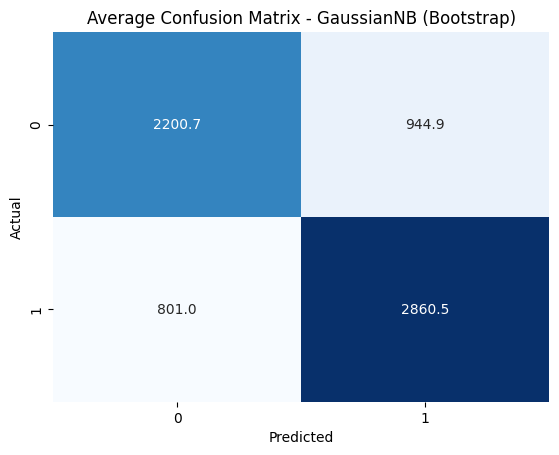

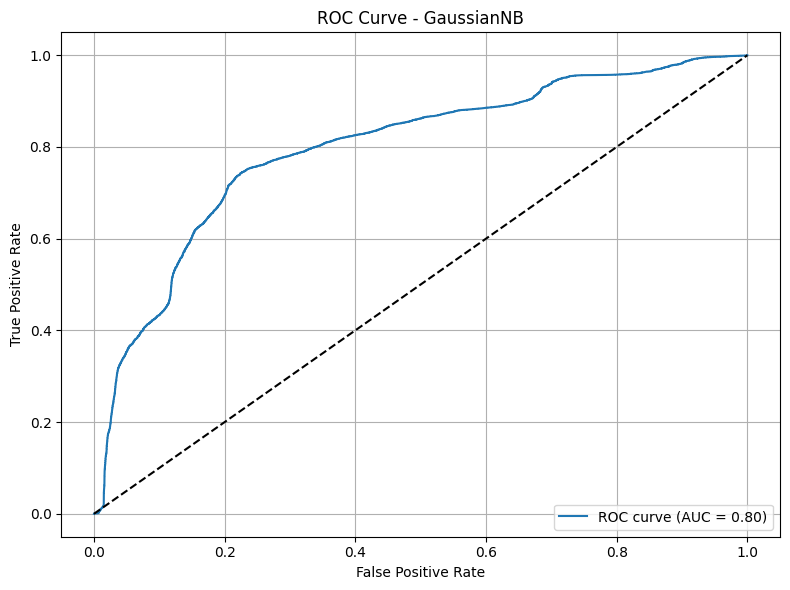

In [61]:
gb = GaussianNB()
train_model_bootstrap(growing_stress_x, growing_stress_y, gb)

#### Random Forest

Classification Report - RandomForestClassifier with Hold-Out Test Set
              precision    recall  f1-score   support

          No       1.00      1.00      1.00      1716
         Yes       1.00      1.00      1.00      1991

    accuracy                           1.00      3707
   macro avg       1.00      1.00      1.00      3707
weighted avg       1.00      1.00      1.00      3707



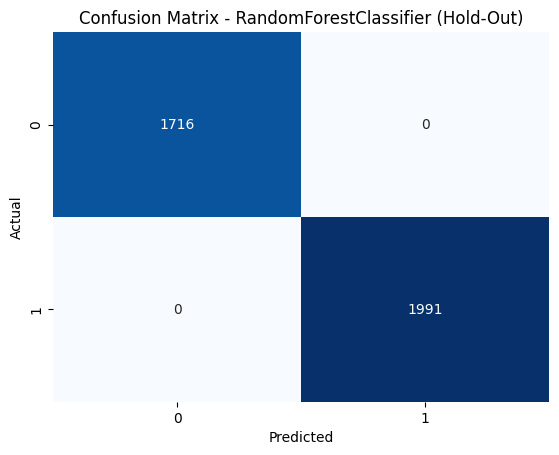

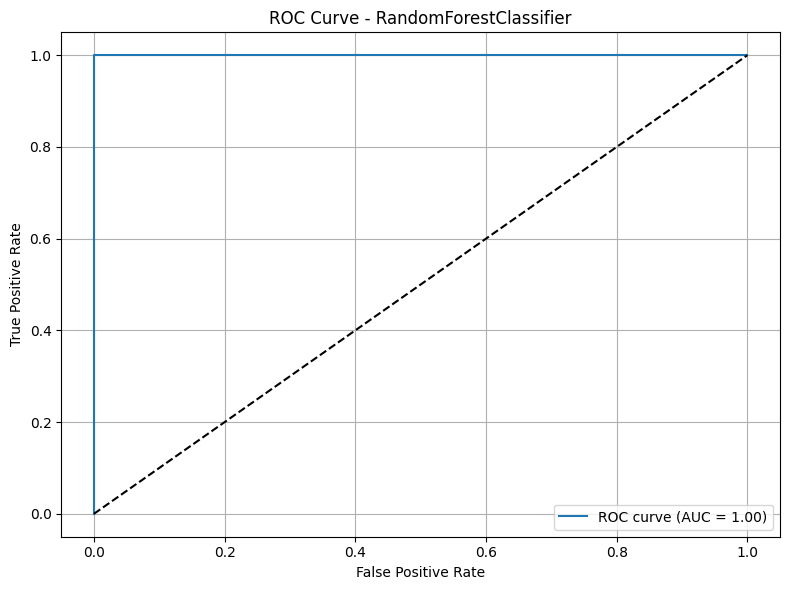

In [62]:
rf = RandomForestClassifier(random_state=42)
train_model_holdout(growing_stress_x, growing_stress_y, rf)

Classification Report - RandomForestClassifier (Cross-Validation)
              precision    recall  f1-score   support

          No       1.00      1.00      1.00      8578
         Yes       1.00      1.00      1.00      9956

    accuracy                           1.00     18534
   macro avg       1.00      1.00      1.00     18534
weighted avg       1.00      1.00      1.00     18534



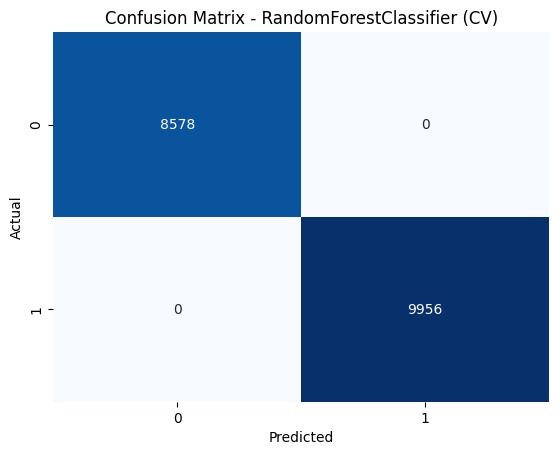

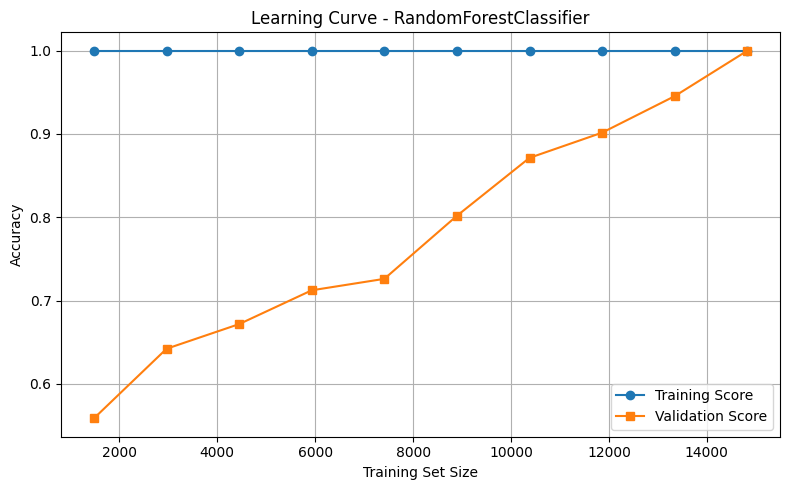

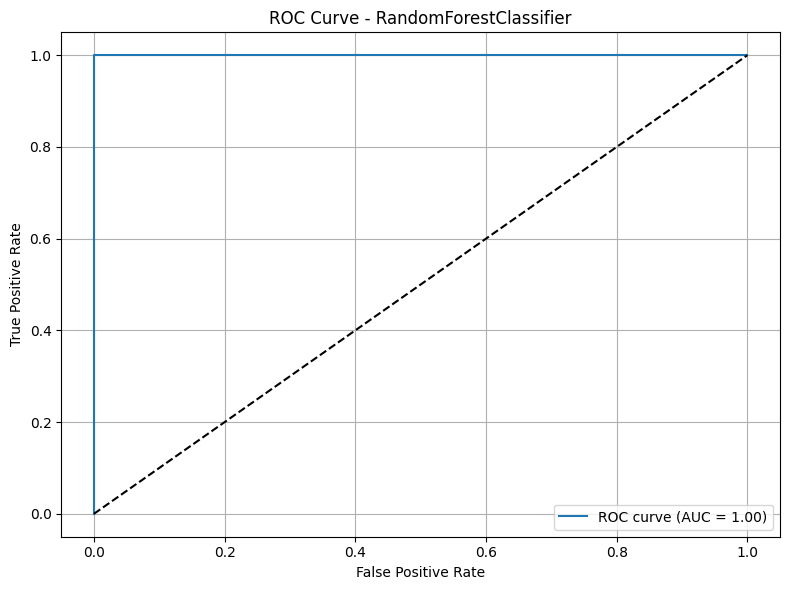

In [63]:
rf = RandomForestClassifier(random_state=42)
train_model_cv(growing_stress_x, growing_stress_y, rf)

Average Precision: 1.000
Average Recall:    1.000
Average F1-Score:  1.000


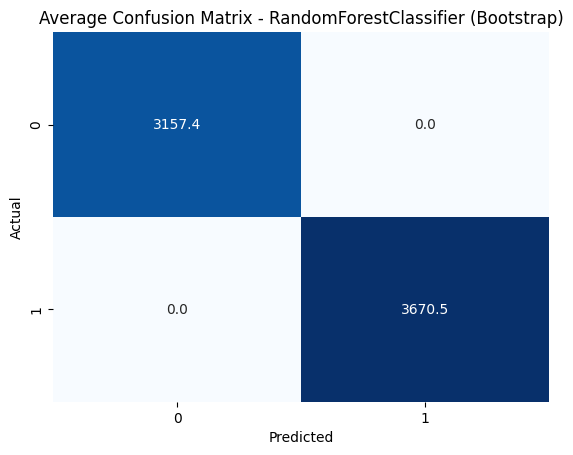

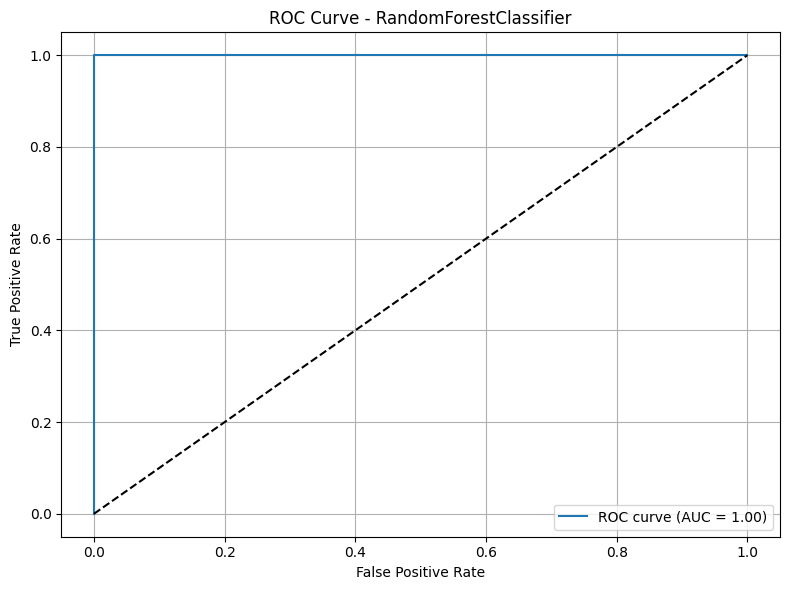

In [64]:
rf = RandomForestClassifier(random_state=42)
train_model_bootstrap(growing_stress_x, growing_stress_y, rf)

### Decision Tree

Classification Report - DecisionTreeClassifier with Hold-Out Test Set
              precision    recall  f1-score   support

          No       1.00      1.00      1.00      1716
         Yes       1.00      1.00      1.00      1991

    accuracy                           1.00      3707
   macro avg       1.00      1.00      1.00      3707
weighted avg       1.00      1.00      1.00      3707



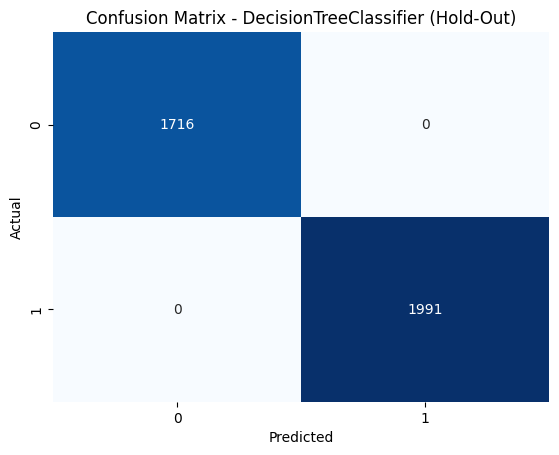

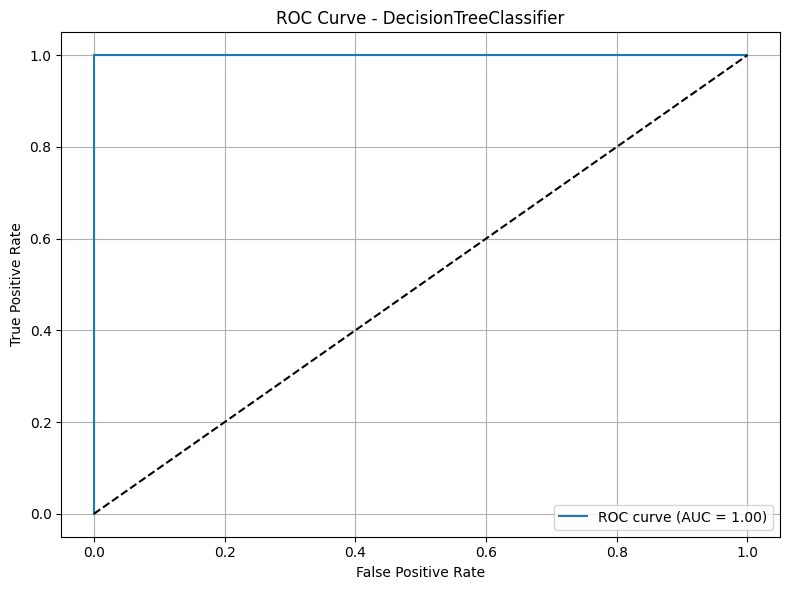

In [65]:
dt = DecisionTreeClassifier(random_state=42)
train_model_holdout(growing_stress_x, growing_stress_y, dt)

Classification Report - DecisionTreeClassifier (Cross-Validation)
              precision    recall  f1-score   support

          No       1.00      1.00      1.00      8578
         Yes       1.00      1.00      1.00      9956

    accuracy                           1.00     18534
   macro avg       1.00      1.00      1.00     18534
weighted avg       1.00      1.00      1.00     18534



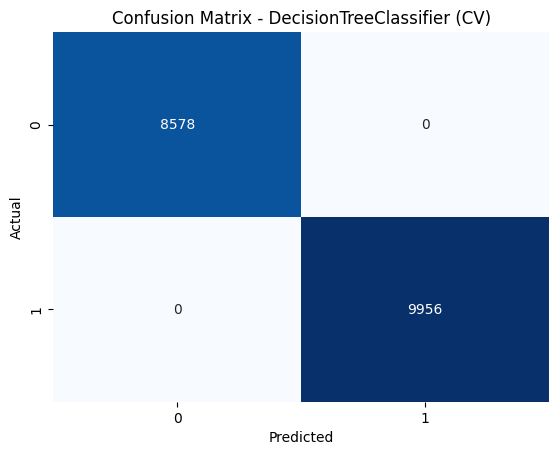

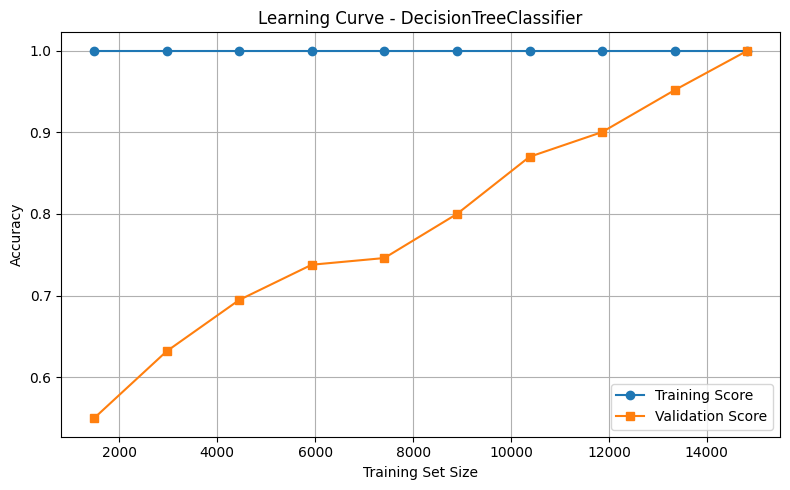

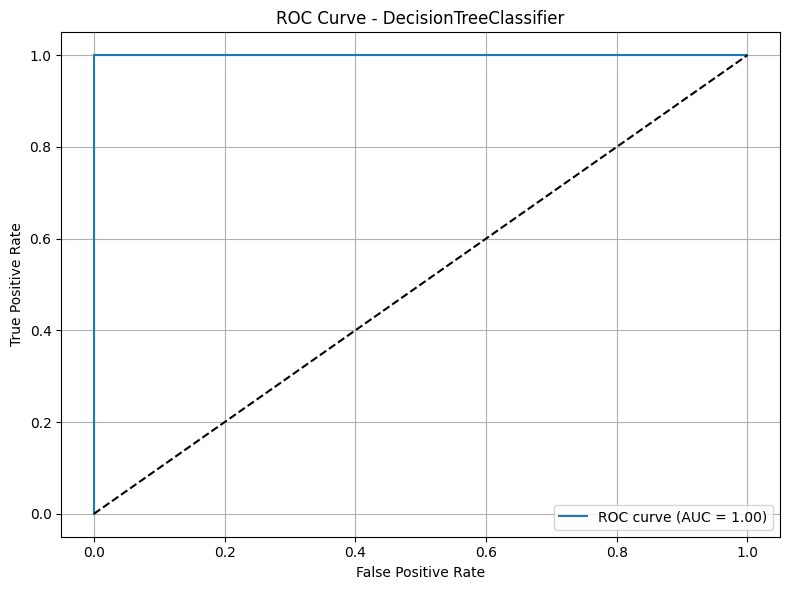

In [66]:
dt = DecisionTreeClassifier(random_state=42)
train_model_cv(growing_stress_x, growing_stress_y, dt)

Average Precision: 1.000
Average Recall:    1.000
Average F1-Score:  1.000


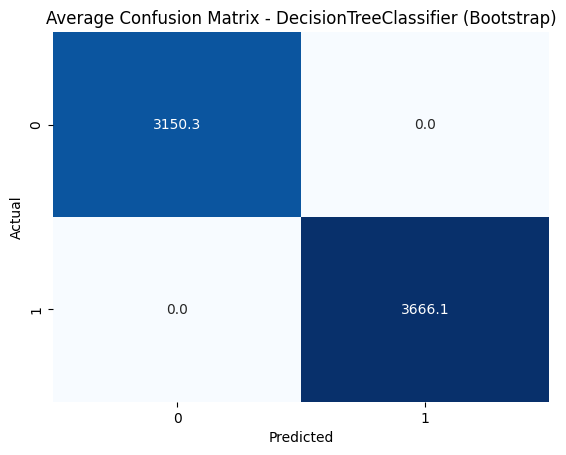

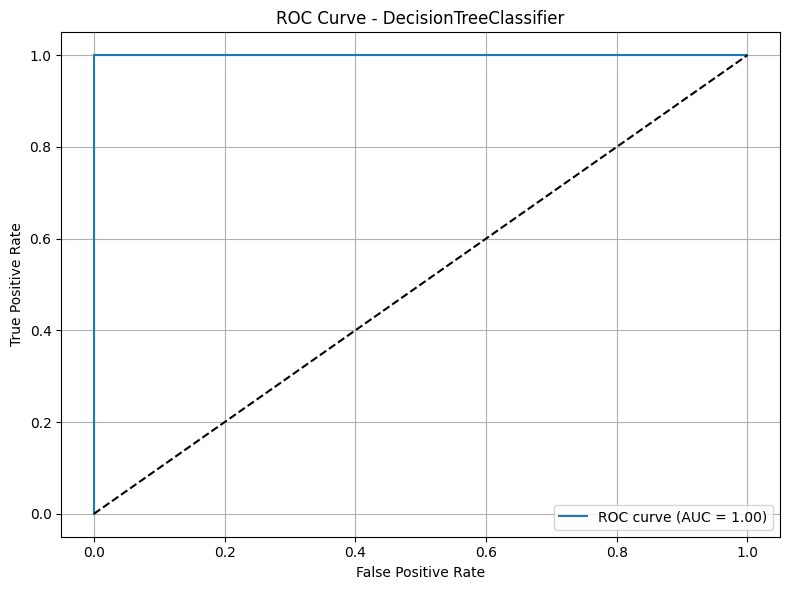

In [67]:
dt = DecisionTreeClassifier(random_state=42)
train_model_bootstrap(growing_stress_x, growing_stress_y, dt)

### K Nearest Neighbour

Classification Report - KNeighborsClassifier with Hold-Out Test Set
              precision    recall  f1-score   support

          No       1.00      1.00      1.00      1716
         Yes       1.00      1.00      1.00      1991

    accuracy                           1.00      3707
   macro avg       1.00      1.00      1.00      3707
weighted avg       1.00      1.00      1.00      3707



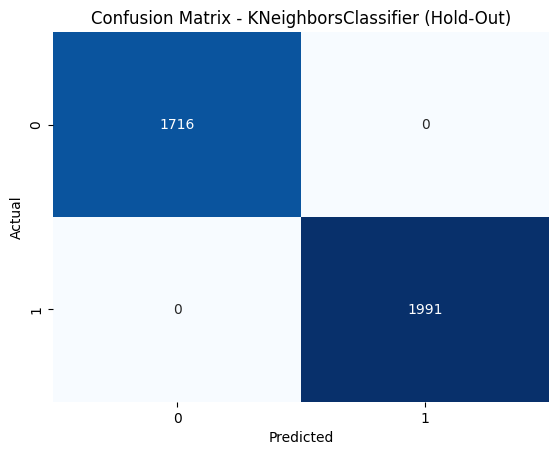

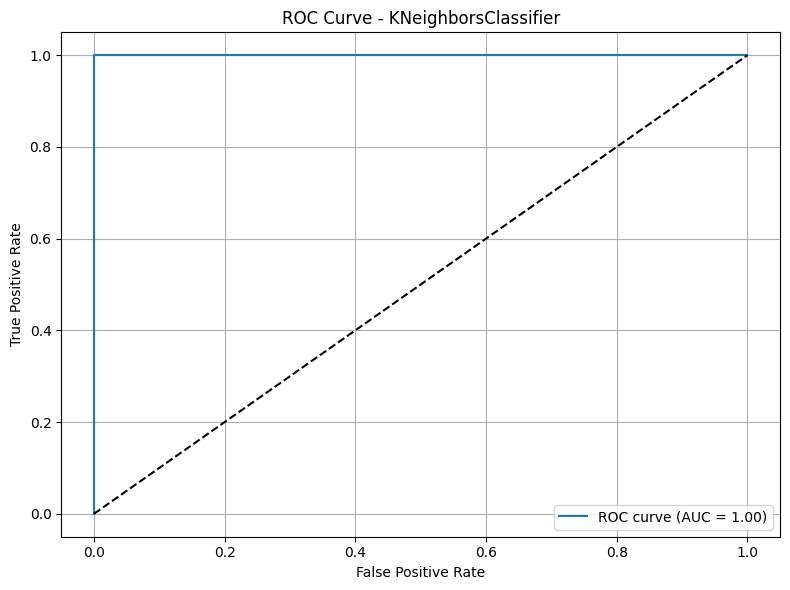

In [68]:
knn = KNeighborsClassifier(n_neighbors=4)
train_model_holdout(growing_stress_x, growing_stress_y, knn)

Classification Report - KNeighborsClassifier (Cross-Validation)
              precision    recall  f1-score   support

          No       1.00      1.00      1.00      8578
         Yes       1.00      1.00      1.00      9956

    accuracy                           1.00     18534
   macro avg       1.00      1.00      1.00     18534
weighted avg       1.00      1.00      1.00     18534



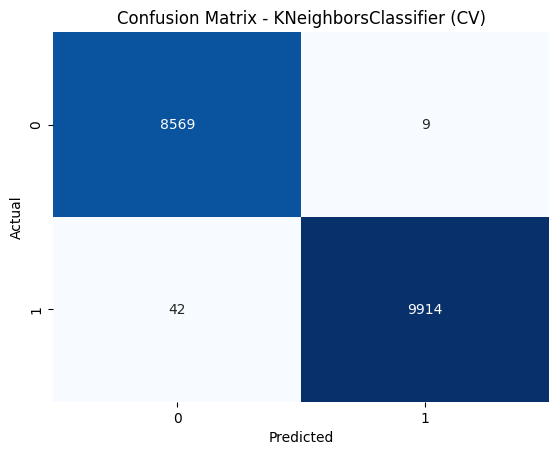

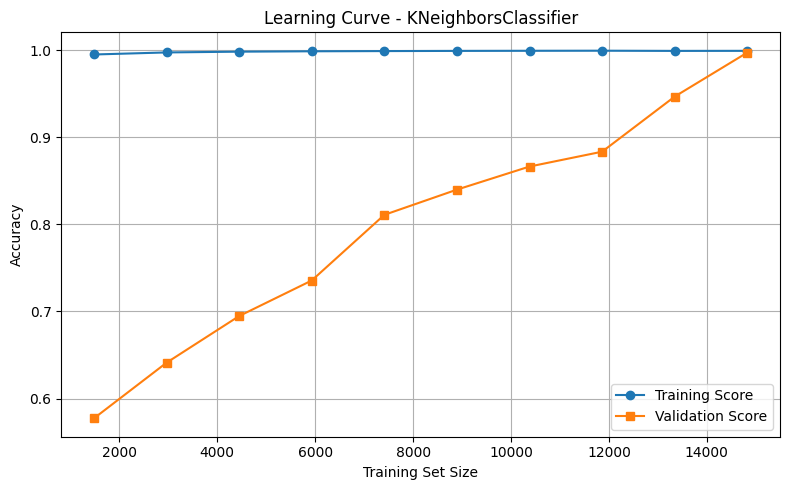

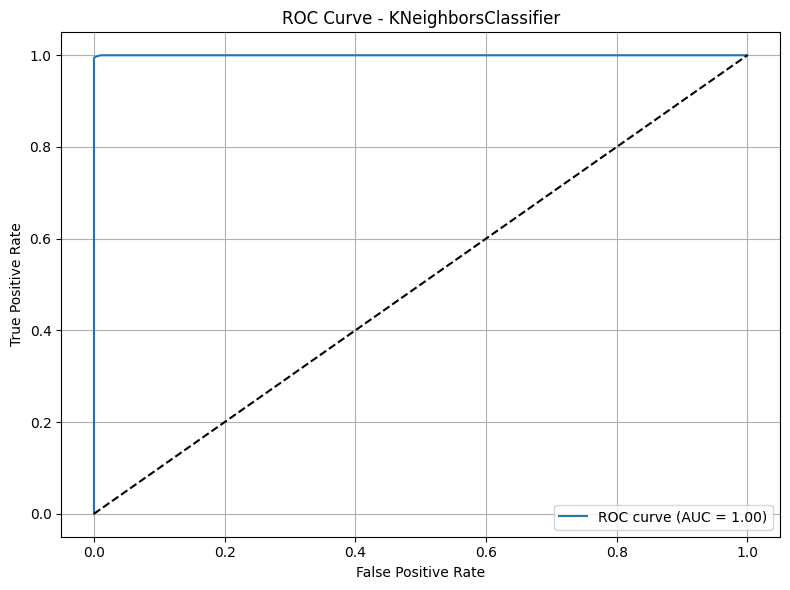

In [69]:
knn = KNeighborsClassifier(n_neighbors=4)
train_model_cv(growing_stress_x, growing_stress_y, knn)

Average Precision: 1.000
Average Recall:    1.000
Average F1-Score:  1.000


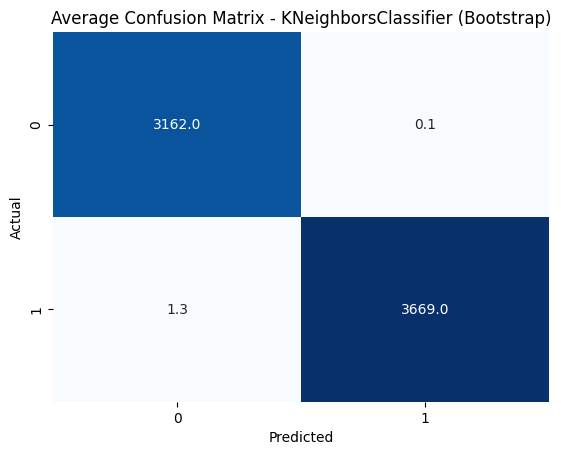

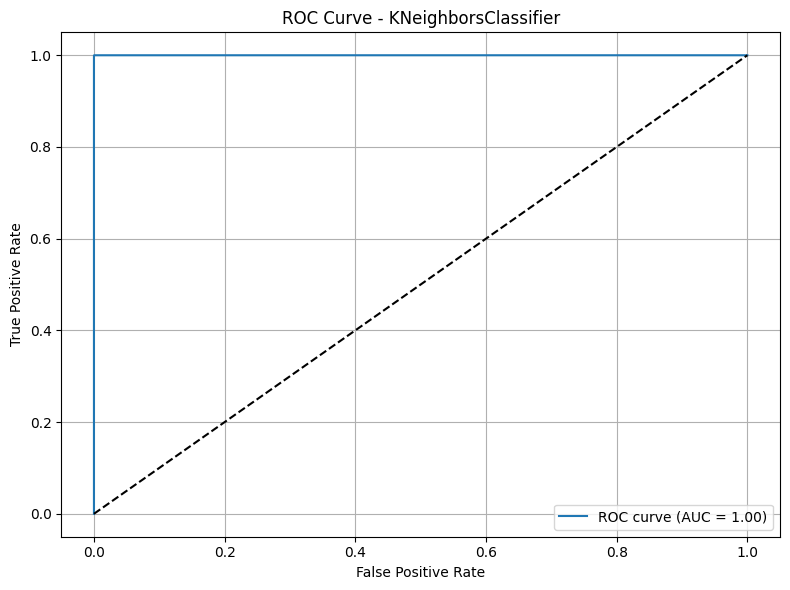

In [70]:
knn = KNeighborsClassifier(n_neighbors=4)
train_model_bootstrap(growing_stress_x, growing_stress_y, knn)

### Neural Network

In [71]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder


def train_neural_network_holdout(local_x, local_y, test_size=0.2, random_state=42, epochs=20, batch_size=32):

    if local_y.dtype == 'object' or local_y.dtype == 'category':
        le = LabelEncoder()
        local_y = le.fit_transform(local_y)

    # Identify categorical and numeric columns
    categorical_cols = local_x.select_dtypes(include='object').columns
    numeric_cols = local_x.select_dtypes(include=['int64', 'float64']).columns

    # Preprocessing pipeline
    preprocessor = ColumnTransformer([
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
        ('num', StandardScaler(), numeric_cols)
    ])

    # Split the data first
    X_train_raw, X_test_raw, y_train, y_test = train_test_split(
        local_x, local_y, test_size=test_size, stratify=local_y, random_state=random_state
    )

    # Fit the preprocessor only on training data
    preprocessor.fit(X_train_raw)

    # Transform data
    X_train = preprocessor.transform(X_train_raw)
    X_test = preprocessor.transform(X_test_raw)

    input_dim = X_train.shape[1]

    # Build the neural network
    model = Sequential([
        Dense(128, activation='relu', input_shape=(input_dim,)),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(16, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])

    model.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])

    # Train the model
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=1,
                        validation_data=(X_test, y_test))

    # Predict on test set
    y_pred_prob = model.predict(X_test).flatten()
    y_pred = (y_pred_prob >= 0.5).astype(int)

    # Print classification report
    print("Classification Report - Neural Network")
    print(classification_report(y_test, y_pred))

    # Plot confusion matrix
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix - Neural Network")
    plt.show()

    # Optionally return model and preprocessor for reuse
    return model, preprocessor, history



/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
464/464 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.6606 - loss: 0.5681 - val_accuracy: 0.9849 - val_loss: 0.0439
Epoch 2/20
464/464 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9782 - loss: 0.0672 - val_accuracy: 0.9995 - val_loss: 0.0042
Epoch 3/20
464/464 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9934 - loss: 0.0212 - val_accuracy: 1.0000 - val_loss: 0.0013
Epoch 4/20
464/464 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9965 - loss: 0.0129 - val_accuracy: 1.0000 - val_loss: 3.7252e-04
Epoch 5/20
464/464 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9971 - loss: 0.0113 - val_accuracy: 1.0000 - val_loss: 9.4724e-05
Epoch 6/20
464/464 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9985 - loss: 0.0071 - val_accuracy: 1.0000 - val_loss: 7.1275e-05
Epoch 7/20
464/464 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9984 - loss: 0.0077 - val_accuracy: 1.0000 - val_loss: 2.2435e-05
Epoch 8/20
464/464 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9983 - loss: 0.0075 - 

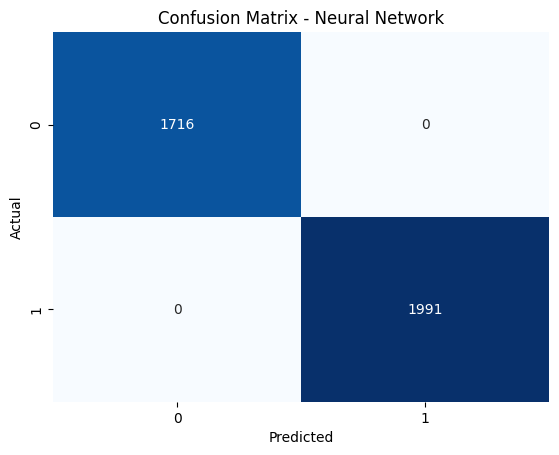

(<Sequential name=sequential, built=True>,
 ColumnTransformer(transformers=[('cat', OneHotEncoder(handle_unknown='ignore'),
                                  Index(['gender', 'occupation', 'self_employed', 'family_history', 'treatment',
        'days_indoors', 'changes_habits', 'mental_health_history',
        'mood_swings', 'coping_struggles', 'work_interest', 'social_weakness',
        'mental_health_interview', 'care_options'],
       dtype='object')),
                                 ('num', StandardScaler(),
                                  Index([], dtype='object'))]),
 <keras.src.callbacks.history.History at 0x14a89b8d0>)

In [72]:
train_neural_network_holdout(growing_stress_x, growing_stress_y)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def create_nn_model(input_dim):
    model = Sequential([
        Dense(128, activation='relu', input_shape=(input_dim,)),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(16, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    model.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
    return model

def train_neural_network_cv(local_x, local_y, n_splits=5, epochs=20, batch_size=32, random_state=42):
    # Encode labels if categorical
    if local_y.dtype == 'object' or local_y.dtype.name == 'category':
        le = LabelEncoder()
        local_y_enc = le.fit_transform(local_y)
    else:
        local_y_enc = local_y.values if hasattr(local_y, "values") else local_y

    categorical_cols = local_x.select_dtypes(include='object').columns
    numeric_cols = local_x.select_dtypes(include=['int64', 'float64']).columns

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    train_accuracies = []
    val_accuracies = []

    fold_reports = []
    fold_conf_matrices = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(local_x, local_y_enc), 1):
        print(f"Fold {fold}")

        X_train_raw, X_val_raw = local_x.iloc[train_idx], local_x.iloc[val_idx]
        y_train, y_val = local_y_enc[train_idx], local_y_enc[val_idx]

        # Preprocessing pipeline fitted on train only to avoid leakage
        preprocessor = ColumnTransformer([
            ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
            ('num', StandardScaler(), numeric_cols)
        ])
        preprocessor.fit(X_train_raw)
        X_train = preprocessor.transform(X_train_raw)
        X_val = preprocessor.transform(X_val_raw)

        # Create and train the model
        model = create_nn_model(input_dim=X_train.shape[1])

        history = model.fit(X_train, y_train,
                            epochs=epochs,
                            batch_size=batch_size,
                            verbose=0,
                            validation_data=(X_val, y_val))

        # Collect accuracy for learning curve
        train_acc = history.history['accuracy'][-1]
        val_acc = history.history['val_accuracy'][-1]
        train_accuracies.append(train_acc)
        val_accuracies.append(val_acc)

        # Predict for classification report & confusion matrix
        y_val_pred_prob = model.predict(X_val).flatten()
        y_val_pred = (y_val_pred_prob >= 0.5).astype(int)

        print(classification_report(y_val, y_val_pred))
        fold_reports.append(classification_report(y_val, y_val_pred, output_dict=True))
        cm = confusion_matrix(y_val, y_val_pred)
        fold_conf_matrices.append(cm)

        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title(f"Confusion Matrix - Fold {fold}")
        plt.show()

    # Plot learning curve (average over folds)
    plt.plot(range(1, n_splits+1), train_accuracies, label='Train Accuracy')
    plt.plot(range(1, n_splits+1), val_accuracies, label='Validation Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Learning Curve Across Folds (Final Epoch Accuracy)')
    plt.legend()
    plt.grid()
    plt.show()

    return fold_reports, fold_conf_matrices

Fold 1


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1715
           1       1.00      1.00      1.00      1992

    accuracy                           1.00      3707
   macro avg       1.00      1.00      1.00      3707
weighted avg       1.00      1.00      1.00      3707



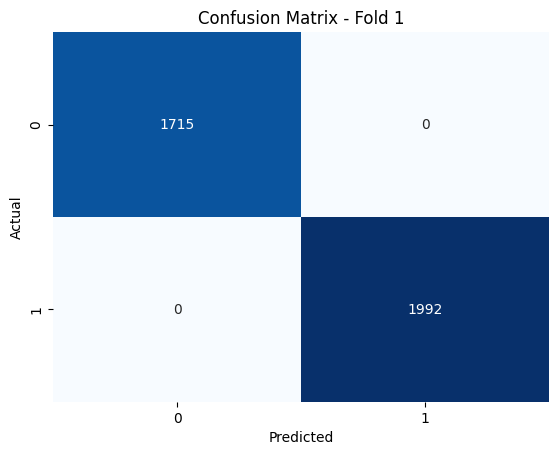

Fold 2


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1716
           1       1.00      1.00      1.00      1991

    accuracy                           1.00      3707
   macro avg       1.00      1.00      1.00      3707
weighted avg       1.00      1.00      1.00      3707



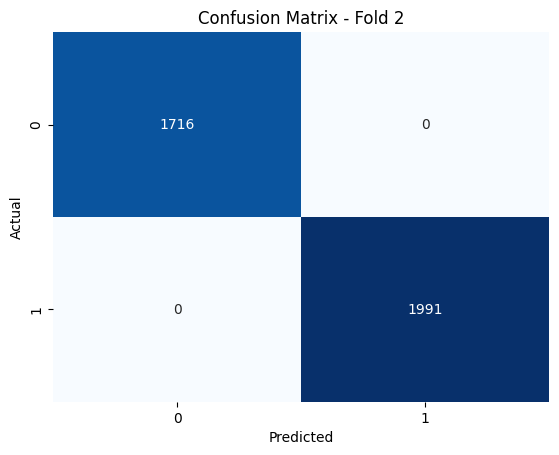

Fold 3


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1716
           1       1.00      1.00      1.00      1991

    accuracy                           1.00      3707
   macro avg       1.00      1.00      1.00      3707
weighted avg       1.00      1.00      1.00      3707



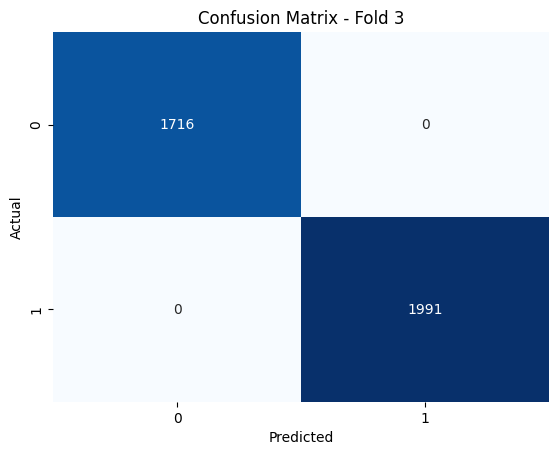

Fold 4


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1716
           1       1.00      1.00      1.00      1991

    accuracy                           1.00      3707
   macro avg       1.00      1.00      1.00      3707
weighted avg       1.00      1.00      1.00      3707



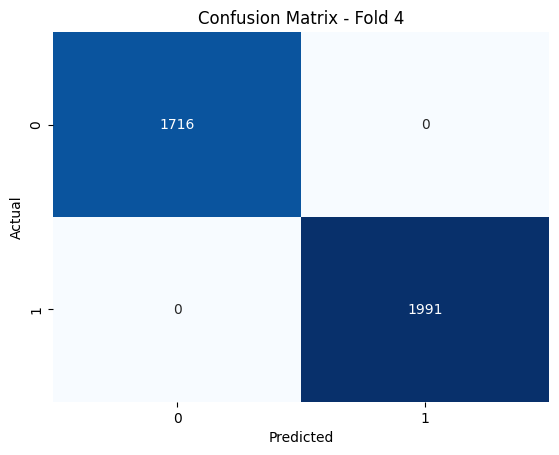

Fold 5


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1715
           1       1.00      1.00      1.00      1991

    accuracy                           1.00      3706
   macro avg       1.00      1.00      1.00      3706
weighted avg       1.00      1.00      1.00      3706



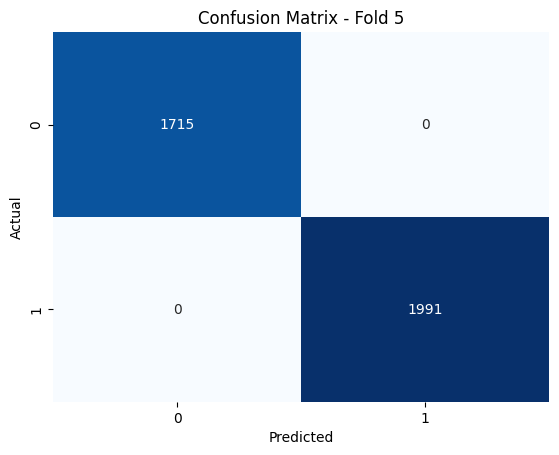

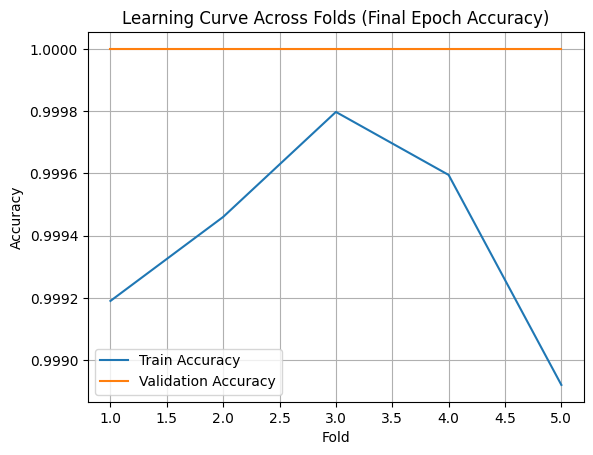

In [74]:
fold_reports, fold_conf_matrices = train_neural_network_cv(growing_stress_x, growing_stress_y, epochs=30)

In [75]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

def create_nn_model(input_dim):
    model = Sequential([
        Dense(128, activation='relu', input_shape=(input_dim,)),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(16, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])
    model.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
    return model

def train_neural_network_bootstrap(local_x, local_y, n_iterations=10, epochs=20, batch_size=32, random_state=42):
    np.random.seed(random_state)

    # Encode labels if needed
    if local_y.dtype == 'object' or local_y.dtype.name == 'category':
        le = LabelEncoder()
        local_y_enc = le.fit_transform(local_y)
    else:
        local_y_enc = local_y.values if hasattr(local_y, "values") else local_y

    categorical_cols = local_x.select_dtypes(include='object').columns
    numeric_cols = local_x.select_dtypes(include=['int64', 'float64']).columns

    n_samples = len(local_x)
    reports = []
    conf_matrices = []
    train_accuracies = []
    oob_accuracies = []

    for i in range(n_iterations):
        print(f"Bootstrap iteration {i+1}")

        # Bootstrap sample indices (with replacement)
        train_indices = np.random.choice(range(n_samples), size=n_samples, replace=True)
        oob_indices = list(set(range(n_samples)) - set(train_indices))
        if not oob_indices:
            print("No OOB samples for this iteration, skipping.")
            continue

        X_train_raw = local_x.iloc[train_indices]
        y_train = local_y_enc[train_indices]

        X_oob_raw = local_x.iloc[oob_indices]
        y_oob = local_y_enc[oob_indices]

        # Fit preprocessing only on bootstrap train
        preprocessor = ColumnTransformer([
            ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
            ('num', StandardScaler(), numeric_cols)
        ])
        preprocessor.fit(X_train_raw)

        X_train = preprocessor.transform(X_train_raw)
        X_oob = preprocessor.transform(X_oob_raw)

        # Build and train model
        model = create_nn_model(input_dim=X_train.shape[1])
        history = model.fit(X_train, y_train,
                            epochs=epochs,
                            batch_size=batch_size,
                            verbose=0)

        # Train accuracy (last epoch)
        train_acc = history.history['accuracy'][-1]
        train_accuracies.append(train_acc)

        # Predict on OOB samples
        y_oob_pred_prob = model.predict(X_oob).flatten()
        y_oob_pred = (y_oob_pred_prob >= 0.5).astype(int)

        # OOB accuracy
        oob_acc = accuracy_score(y_oob, y_oob_pred)
        oob_accuracies.append(oob_acc)

        # Classification report and confusion matrix for OOB
        print(classification_report(y_oob, y_oob_pred))
        reports.append(classification_report(y_oob, y_oob_pred, output_dict=True))
        conf_matrices.append(confusion_matrix(y_oob, y_oob_pred))

        sns.heatmap(conf_matrices[-1], annot=True, fmt='d', cmap='Blues', cbar=False)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title(f"Confusion Matrix - Bootstrap Iteration {i+1}")
        plt.show()

    # Average metrics
    avg_precision = np.mean([r['weighted avg']['precision'] for r in reports])
    avg_recall = np.mean([r['weighted avg']['recall'] for r in reports])
    avg_f1 = np.mean([r['weighted avg']['f1-score'] for r in reports])
    avg_train_acc = np.mean(train_accuracies)
    avg_oob_acc = np.mean(oob_accuracies)

    print(f"Average Train Accuracy: {avg_train_acc:.3f}")
    print(f"Average OOB Accuracy: {avg_oob_acc:.3f}")
    print(f"Average Precision (OOB): {avg_precision:.3f}")
    print(f"Average Recall (OOB):    {avg_recall:.3f}")
    print(f"Average F1-Score (OOB):  {avg_f1:.3f}")

    # Plot average confusion matrix
    avg_conf_matrix = np.mean(conf_matrices, axis=0)
    sns.heatmap(avg_conf_matrix, annot=True, fmt='.1f', cmap='Blues', cbar=False)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Average Confusion Matrix (Bootstrap)")
    plt.show()

    # Plot train vs OOB accuracy across iterations
    plt.plot(range(1, len(train_accuracies)+1), train_accuracies, label='Train Accuracy')
    plt.plot(range(1, len(oob_accuracies)+1), oob_accuracies, label='OOB Accuracy')
    plt.xlabel('Bootstrap Iteration')
    plt.ylabel('Accuracy')
    plt.title('Train vs OOB Accuracy Across Bootstrap Iterations')
    plt.legend()
    plt.grid()
    plt.show()

    return reports, conf_matrices

Bootstrap iteration 1


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


214/214 ━━━━━━━━━━━━━━━━━━━━ 0s 928us/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3184
           1       1.00      1.00      1.00      3641

    accuracy                           1.00      6825
   macro avg       1.00      1.00      1.00      6825
weighted avg       1.00      1.00      1.00      6825



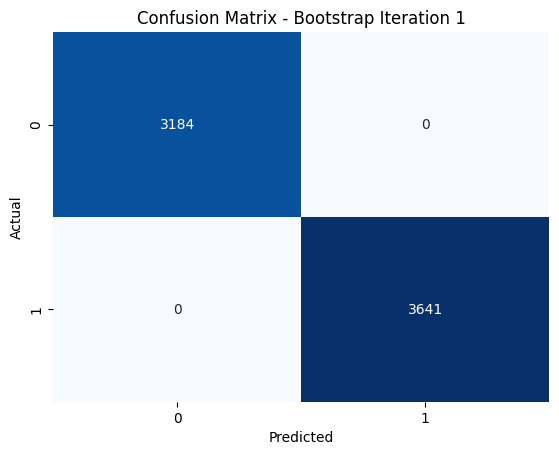

Bootstrap iteration 2


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


214/214 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3141
           1       1.00      1.00      1.00      3703

    accuracy                           1.00      6844
   macro avg       1.00      1.00      1.00      6844
weighted avg       1.00      1.00      1.00      6844



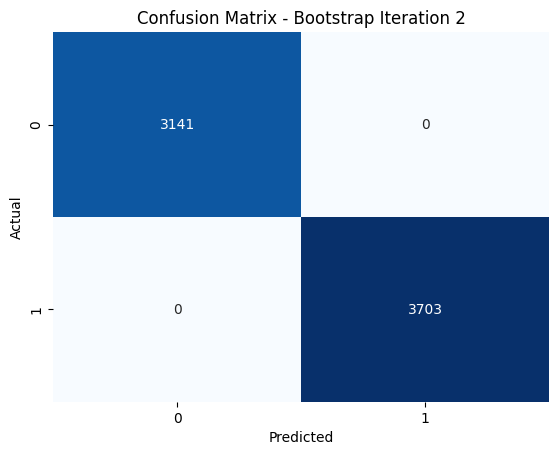

Bootstrap iteration 3


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


212/212 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3053
           1       1.00      1.00      1.00      3729

    accuracy                           1.00      6782
   macro avg       1.00      1.00      1.00      6782
weighted avg       1.00      1.00      1.00      6782



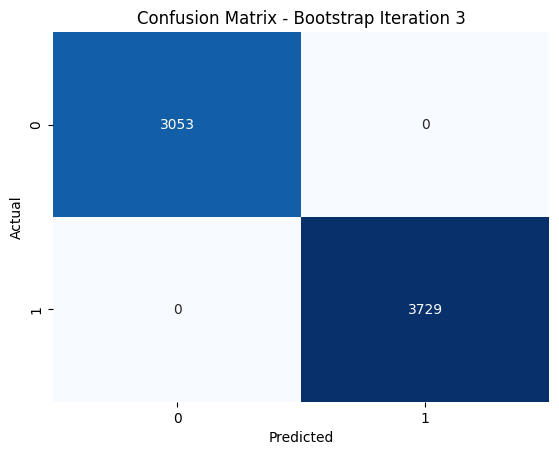

Bootstrap iteration 4


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


212/212 ━━━━━━━━━━━━━━━━━━━━ 0s 942us/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3139
           1       1.00      1.00      1.00      3644

    accuracy                           1.00      6783
   macro avg       1.00      1.00      1.00      6783
weighted avg       1.00      1.00      1.00      6783



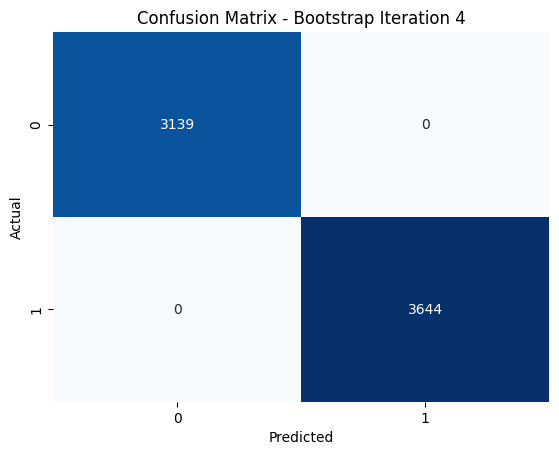

Bootstrap iteration 5


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3193
           1       1.00      1.00      1.00      3657

    accuracy                           1.00      6850
   macro avg       1.00      1.00      1.00      6850
weighted avg       1.00      1.00      1.00      6850



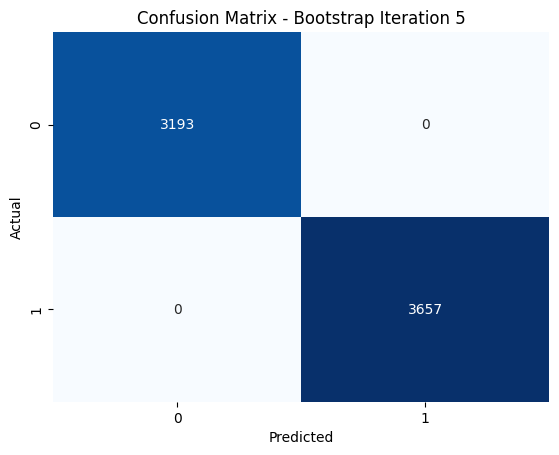

Bootstrap iteration 6


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


213/213 ━━━━━━━━━━━━━━━━━━━━ 0s 998us/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3092
           1       1.00      1.00      1.00      3718

    accuracy                           1.00      6810
   macro avg       1.00      1.00      1.00      6810
weighted avg       1.00      1.00      1.00      6810



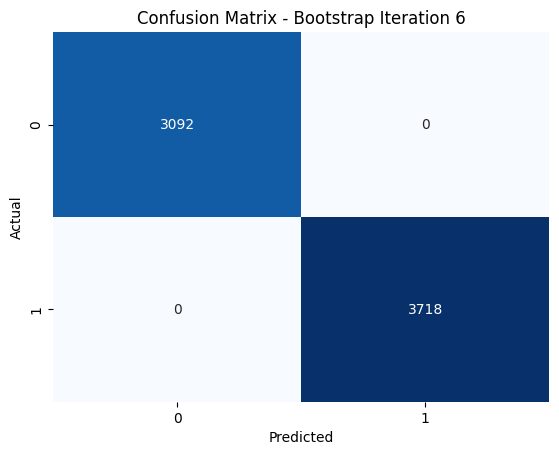

Bootstrap iteration 7


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 0s 946us/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3186
           1       1.00      1.00      1.00      3672

    accuracy                           1.00      6858
   macro avg       1.00      1.00      1.00      6858
weighted avg       1.00      1.00      1.00      6858



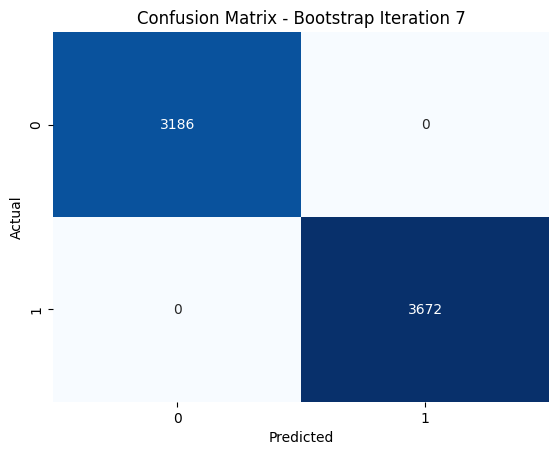

Bootstrap iteration 8


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


213/213 ━━━━━━━━━━━━━━━━━━━━ 0s 982us/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3096
           1       1.00      1.00      1.00      3715

    accuracy                           1.00      6811
   macro avg       1.00      1.00      1.00      6811
weighted avg       1.00      1.00      1.00      6811



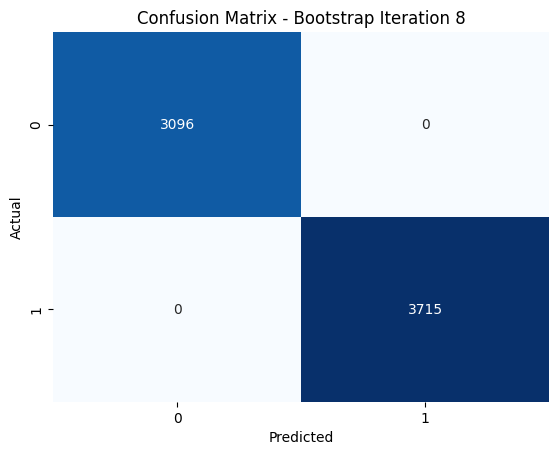

Bootstrap iteration 9


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


215/215 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3141
           1       1.00      1.00      1.00      3713

    accuracy                           1.00      6854
   macro avg       1.00      1.00      1.00      6854
weighted avg       1.00      1.00      1.00      6854



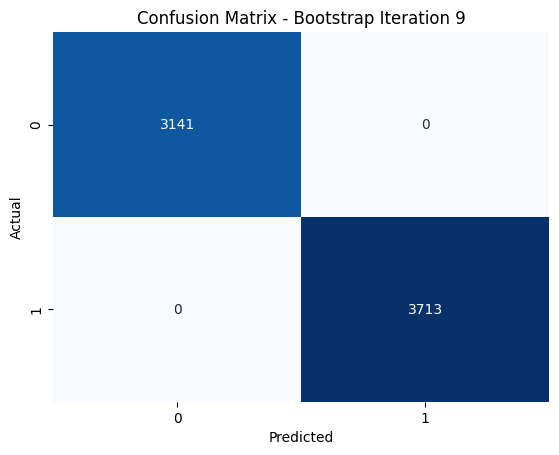

Bootstrap iteration 10


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


213/213 ━━━━━━━━━━━━━━━━━━━━ 0s 964us/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3145
           1       1.00      1.00      1.00      3641

    accuracy                           1.00      6786
   macro avg       1.00      1.00      1.00      6786
weighted avg       1.00      1.00      1.00      6786



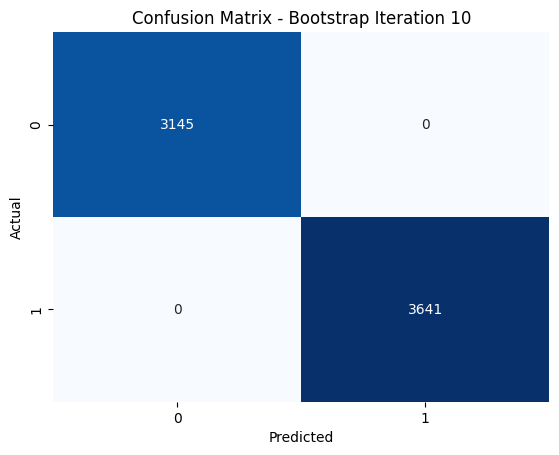

Average Train Accuracy: 1.000
Average OOB Accuracy: 1.000
Average Precision (OOB): 1.000
Average Recall (OOB):    1.000
Average F1-Score (OOB):  1.000


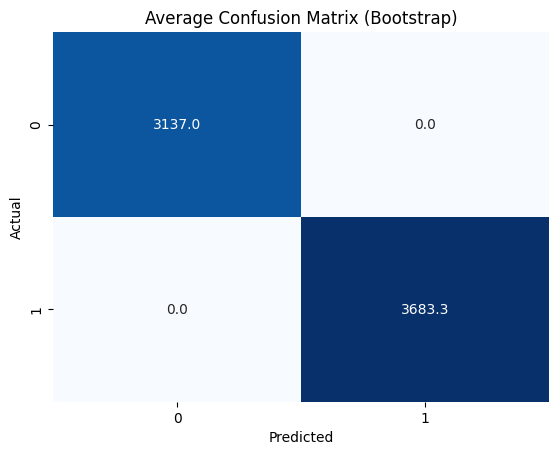

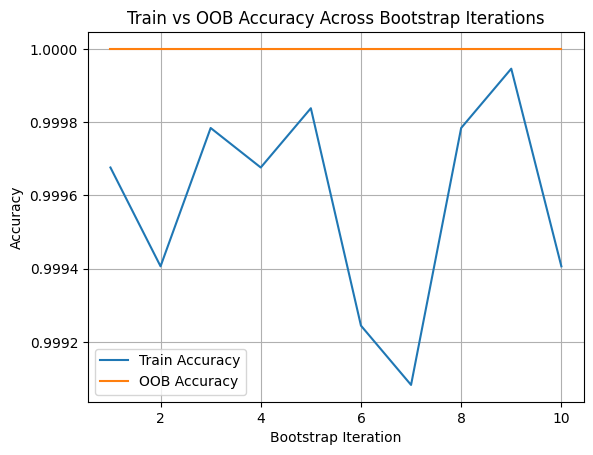

In [76]:
reports, conf_matrices = train_neural_network_bootstrap(growing_stress_x, growing_stress_y, n_iterations=10, epochs=30)

### Support Vector Machine

Classification Report - SVC with Hold-Out Test Set
              precision    recall  f1-score   support

          No       1.00      1.00      1.00      1716
         Yes       1.00      1.00      1.00      1991

    accuracy                           1.00      3707
   macro avg       1.00      1.00      1.00      3707
weighted avg       1.00      1.00      1.00      3707



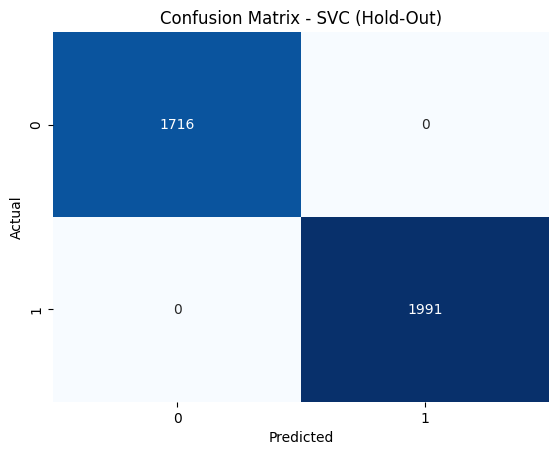

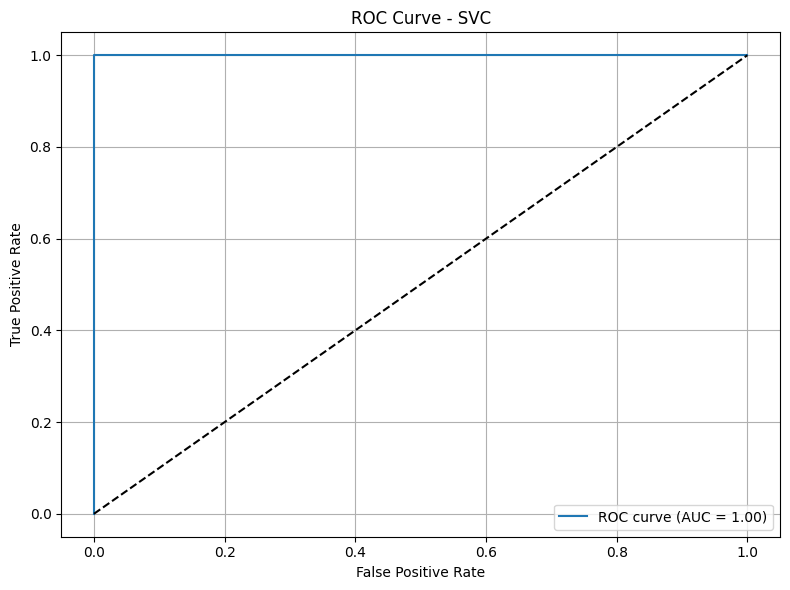

In [78]:
svm = SVC(kernel='rbf',
            C=1.0,
            gamma='scale',
            decision_function_shape='ovr',
            random_state=42,
            probability=True)

train_model_holdout(growing_stress_x, growing_stress_y, svm)

Classification Report - SVC (Cross-Validation)
              precision    recall  f1-score   support

          No       1.00      1.00      1.00      8578
         Yes       1.00      1.00      1.00      9956

    accuracy                           1.00     18534
   macro avg       1.00      1.00      1.00     18534
weighted avg       1.00      1.00      1.00     18534



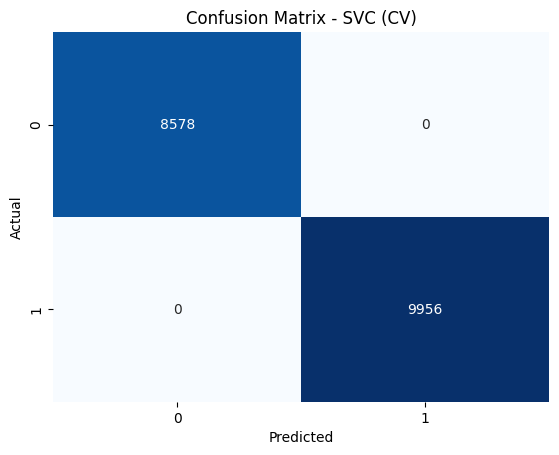

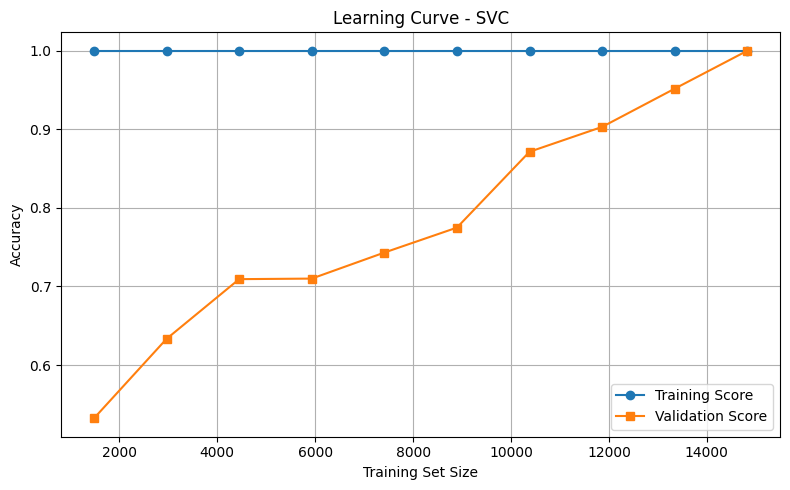

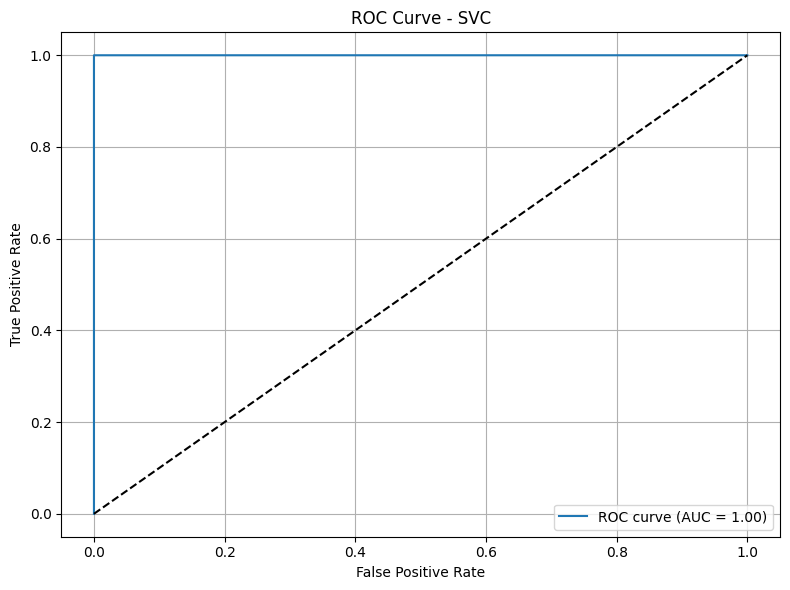

In [79]:
svm = SVC(kernel='rbf',
            C=1.0,
            gamma='scale',
            decision_function_shape='ovr',
            random_state=42,
            probability=True)

train_model_cv(growing_stress_x, growing_stress_y, svm)

Average Precision: 1.000
Average Recall:    1.000
Average F1-Score:  1.000


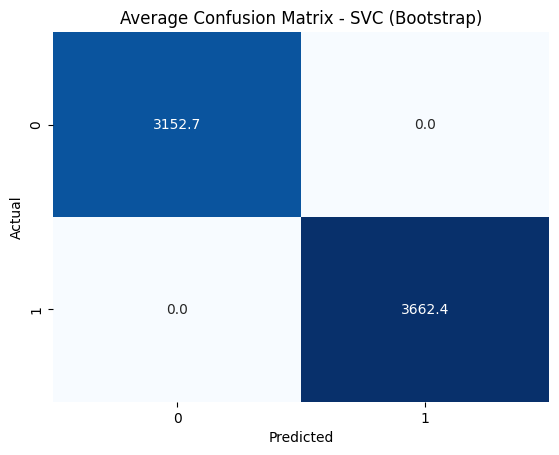

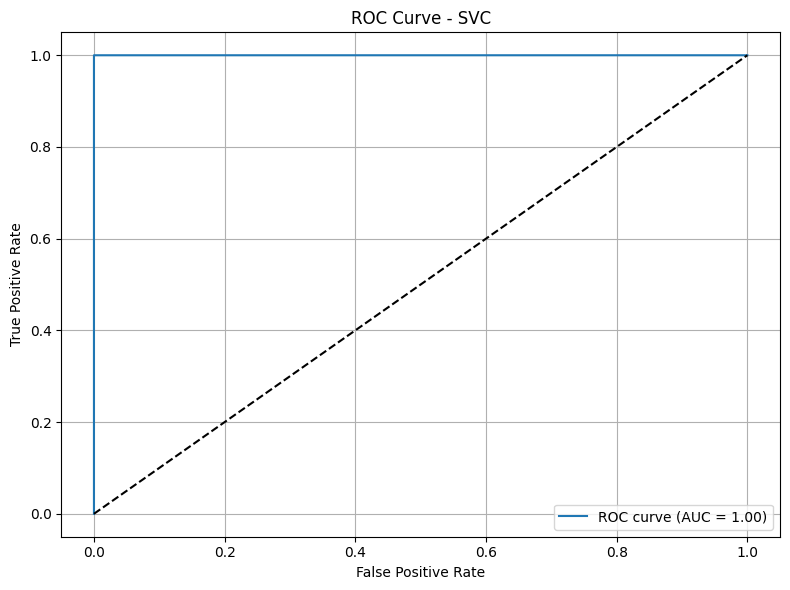

In [80]:
svm = SVC(kernel='rbf',
            C=1.0,
            gamma='scale',
            decision_function_shape='ovr',
            random_state=42,
            probability=True)

train_model_bootstrap(growing_stress_x, growing_stress_y, svm)

### Growing Stress Classification Remarks

Every single classifier besides the Logistic Regression and the Gaussian Naive Bayes has achieved a 100% on every score across all splitting methods. This could be an evident sign of overfitting, but since we plotted the learning curve for our 5 fold CV training we can erase the overfitting hypothesis since the validation score line converges into the training score line, indicating that instead of having an overfit problem, the chosen classification task, namely, predicting the growing stress feature is too easy for the given dataset. In fact, this is not so strange since the growing_stress feature has the following feature correlation:
- 0.21 with changes_habits_Yes
- 0.22 with work_interest_Yes
- 0.17 with mental_history_Yes
- 0.16 with days_indoors_Go_Out_Every_Day
- 0.13 with occupation_Student

To see how the classification models perform with a more difficult feature we will choose to predict "mood_swings" (a ternary feature) with our previous best classifiers, using the 5-fold cross-validation strategy.

### Mood Swings

In [81]:
mood_swings_classification_dataset = decided_only_df.copy()

mood_swings_x = growing_stress_classification_dataset.drop(columns=['mood_swings'])

mood_swings_y = growing_stress_classification_dataset['mood_swings']

Classification Report - LogisticRegression (Cross-Validation)
              precision    recall  f1-score   support

          No       0.70      0.65      0.67      8578
         Yes       0.72      0.75      0.73      9956

    accuracy                           0.71     18534
   macro avg       0.71      0.70      0.70     18534
weighted avg       0.71      0.71      0.71     18534



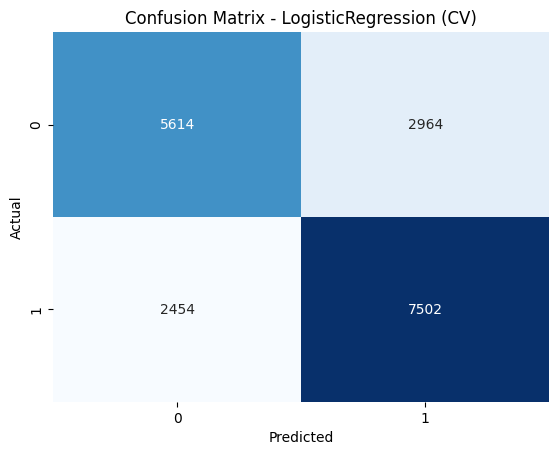

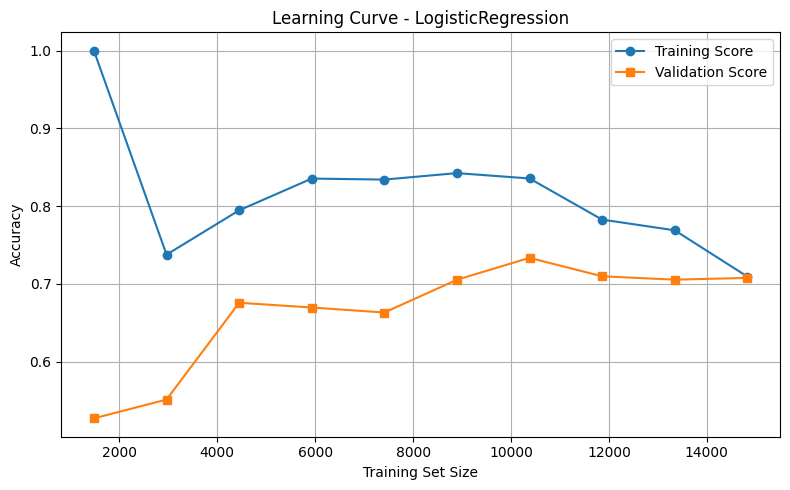

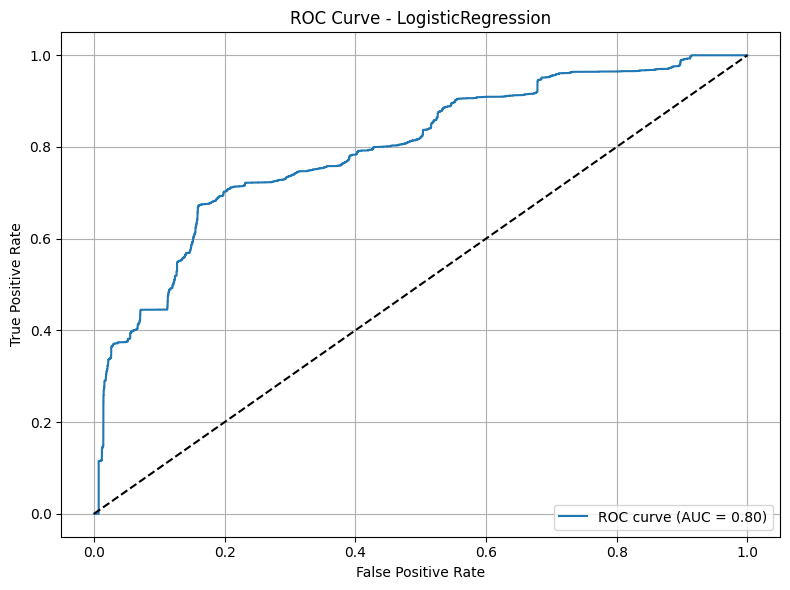

In [82]:

lg = LogisticRegression(max_iter=1000)
train_model_cv(growing_stress_x, growing_stress_y, lg)

Classification Report - GaussianNB (Cross-Validation)
              precision    recall  f1-score   support

        High       0.40      0.38      0.39      5648
         Low       0.59      0.60      0.59      7362
      Medium       0.50      0.50      0.50      5524

    accuracy                           0.50     18534
   macro avg       0.49      0.49      0.49     18534
weighted avg       0.50      0.50      0.50     18534



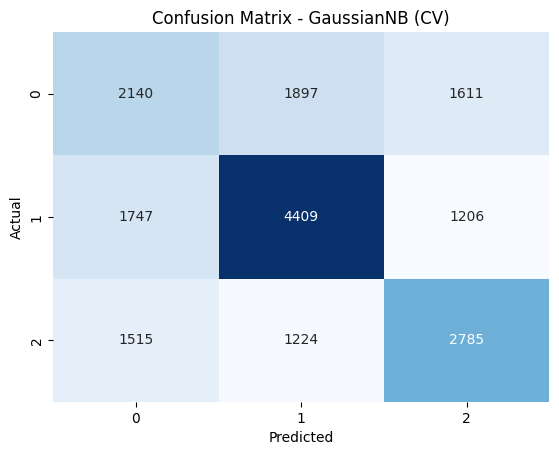

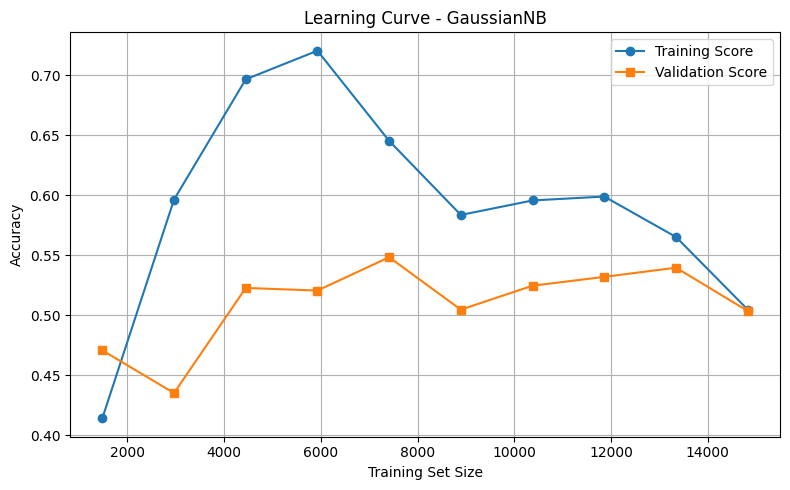

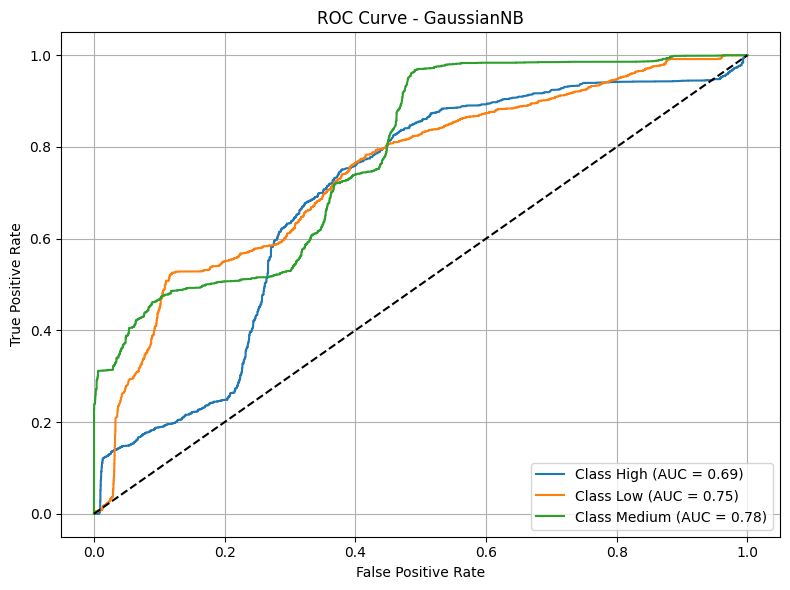

In [83]:
gnb = GaussianNB()
train_model_cv(mood_swings_x, mood_swings_y, gnb)

Classification Report - RandomForestClassifier (Cross-Validation)
              precision    recall  f1-score   support

        High       0.92      0.93      0.93      5648
         Low       0.98      0.97      0.98      7362
      Medium       0.96      0.96      0.96      5524

    accuracy                           0.96     18534
   macro avg       0.95      0.95      0.95     18534
weighted avg       0.96      0.96      0.96     18534



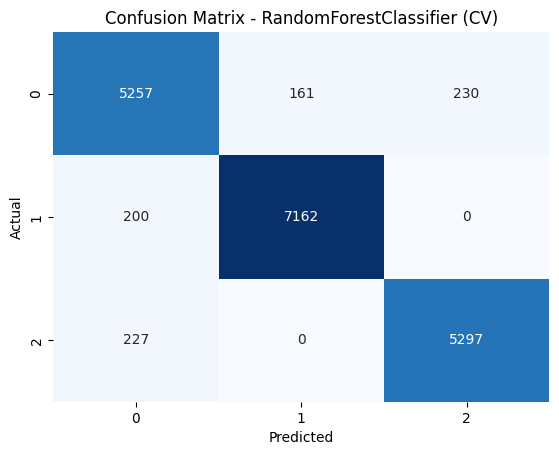

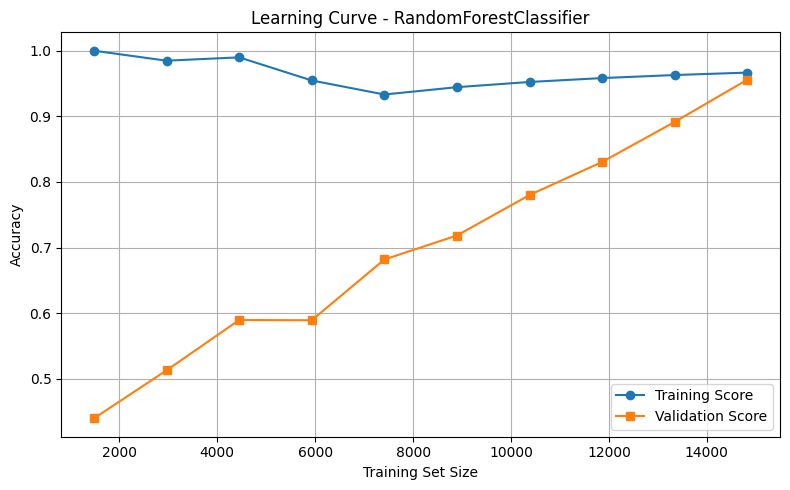

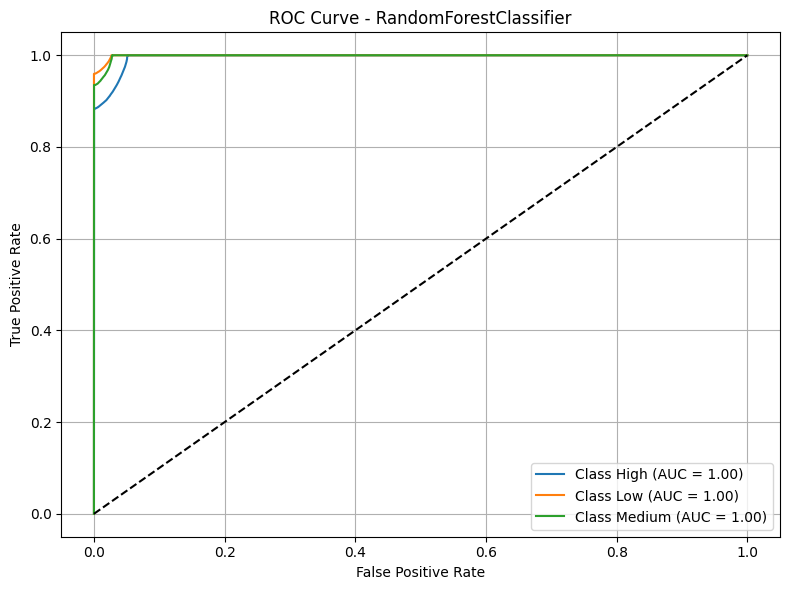

In [84]:
rf = RandomForestClassifier(random_state=42)
train_model_cv(mood_swings_x, mood_swings_y, rf)

Classification Report - DecisionTreeClassifier (Cross-Validation)
              precision    recall  f1-score   support

        High       0.92      0.93      0.93      5648
         Low       0.98      0.97      0.98      7362
      Medium       0.96      0.96      0.96      5524

    accuracy                           0.96     18534
   macro avg       0.95      0.95      0.95     18534
weighted avg       0.96      0.96      0.96     18534



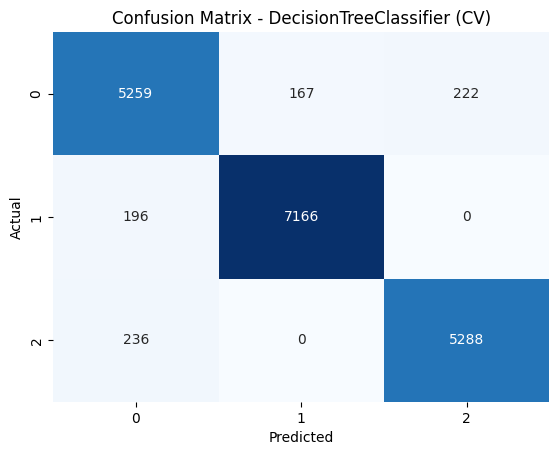

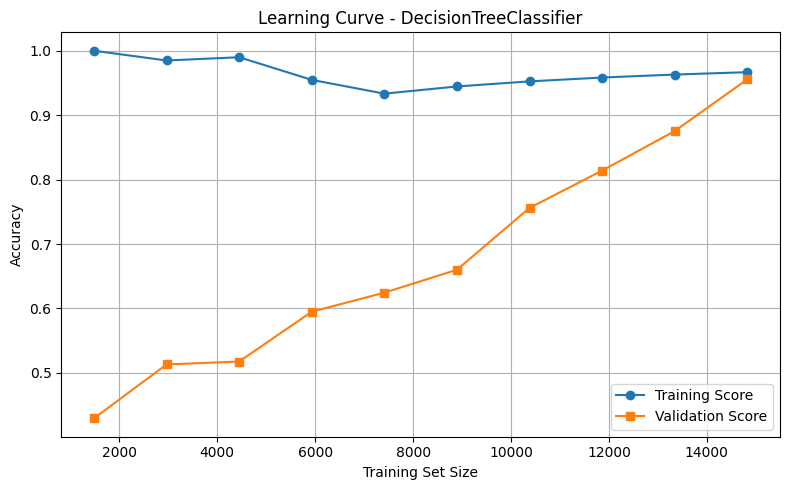

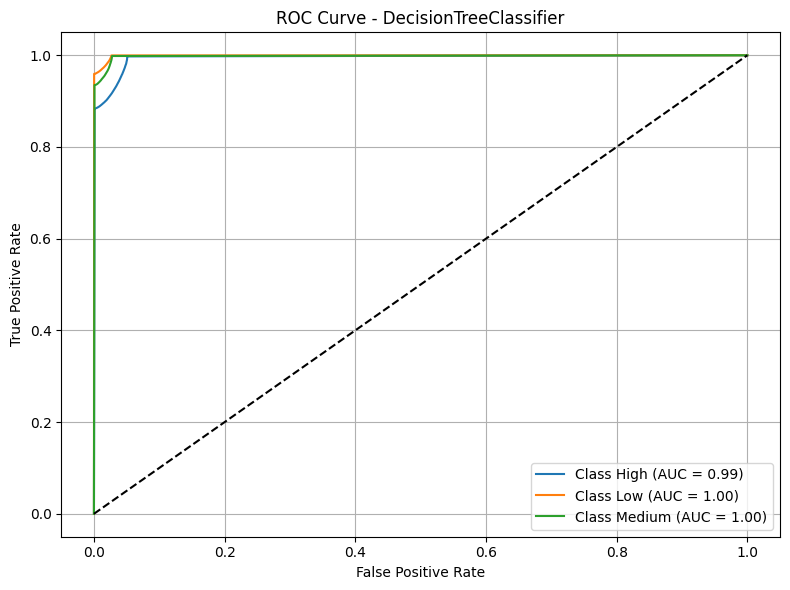

In [85]:
dt = DecisionTreeClassifier(random_state=42)
train_model_cv(mood_swings_x, mood_swings_y, dt)

Classification Report - KNeighborsClassifier (Cross-Validation)
              precision    recall  f1-score   support

        High       0.92      0.94      0.93      5648
         Low       0.96      0.99      0.97      7362
      Medium       1.00      0.94      0.97      5524

    accuracy                           0.96     18534
   macro avg       0.96      0.96      0.96     18534
weighted avg       0.96      0.96      0.96     18534



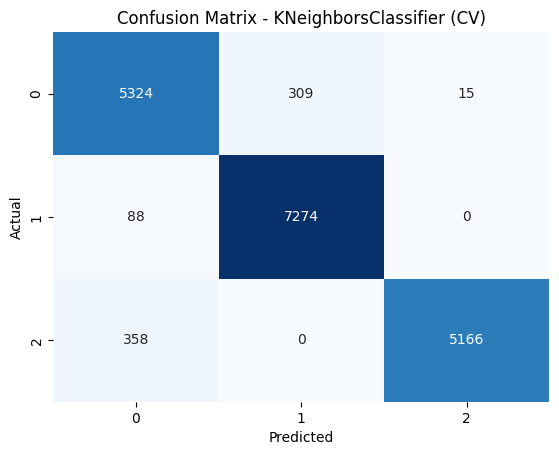

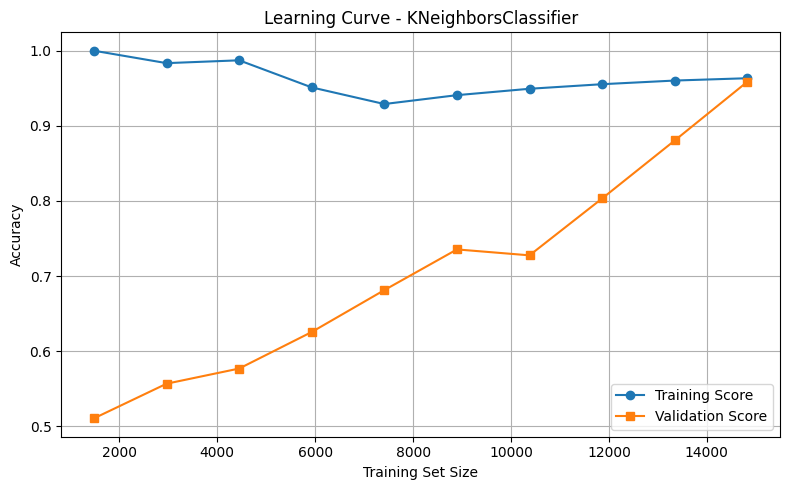

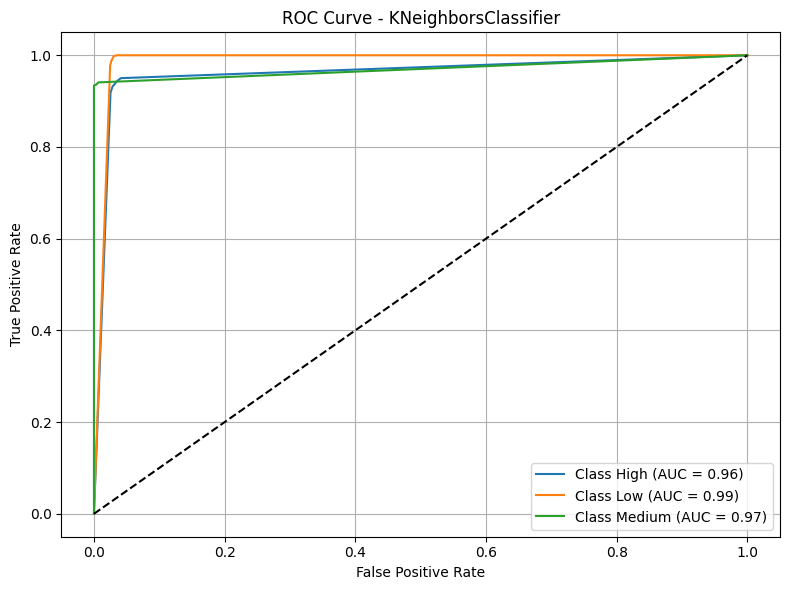

In [86]:
knn = KNeighborsClassifier(n_neighbors=4)
train_model_cv(mood_swings_x, mood_swings_y, knn)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def create_nn_model(input_dim):
    model = Sequential([
        Dense(128, activation='relu', input_shape=(input_dim,)),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(16, activation='relu'),
        Dropout(0.3),
        Dense(3, activation='softmax')
    ])
    model.compile(loss='sparse_categorical_crossentropy', optimizer=Adam(), metrics=['accuracy'])
    return model

def train_neural_network_cv(local_x, local_y, n_splits=5, epochs=20, batch_size=32, random_state=42):
    # Encode labels if categorical
    if local_y.dtype == 'object' or local_y.dtype.name == 'category':
        le = LabelEncoder()
        local_y_enc = le.fit_transform(local_y)
    else:
        local_y_enc = local_y.values if hasattr(local_y, "values") else local_y

    categorical_cols = local_x.select_dtypes(include='object').columns
    numeric_cols = local_x.select_dtypes(include=['int64', 'float64']).columns

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    train_accuracies = []
    val_accuracies = []

    fold_reports = []
    fold_conf_matrices = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(local_x, local_y_enc), 1):
        print(f"Fold {fold}")

        X_train_raw, X_val_raw = local_x.iloc[train_idx], local_x.iloc[val_idx]
        y_train, y_val = local_y_enc[train_idx], local_y_enc[val_idx]

        # Preprocessing pipeline fitted on train only to avoid leakage
        preprocessor = ColumnTransformer([
            ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
            ('num', StandardScaler(), numeric_cols)
        ])
        preprocessor.fit(X_train_raw)
        X_train = preprocessor.transform(X_train_raw)
        X_val = preprocessor.transform(X_val_raw)

        # Create and train the model
        model = create_nn_model(input_dim=X_train.shape[1])

        history = model.fit(X_train, y_train,
                            epochs=epochs,
                            batch_size=batch_size,
                            verbose=0,
                            validation_data=(X_val, y_val))

        # Collect accuracy for learning curve
        train_acc = history.history['accuracy'][-1]
        val_acc = history.history['val_accuracy'][-1]
        train_accuracies.append(train_acc)
        val_accuracies.append(val_acc)

        # Predict for classification report & confusion matrix
        # Get probabilities for all 3 classes
        y_val_pred_prob = model.predict(X_val)
        # Pick class with highest probability
        y_val_pred = y_val_pred_prob.argmax(axis=1)

        print(classification_report(y_val, y_val_pred))
        fold_reports.append(classification_report(y_val, y_val_pred, output_dict=True))
        cm = confusion_matrix(y_val, y_val_pred)
        fold_conf_matrices.append(cm)

        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title(f"Confusion Matrix - Fold {fold}")
        plt.show()

    # Plot learning curve (average over folds)
    plt.plot(range(1, n_splits+1), train_accuracies, label='Train Accuracy')
    plt.plot(range(1, n_splits+1), val_accuracies, label='Validation Accuracy')
    plt.xlabel('Fold')
    plt.ylabel('Accuracy')
    plt.title('Learning Curve Across Folds (Final Epoch Accuracy)')
    plt.legend()
    plt.grid()
    plt.show()

    return fold_reports, fold_conf_matrices

Fold 1


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
              precision    recall  f1-score   support

           0       0.90      1.00      0.95      1130
           1       1.00      0.97      0.98      1472
           2       1.00      0.93      0.96      1105

    accuracy                           0.97      3707
   macro avg       0.97      0.97      0.96      3707
weighted avg       0.97      0.97      0.97      3707



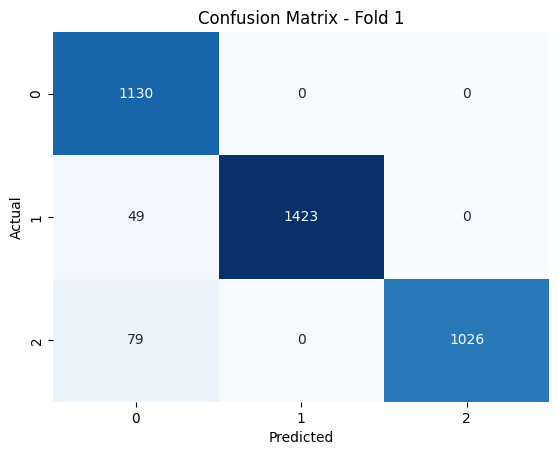

Fold 2


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
              precision    recall  f1-score   support

           0       0.94      0.94      0.94      1130
           1       0.96      1.00      0.98      1472
           2       1.00      0.94      0.97      1105

    accuracy                           0.96      3707
   macro avg       0.97      0.96      0.96      3707
weighted avg       0.97      0.96      0.96      3707



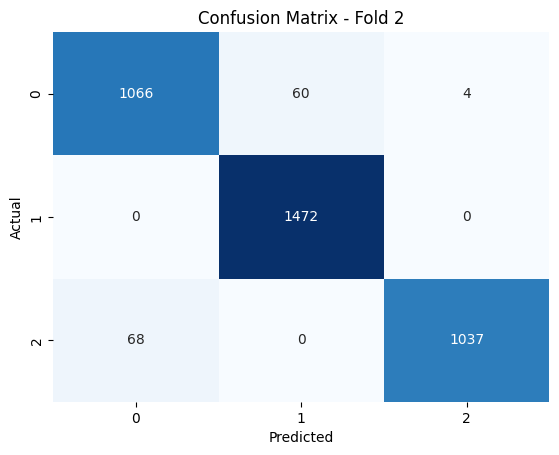

Fold 3


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
              precision    recall  f1-score   support

           0       0.96      0.92      0.94      1129
           1       0.98      0.97      0.98      1473
           2       0.94      1.00      0.97      1105

    accuracy                           0.96      3707
   macro avg       0.96      0.96      0.96      3707
weighted avg       0.96      0.96      0.96      3707



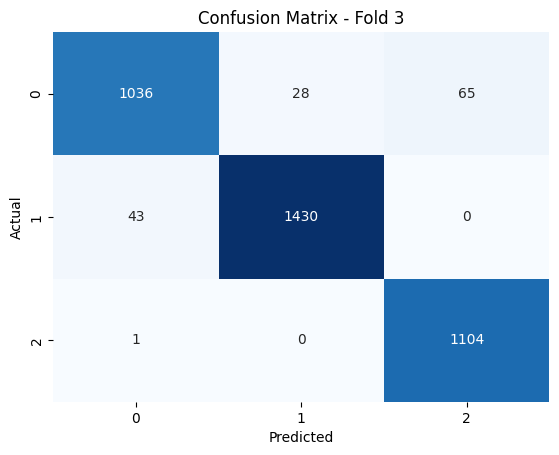

Fold 4


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
              precision    recall  f1-score   support

           0       0.94      0.95      0.94      1129
           1       0.96      1.00      0.98      1473
           2       1.00      0.94      0.97      1105

    accuracy                           0.97      3707
   macro avg       0.97      0.96      0.96      3707
weighted avg       0.97      0.97      0.97      3707



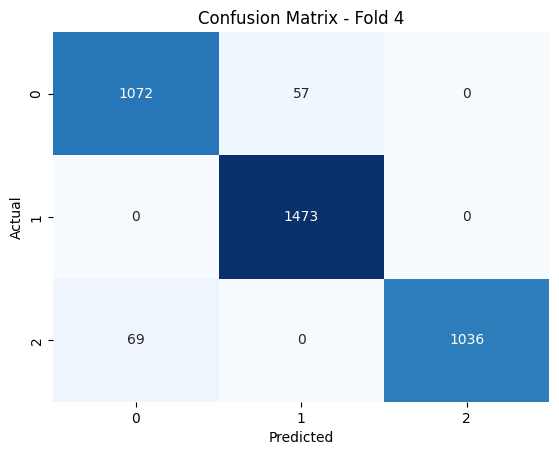

Fold 5


/Users/andre_butuc/FEUP/ADES/ades-project/venv/lib/python3.11/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
              precision    recall  f1-score   support

           0       0.89      1.00      0.94      1130
           1       1.00      0.96      0.98      1472
           2       1.00      0.93      0.97      1104

    accuracy                           0.96      3706
   macro avg       0.96      0.96      0.96      3706
weighted avg       0.97      0.96      0.96      3706



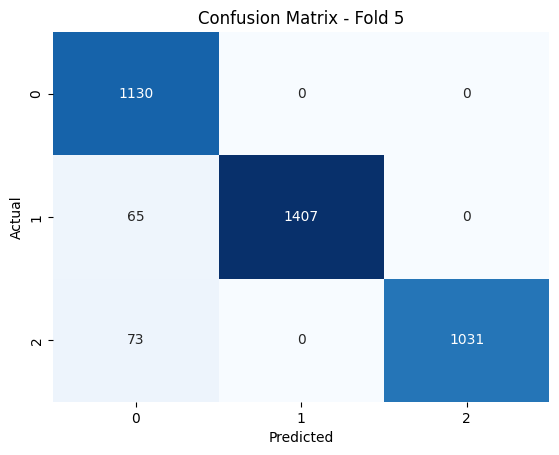

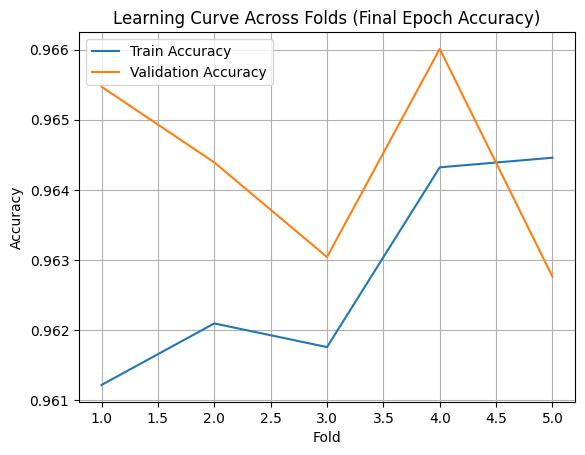

In [88]:
fold_reports, fold_conf_matrices = train_neural_network_cv(mood_swings_x, mood_swings_y, epochs=30)

Classification Report - SVC (Cross-Validation)
              precision    recall  f1-score   support

        High       0.95      0.92      0.94      5648
         Low       0.96      1.00      0.98      7362
      Medium       0.97      0.96      0.96      5524

    accuracy                           0.96     18534
   macro avg       0.96      0.96      0.96     18534
weighted avg       0.96      0.96      0.96     18534



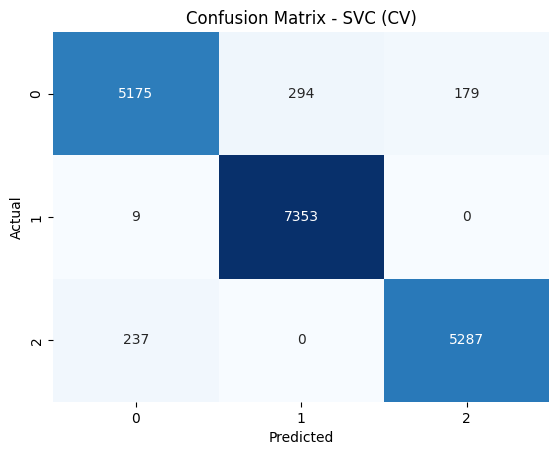

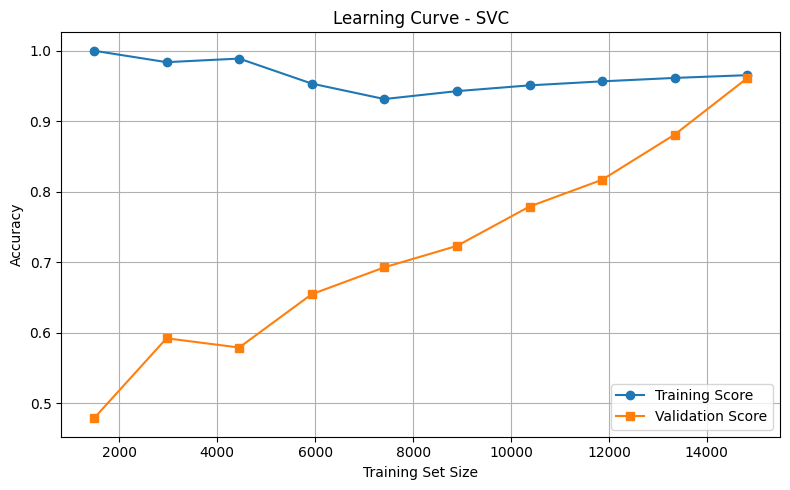

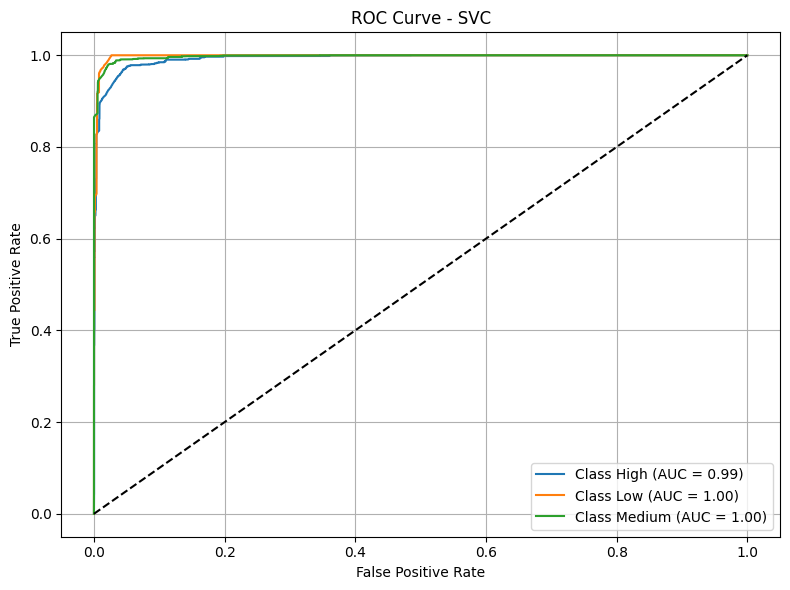

In [89]:
svm = SVC(kernel='rbf',
            C=1.0,
            gamma='scale',
            decision_function_shape='ovr',
            random_state=42,
            probability=True)

train_model_cv(mood_swings_x, mood_swings_y, svm)

### Mood Swings Classification Remarks

In this classification task, no classifier achieved a 100% score.

We got the following results by using a data split strategy of cross-validation with 5 folds and extracting the "Precision", "Recall" and "F1-Score" from the weighted average classification report.

| Classifier | Precision | Recall | F1-Score |
| ---------  | ----------| ------ | -------- |
| Logistic Regression | 0.71 | 0.71 | 0.71 | 
| Gaussian Naive Bayes | 0.50 | 0.50 | 0.50 |
| Random Forest | 0.96 | 0.96 | 0.96 |
| Decision Tree | 0.96 | 0.96 | 0.96 |
| K Nearest Neighbours | 0.96 | 0.96 | 0.96 |
| Neural Network | 0.97 | 0.97 | 0.97 |
| Support Vector Machine | 0.96 | 0.96 | 0.96 |

The classifier that performed best was the Neural Network with 97%; however, the rest of the classifier, except the Logistic Regression and the Gaussian Naive Bayes, also performed equally good and much faster. Since the scores were high, we plotted the learning curve once again to exclude the hypothesis of having overfit the model, and since there is a convergence of the validation score line and the training score line, we can confirm that due to the nature of the dataset the task of predicing the mood_swings feature was easy for our chosen classifiers.

### Final Data Analysis Remarks

With the performed exploratory data analysis work we were able to observe interesting clustering patterns, as well as correlate people's behaviours, allowing also to train classifiers capable of predicting symptoms that can proactively help patients to be properly diagnosed and taken care of by health care professionals.